In [2277]:
import sys
print(sys.version)

3.6.2 |Continuum Analytics, Inc.| (default, Jul 20 2017, 13:14:59) 
[GCC 4.2.1 Compatible Apple LLVM 6.0 (clang-600.0.57)]


In [1233]:
"""
Created on October 9 2018
@author: Neven Caplar
@contact: ncaplar@princeton.edu

These comments are theoretically the only ones you need to read to run the notebook

1. Specify the directory in which you want to run the analysis below (PSF_DIRECTORY)
2. Name and place the data in DATA_FOLDER. The data is avaliable at https://github.com/nevencaplar/PFS_Work_In_Progress/tree/master/CutsForTigerMay2
3. TESTING_FOLDER will be filled during the run with images from the analysis analysis

4. (OPTIONAL)Next cell contains some extensions that I use that make life much easier when using jupyter notebook 
    Without them this notebook becomes reallllly huge and hard to deal with
    These can be downloaded from https://github.com/ipython-contrib/jupyter_contrib_nbextensions

"""
############################################################
# name your directory where you want to have files!
PSF_DIRECTORY='/Users/nevencaplar/Documents/PFS/'
# place cutouts in this folder - name as you wish
DATA_FOLDER=PSF_DIRECTORY+'TigerAnalysis/CutsForTigerMay2/'
############################################################
    

TESTING_FOLDER=PSF_DIRECTORY+'Testing/'
TESTING_PUPIL_IMAGES_FOLDER=TESTING_FOLDER+'Pupil_Images/'
TESTING_WAVEFRONT_IMAGES_FOLDER=TESTING_FOLDER+'Wavefront_Images/'
TESTING_FINAL_IMAGES_FOLDER=TESTING_FOLDER+'Final_Images/'
import os

for i in [PSF_DIRECTORY,DATA_FOLDER,TESTING_PUPIL_IMAGES_FOLDER,TESTING_WAVEFRONT_IMAGES_FOLDER,TESTING_FINAL_IMAGES_FOLDER]:
    if not os.path.exists(i):
        os.makedirs(i)  

In [1234]:
%%javascript
try {
  require(['base/js/utils'], function (utils) {
    utils.load_extension('code_prettify/code_prettify');
    utils.load_extension('collapsible_headings/main'); 
    utils.load_extension('codefolding/edit'); 
    utils.load_extension('codefolding/main'); 
    utils.load_extension('execute_time/ExecuteTime');   
    utils.load_extension('toc2/main'); 
  });
}
catch (err) {
  console.log('toc2 load error:', err);
}

<IPython.core.display.Javascript object>

In [1235]:
# make notebook nice and wide to fill the entire screen
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2280]:
%load_ext autoreload
%autoreload 2

#import Zernike_Module
#from Zernike_Module import LNP_PFS,LN_PFS_single,create_parInit,downsample_manual_function,Zernike_Analysis,PFSPupilFactory,custom_fftconvolve,stepK,maxK,sky_scale,sky_size,create_x,remove_pupil_parameters_from_all_parameters

#Zernike_Module_lastOct15_beforeScatterChange
import Zernike_Module_lastOct15_beforeScatterChange
from Zernike_Module_lastOct15_beforeScatterChange import LNP_PFS,LN_PFS_single,create_parInit,downsample_manual_function,Zernike_Analysis,PFSPupilFactory,custom_fftconvolve,stepK,maxK,sky_scale,sky_size,create_x,remove_pupil_parameters_from_all_parameters

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2279]:
#general import statments
from __future__ import absolute_import, division, print_function
import galsim
import numpy as np
np.set_printoptions(suppress=True)
np.seterr(divide='ignore', invalid='ignore')
import pandas as pd
import io
import math

#tqdm is not necesarry, it is the monitor evaluation of the 'for' loops
from tqdm import tqdm

# lsst stack
#import lsst.afw
#from lsst.afw.cameraGeom import PupilFactory
#from lsst.afw.geom import Angle, degrees
#from lsst.afw import geom
#from lsst.afw.geom import Point2D

# astropy
import astropy
import astropy.convolution
from astropy.convolution import Gaussian2DKernel

# scipy and skimage
#from scipy.ndimage import gaussian_filter
import scipy.misc
import skimage.transform

#lmfit
import lmfit

#matplotlib
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
matplotlib.rcParams.update({'font.size': 22})
%config InlineBackend.rc = {}
%matplotlib inline

from shutil import copy
from scipy.optimize import curve_fit

def lin_fit_1D(x, a, b):
    return a * x + b

def lin_fit_1DConstant(x, b):
    return  np.full(len(x),b)

def lin_fit_2D(x,y, a, b,c):
    return a * x + b*y+c

AttributeError: 'NoneType' object has no attribute 'name'

### 'unit test'

In [1308]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_radius','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  




sci_image_unit=np.ones((50,50))
var_image_unit=np.ones((50,50))

allparameters_proposal=np.array([20,0.09,0.02,-0.1,0.0,0.1,0.02,0.2,
                                 0.65,0.1,0.0,0.0,0.07,-0.2,
                                 0.7,1,-0.0,0.00,
                                 0.0,0.0,0.90,
                                 0.1,1,0.28,
                                 50000,20,2.5,0.27,
                                 0.47,1.85,1.0])

model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=1)   

res=model(allparameters_proposal)
print(res)
#assert res=-4808.04
#print('ok')

-5408.13889972


In [1309]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')

optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled

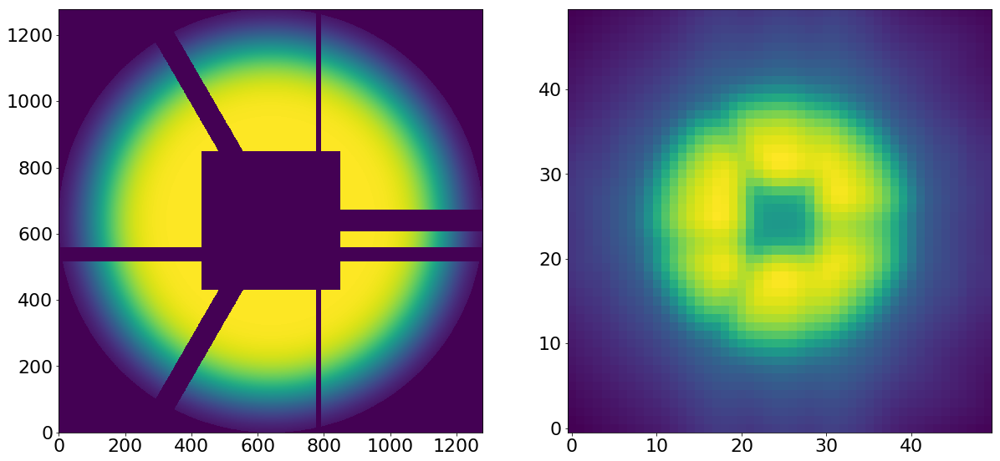

In [1310]:
plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(pupililluminated,origin='lower')

plt.subplot(122)
plt.imshow(res_iapetus,norm=LogNorm(),origin='lower')

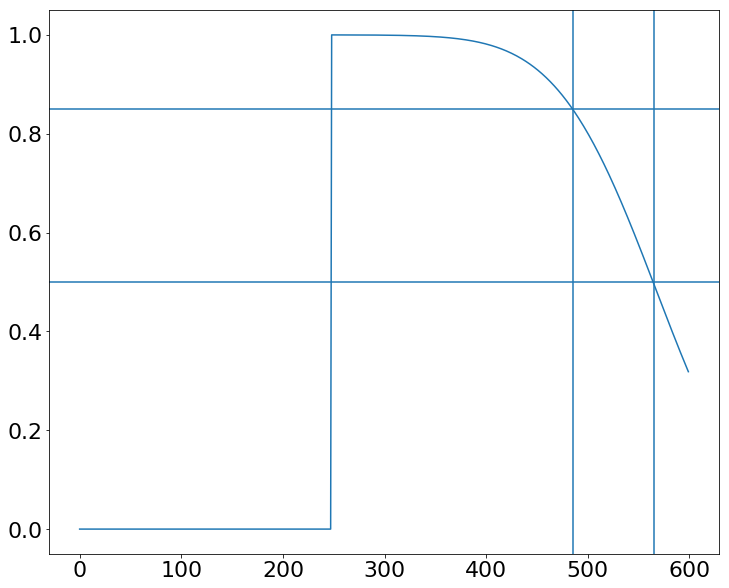

In [1317]:
plt.plot(pupililluminated[:,600][600:1200])
plt.axhline(0.5)
plt.axvline(565)
plt.axhline(0.85)
plt.axvline(485)

# Analysis (Single)

## Scripts

In [158]:
#MPI
for single_spot in [2,22,32,42,52,72,82,92,3,23,33,43,53,73,83,93,4,24,34,44,54,74,84,94,5,25,35,45,55,75,85,95,7,27,37,47,57,77,87,97]:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T'+str(1)+'S'+str(single_spot)+'Oct.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 14:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n")
    file.write("#SBATCH --exclude=tiger-h19c1n24 \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    for obs in [8555,8624,8603,8606,8573,8600,8612,8567,8552,8627,8621,8558]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Oct_MPI.py "+str(obs)+" "+str(single_spot)+" 75 5\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/OctScriptToSubmitScriptsTiger'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in [2,22,32,42,52,72,82,92,3,23,33,43,53,73,83,93,4,24,34,44,54,74,84,94,5,25,35,45,55,75,85,95,7,27,37,47,57,77,87,97]:
    file.write('sbatch /home/ncaplar/Scripts/T'+str(1)+'S'+str(single_spot)+'Oct.sh \n')

        
file.close()

In [149]:
#MPI
for single_spot in [0,1,8,9,90,91,98,99,6,26,36,46,56,76,86,96]:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/P'+str(1)+'S'+str(single_spot)+'Oct.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=6 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 23:59:00 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n")

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    for obs in [8555,8624,8603,8606,8573,8600,8612,8567,8552,8627,8621,8558]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Oct_MPI.py "+str(obs)+" "+str(single_spot)+" 75 5\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/OctScriptToSubmitScriptsPerseus'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in [0,1,8,9,90,91,98,99,6,26,36,46,56,76,86,96]:
    file.write('sbatch /home/ncaplar/Scripts/P'+str(1)+'S'+str(single_spot)+'Oct.sh \n')

        
file.close()

## Focus scripts

In [249]:
print(len(np.array([2,22,32,42,52,72,82,92,3,23,33,43,53,73,83,93,4,24,34,44,54,74,84,94,5,25,35,45,55,75,85,95,7,27,37,47,57,77,87,97])))
list_split=np.split(np.array([2,22,32,42,52,72,82,92,3,23,33,43,53,73,83,93,4,24,34,44,54,74,84,94,5,25,35,45,55,75,85,95,7,27,37,47,57,77,87,97]),20)

40


In [250]:
#MPI
for i in range(20):

    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T'+str(1)+'S'+str(i)+'Oct.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 5:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n")
    file.write("#SBATCH --exclude=tiger-h19c1n24 \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    single_spot=list_split[i][0]
    for obs in [8600,8600,8603,8573]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Oct_MPI_focus.py "+str(obs)+" "+str(single_spot)+" 75 6\n")
    single_spot=list_split[i][1]
    for obs in [8600,8600,8603,8573]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Oct_MPI_focus.py "+str(obs)+" "+str(single_spot)+" 75 6\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/OctScriptToSubmitScriptsTiger'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for i in range(20):
    file.write('sbatch /home/ncaplar/Scripts/T'+str(1)+'S'+str(i)+'Oct.sh \n')

        
file.close()

In [251]:
#MPI

list_split=np.split(np.array([0,1,8,9,90,91,98,99,6,26,36,46,56,76,86,96]),4)

for i in range(4):
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/P'+str(1)+'S'+str(single_spot)+'Oct.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=6 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 23:59:00 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n")

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    single_spot=list_split[i][0]
    for obs in [8600,8600,8603,8573]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Oct_MPI_focus.py "+str(obs)+" "+str(single_spot)+" 75 6\n")
    single_spot=list_split[i][1]
    for obs in [8600,8600,8603,8573]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Oct_MPI_focus.py "+str(obs)+" "+str(single_spot)+" 75 6\n")
    single_spot=list_split[i][2]    
    for obs in [8600,8600,8603,8573]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Oct_MPI_focus.py "+str(obs)+" "+str(single_spot)+" 75 6\n")
    single_spot=list_split[i][3]
    for obs in [8600,8600,8603,8573]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Oct_MPI_focus.py "+str(obs)+" "+str(single_spot)+" 75 6\n")
    
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/OctScriptToSubmitScriptsPerseus'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for i in range(4):
    file.write('sbatch /home/ncaplar/Scripts/P'+str(1)+'S'+str(single_spot)+'Oct.sh \n')

        
file.close()

## Focus scripts 2nd round on Oct 16

In [270]:
#MPI
list_split=np.split(np.array([2,22,32,42,52,72,82,92,3,23,33,43,53,73,83,93,4,24,34,44,54,74,84,94,5,25,35,45,55,75,85,95,7,27,37,47,57,77,87,97]),2)



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T'+str(1)+'S'+str(1)+'Oct.sh','w') 
file.write("#!/bin/bash \n")
file.write("#SBATCH --nodes=4 # node count \n")
file.write("#SBATCH --ntasks-per-node=40 \n") 
file.write("#SBATCH --time 5:59:59 \n")
file.write("#SBATCH --mail-type=begin  \n")
file.write("#SBATCH --mail-type=end   \n") 
file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n")
file.write("#SBATCH --exclude=tiger-h19c1n24 \n") 

file.write("\n")
file.write("#1. Observation (e.g., 8567) \n") 
file.write("#2. Threads \n") 
file.write("#3. Steps \n") 
file.write("\n")

for i in range(20):
    single_spot=list_split[1][i]
    for obs in [8606]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Oct_MPI_focus.py "+str(obs)+" "+str(single_spot)+" 75 6\n")



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T'+str(1)+'S'+str(2)+'Oct.sh','w') 
file.write("#!/bin/bash \n")
file.write("#SBATCH --nodes=4 # node count \n")
file.write("#SBATCH --ntasks-per-node=40 \n") 
file.write("#SBATCH --time 5:59:59 \n")
file.write("#SBATCH --mail-type=begin  \n")
file.write("#SBATCH --mail-type=end   \n") 
file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n")
file.write("#SBATCH --exclude=tiger-h19c1n24 \n") 

file.write("\n")
file.write("#1. Observation (e.g., 8567) \n") 
file.write("#2. Threads \n") 
file.write("#3. Steps \n") 
file.write("\n")

for i in range(20):
    single_spot=list_split[0][i]
    for obs in [8606]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Oct_MPI_focus.py "+str(obs)+" "+str(single_spot)+" 75 6\n")        

    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/OctScriptToSubmitScriptsTiger'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for i in range(2):
    file.write('sbatch /home/ncaplar/Scripts/T'+str(1)+'S'+str(i)+'Oct.sh \n')

        
file.close()

In [272]:
#MPI

list_split=np.split(np.array([0,1,8,9,90,91,98,99,6,26,36,46,56,76,86,96]),4)

for i in range(4):
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T'+str(1)+'S'+str(i)+'Oct.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 5:59:00 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n")

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    single_spot=list_split[i][0]
    for obs in [8606,8600,8603,8573]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Oct_MPI_focus.py "+str(obs)+" "+str(single_spot)+" 75 6\n")
    single_spot=list_split[i][1]
    for obs in [8606,8600,8603,8573]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Oct_MPI_focus.py "+str(obs)+" "+str(single_spot)+" 75 6\n")
    single_spot=list_split[i][2]    
    for obs in [8606,8600,8603,8573]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Oct_MPI_focus.py "+str(obs)+" "+str(single_spot)+" 75 6\n")
    single_spot=list_split[i][3]
    for obs in [8606,8600,8603,8573]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Oct_MPI_focus.py "+str(obs)+" "+str(single_spot)+" 75 6\n")
    
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/OctScriptToSubmitScriptsTiger'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for i in range(4):
    file.write('sbatch /home/ncaplar/Scripts/T'+str(1)+'S'+str(i)+'Oct.sh \n')

        
file.close()

## preparation for scripts

### analysis of the test runs

In [164]:
obs='8552'
single_number='82'
image_index=int(single_number)
eps=5
#date='Sep19'
#date='Sep28'
date='Oct5'


obs_possibilites=np.array([8552,8555,8558,8561,8564,8567,8570,8573,8603,8600,8606,8609,8612,8615,8618,8621,8624,8627])
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]

if obs=='8600':
    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned_Dithered.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked_Dithered.npy')
else:       
    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked.npy')

In [165]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()

(number of walkers, number of steps, number of parameters): (248, 100, 31)
minimal likelihood is: 11921.5290647
minimal chi2 reduced is: 6.61846969492


In [166]:
results_of_fit_many_interpolation=np.load("/Users/nevencaplar/Documents/PFS/Fit_Results/Oct2018/results_of_fit_many_interpolation_preOctoberrun.pkl")
minchain=results_of_fit_many_interpolation['m4'].loc[46].values[:31]

In [167]:
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)

         z4       z5        z6        z7        z8        z9       z10  \
0  27.69776 -0.55644 -0.791879  0.611872 -0.027205 -0.160192 -0.226683   

        z11  
0 -0.733449  
    hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy  \
0  0.680592    0.08084  0.050211  0.081485  0.067365      0.18047   

   radiometricEffect  radiometricExponent    x_ilum    y_ilum  
0           0.953455             0.884105  0.036867  0.008806  
   x_fiber  y_fiber  effective_radius_illumination  frd_sigma  det_vert  \
0      0.0      0.0                       0.922886   0.015728  1.039369   

   slitHolder_frac_dx  grating_lines  scattering_radius  scattering_slope  \
0              0.1425   15952.406394          15.546777          2.349828   

   scattering_amplitude  pixel_effect   fiber_r      flux  
0              0.077712       0.49719  1.907719  0.995147  


In [168]:
if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1)   
    
minchain[19]=-0.2
model(minchain)
#model(allparameters_proposal)

-312258.61317564035

In [151]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')
aperilluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'aperilluminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')


optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')

optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled

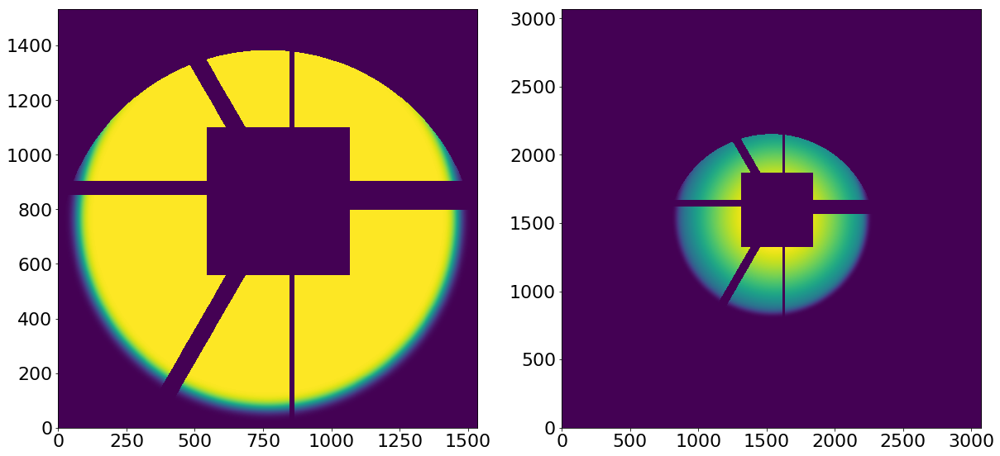

In [152]:
plt.figure(figsize=(20,12))
plt.subplot(121)
plt.imshow(pupililluminated,origin='lower')
plt.subplot(122)
plt.imshow(ilum_radiometric,origin='lower')

chi**2 reduced is: 368.383204517
Abs of residual divided by total flux is: 0.229002194964
Abs of residual divided by largest value of a flux in the image is: 0.276364713548


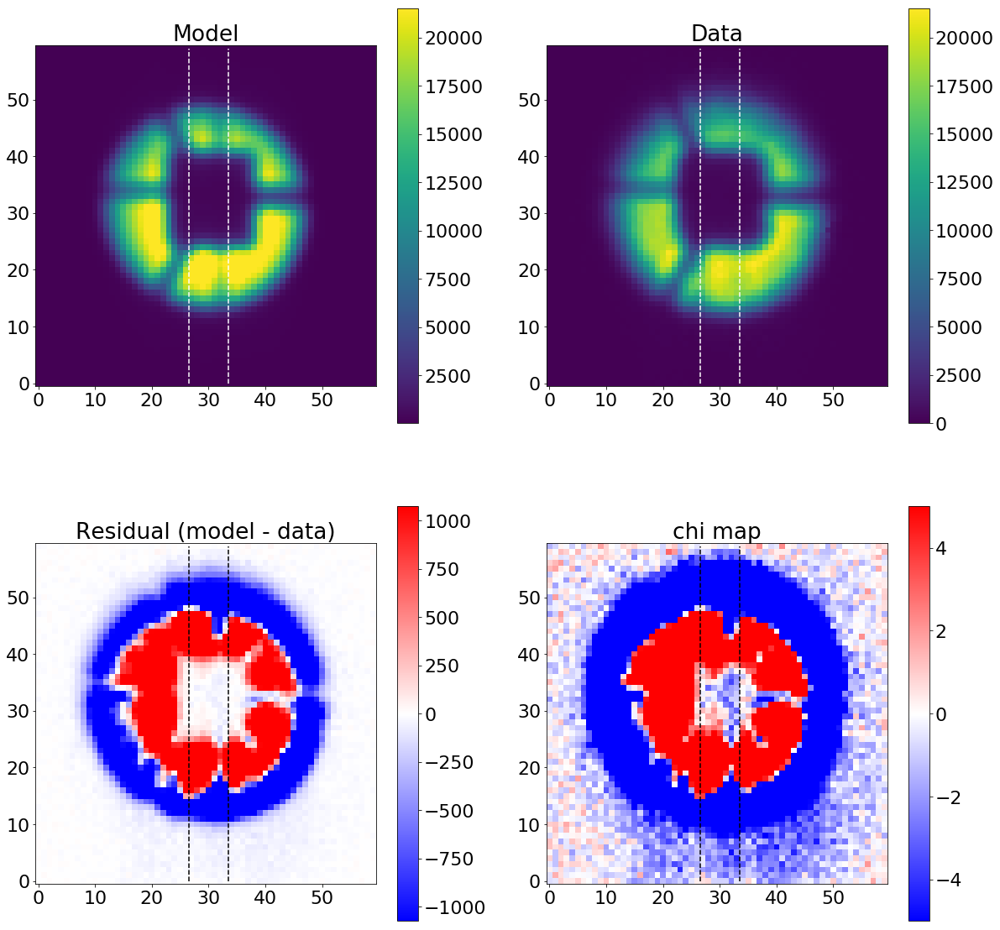

In [153]:
single_analysis.create_basic_comparison_plot()

## Analysis of the defocused data

###  Core Analysis (pandas dataframe creation)

#### Defocus plots 

In [140]:
def create_minchain_err(chain0,likechain0,sci_image,var_image,old=0):
    minchain_err_test=[]
    for var_number in range(len(columns)):
        #ravel likelihood
        likechain0_Emcee3_ravel=np.ravel(likechain0)

        # connect chain and lnchain
        chain0_Emcee3_ravel=np.ravel(chain0[:,:,var_number])
        chain0_Emcee3_ravel_argsort=np.argsort(chain0_Emcee3_ravel)  
        chain0_Emcee3_ravel_sort=chain0_Emcee3_ravel[chain0_Emcee3_ravel_argsort]
        likechain0_Emcee3_ravel_sort=likechain0_Emcee3_ravel[chain0_Emcee3_ravel_argsort]

        # move to chi2 space
        chi2_Emcee3_ravel_sort=-(np.array(likechain0_Emcee3_ravel_sort)*(2)-np.log(2*np.pi*np.sum(var_image)))/(sci_image.shape[0])**2
        min_chi2_Emcee3_ravel_sort=np.min(chi2_Emcee3_ravel_sort)

        # simplest standard deviation
        std_chain=np.std(chain0_Emcee3_ravel_sort)

        #best solution
        mean_chain=chain0_Emcee3_ravel_sort[chi2_Emcee3_ravel_sort==np.min(chi2_Emcee3_ravel_sort)][0]

        # step size
        step=std_chain/10

        # create result 3*std in each direction
        try:
            res=[]
            for i in np.arange(mean_chain-30*step,mean_chain+30*step,step):
                selected_chi2_Emcee3_ravel_sort=chi2_Emcee3_ravel_sort[(np.array(chain0_Emcee3_ravel_sort<i+step)&np.array(chain0_Emcee3_ravel_sort>i))]
                if len(selected_chi2_Emcee3_ravel_sort>10):   
                    res.append([i+step/2,np.min(chi2_Emcee3_ravel_sort[(np.array(chain0_Emcee3_ravel_sort<i+step)&np.array(chain0_Emcee3_ravel_sort>i))])])

            res=np.array(res)

            #print(columns[var_number]+' min : '+str(mean_chain))
            #print(columns[var_number]+' std : '+str(std_chain))

            # find low limit and high limit
            res_within2_chi=res[res[:,1]<min_chi2_Emcee3_ravel_sort*2]
            minchain_err_element=[-np.abs(mean_chain-res_within2_chi[0,0]),np.abs(res_within2_chi[-1,0]-mean_chain)]
        except IndexError:
            if var_number!=25:
                print(columns[var_number]+': failed!')
                minchain_err_element=[-mean_chain,mean_chain]

        minchain_err_test.append(minchain_err_element)
        #print(columns[var_number]+' min_err : '+str(minchain_err_element[0]))
        #print(columns[var_number]+' max_err : '+str(minchain_err_element[1]))
    if old==1:
        minchain_err_test=np.mean(np.abs(np.array(minchain_err_test)),axis=1)
        return minchain_err_test
    else:       
        return np.array(minchain_err_test)
    
    
import scipy.optimize as optimize
def curve_fit_custom_lin(V,index_arr,z4_arr,z4_arr_err_low,z4_arr_err_up):
    a,b=V
    yfit=lin_fit_1D(index_arr,a,b)
    weight=np.ones_like(yfit)
    weight[yfit>z4_arr]=z4_arr_err_up[yfit>z4_arr] # if the fit point is above the measure, use upper weight
    weight[yfit<=z4_arr]=z4_arr_err_low[yfit<=z4_arr] # else use lower weight
    return (yfit-z4_arr)**2/weight**2

def curve_fit_custom_con(V,index_arr,z4_arr,z4_arr_err_low,z4_arr_err_up):
    a=V
    yfit=lin_fit_1DConstant(index_arr,a)
    weight=np.ones_like(yfit)
    weight[yfit>z4_arr]=z4_arr_err_up[yfit>z4_arr] # if the fit point is above the measure, use upper weight
    weight[yfit<=z4_arr]=z4_arr_err_low[yfit<=z4_arr] # else use lower weight
    return (yfit-z4_arr)**2/weight**2    

In [141]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
              'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
              'radiometricEffect','radiometricExponent',
              'x_ilum','y_ilum',
              'x_fiber','y_fiber','effective_radius_illumination','frd_sigma','det_vert','slitHolder_frac_dx',
              'grating_lines','scattering_radius','scattering_slope','scattering_amplitude',
              'pixel_effect','fiber_r','flux']   

columns_analysis=columns+['chi2','chi2max']

columns_multi=['z4a','z4b','z5a','z5b','z6','z6b','z7a','z7b','z8a','z8b','z9a','z9b','z10a','z10b','z11a','z11b',
                      'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
                      'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
                      'minorAxis','pupilAngle','effective_radius_illumination', 'frd_sigma','det_vert','slitHolder_frac_dx',
                      'grating_lines','scattering_radius','scattering_slope','scattering_amplitude',
                      'pixel_effect','fiber_r','flux']  

In [142]:
def create_results_of_fit_single(date,single_number):
    results_of_fit_single=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)
    err_results_of_fit_single=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)
    err_results_of_fit_single_lower=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)
    err_results_of_fit_single_upper=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)

    # arrange all results in one pandas 
    #date='Sep19'
    #date='Sep27'
    RESULT_FOLDER='/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/'+str(date)+'/'

    single_defocus_list=[8552,8555,8558,8561,8564,8567,8570,8573,8600,8603,8606,8609,8612,8615,8618,8621,8624,8627]

    #single_number=55
    image_index=single_number
    method='P'
    eps=5

    res_likelihood=[]

    for single_defocus in range(0,len(single_defocus_list)):
        try:
            obs=single_defocus_list[single_defocus]
            try:
                chain=np.load(RESULT_FOLDER+'chain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+'Emcee3.npy')
                likechain=np.load(RESULT_FOLDER+'likechain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+'Emcee3.npy')
                print(str(single_number)+' obs (Emcee3): '+str(obs)+' is found!')
            except:    
                chain=np.load(RESULT_FOLDER+'chain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+'Emcee2.npy')
                likechain=np.load(RESULT_FOLDER+'likechain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+'Emcee2.npy')
                print(str(single_number)+'obs (Emcee2): '+str(obs)+' is found!')

            if obs==8600:
                sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(image_index)+'Stacked_Cleaned_Dithered.npy')
                var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(image_index)+'Stacked_Dithered.npy')
            else:       
                sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(image_index)+'Stacked_Cleaned.npy')
                var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(image_index)+'Stacked.npy')

            likechain0=likechain

            chain0=chain
            minchain=chain0[np.abs(likechain0)==np.min(np.abs(likechain0))][0]
            chi2reduced=2*np.min(np.abs(likechain0))/(sci_image.shape[0])**2


            """
            minchain_err=[]
            for i in range(len(columns)):
                #minchain_err=np.append(minchain_err,np.std(chain0[:,:,i].flatten()))
                minchain_err=np.append(minchain_err,np.sqrt(chi2reduced)*np.std(chain0[:,:,i].flatten()))

            minchain_err=np.array(minchain_err)
            """
            minchain_err_old=create_minchain_err(chain0,likechain0,sci_image,var_image,old=1)
            minchain_err=create_minchain_err(chain0,likechain0,sci_image,var_image)
            results_of_fit_single.iloc[single_defocus]=np.concatenate((minchain,np.array([chi2reduced,np.mean(sci_image**2/var_image)])),axis=0)
            err_results_of_fit_single.iloc[single_defocus]=np.concatenate((minchain_err_old,np.array([1,1])),axis=0)
            err_results_of_fit_single_lower.iloc[single_defocus]=np.concatenate((minchain_err[:,0],np.array([1,1])),axis=0)
            err_results_of_fit_single_upper.iloc[single_defocus]=np.concatenate((minchain_err[:,1],np.array([1,1])),axis=0)
            
        
        except:
            ValueError
            
    #results_of_fit_single=results_of_fit_single[np.abs(results_of_fit_single['z4'])>0]
    #err_results_of_fit_single=err_results_of_fit_single[np.abs(err_results_of_fit_single['z4'])>0]
    #err_results_of_fit_single_lower=err_results_of_fit_single_lower[np.abs(err_results_of_fit_single_lower['z4'])>0]
    #err_results_of_fit_single_upper=err_results_of_fit_single_upper[np.abs(err_results_of_fit_single_upper['z4'])>0]              
    
    return results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper

In [143]:
def solution_at_0_and_plots(date,single_number,results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper):
    
    results_of_fit_single=results_of_fit_single[np.abs(results_of_fit_single['z4'])>0]
    err_results_of_fit_single=err_results_of_fit_single[np.abs(err_results_of_fit_single['z4'])>0]
    err_results_of_fit_single_lower=err_results_of_fit_single_lower[np.abs(err_results_of_fit_single_lower['z4'])>0]
    err_results_of_fit_single_upper=err_results_of_fit_single_upper[np.abs(err_results_of_fit_single_upper['z4'])>0]    
    
    if len(results_of_fit_single)<=3:
        solution_at_0=np.full(31,0)
        return solution_at_0
    else:
        IMAGES_FOLDER='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/'

        solution_at_0=[]

        for q in columns_analysis:
            z4_arr=np.array(results_of_fit_single[q])
            z4_arr_err=np.array(err_results_of_fit_single[q])
            z4_arr_err_up=np.array(err_results_of_fit_single_upper[q])
            z4_arr_err_low=np.array(err_results_of_fit_single_lower[q])
            index_arr=results_of_fit_single[q].index.values.astype(float)
            #print(q)
            #print(index_arr)
            #print(z4_arr_err)
            
            z4_arr_no0=z4_arr[np.abs(index_arr)>0.5]
            z4_arr_no0_err=z4_arr_err[np.abs(index_arr)>0.5]
            z4_arr_no0_err_up=z4_arr_err_up[np.abs(index_arr)>0.5]
            z4_arr_no0_err_low=z4_arr_err_low[np.abs(index_arr)>0.5]
            index_arr_no0=index_arr[np.abs(index_arr)>0.5]

            z4_arr_only0=z4_arr[np.abs(index_arr)<=0.5]
            z4_arr_only0_err=z4_arr_err[np.abs(index_arr)<=0.5]
            z4_arr_only0_err_up=z4_arr_err_up[np.abs(index_arr)<=0.5] 
            z4_arr_only0_err_low=z4_arr_err_low[np.abs(index_arr)<=0.5]
            index_arr_only0=index_arr[np.abs(index_arr)<=0.5]

            fit_res=[]
            if q in columns[:8]:
                # these variables are fit via linear fit, without values at focus
                popt=optimize.leastsq(curve_fit_custom_lin,x0=[1,1],args=(index_arr_no0, z4_arr_no0, z4_arr_no0_err_low,z4_arr_no0_err_up))[0]
                for i in np.linspace(-4.5,4.5,19):
                    fit_res.append(lin_fit_1D(i,popt[0],popt[1]))
                solution_at_0.append(fit_res[9])

            if q in np.concatenate((np.array(columns[8:21]),np.array(['frd_sigma','det_vert','slitHolder_frac_dx',])),axis=0):
                # these variables are set at mean value (constant fit), without values at focus
                popt=optimize.leastsq(curve_fit_custom_con,x0=[1],args=(index_arr_no0, z4_arr_no0, z4_arr_no0_err_low,z4_arr_no0_err_up))[0]
                fit_res=lin_fit_1DConstant(np.linspace(-4.5,4.5,19),popt[0])
                solution_at_0.append(fit_res[9])

            if q in np.array(['grating_lines','scattering_radius','pixel_effect', 'scattering_slope', 'scattering_amplitude','fiber_r','flux','chi2','chi2max']):
                # these variables are set at value as measured at 0 - (perhaps is should be close to 0)
                if z4_arr_only0.size==1:
                    for i in np.linspace(-4.5,4.5,19):
                        fit_res.append(z4_arr_only0) 
                    solution_at_0.append(fit_res[9])
                else:
                    # these variables are set at mean value (constant fit), without values at focus
                    popt=optimize.leastsq(curve_fit_custom_con,x0=[1],args=(index_arr_only0, z4_arr_only0, z4_arr_only0_err_low,z4_arr_only0_err_up))[0]
                    fit_res=lin_fit_1DConstant(np.linspace(-4.5,4.5,19),popt[0])
                    solution_at_0.append(fit_res[9])


            #making plots here
            ######

            plt.figure(figsize=(20,10))
            plt.errorbar(index_arr,z4_arr,yerr=[np.abs(z4_arr_err_low),z4_arr_err_up],color='blue',fmt='o',elinewidth=2,capsize=10,markeredgewidth=2,label='single fit results')
            plt.plot(np.linspace(-4.5,4.5,19),fit_res,color='orange',label='fit')
            if q in columns[:8]:
                plt.plot(np.linspace(-4.5,4.5,19),np.zeros((19,1)),':',color='black')
            plt.plot([0], [fit_res[9]], marker='o', markersize=10, color="red",label='prediction for focus')
            plt.title(q,size=40)
            plt.legend(fontsize=25)
            plt.xlabel('defocus lab [mm]',size=30)
            plt.ylabel('defocus model',size=30)
            #print(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/')
            if not os.path.exists(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/'):
                os.makedirs(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/')
            plt.savefig(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/'+str(q))

            if not os.path.exists(IMAGES_FOLDER+'Defocus/'+str(q)+'/'):
                os.makedirs(IMAGES_FOLDER+'Defocus/'+str(q)+'/')
            plt.savefig(IMAGES_FOLDER+'Defocus/'+str(q)+'/'+str(single_number))

            plt.close()   
            ######

        solution_at_0=np.array(solution_at_0)[:len(solution_at_0)-2]
        return solution_at_0

In [188]:
for i in range(100):
    results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper=create_results_of_fit_single('Oct12',i)
    solution_at_0=solution_at_0_and_plots('Oct12',i,results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper)

0 obs (Emcee3): 8552 is found!
0 obs (Emcee3): 8555 is found!
0 obs (Emcee3): 8558 is found!
0 obs (Emcee3): 8567 is found!
0 obs (Emcee3): 8573 is found!
0 obs (Emcee3): 8600 is found!
0 obs (Emcee3): 8603 is found!
0 obs (Emcee3): 8606 is found!
0 obs (Emcee3): 8612 is found!
0 obs (Emcee3): 8621 is found!
0 obs (Emcee3): 8624 is found!
0 obs (Emcee3): 8627 is found!
1 obs (Emcee3): 8552 is found!
1 obs (Emcee3): 8555 is found!
1 obs (Emcee3): 8558 is found!
1 obs (Emcee3): 8567 is found!
1 obs (Emcee3): 8573 is found!
1 obs (Emcee3): 8600 is found!
1 obs (Emcee3): 8603 is found!
1 obs (Emcee3): 8606 is found!
1 obs (Emcee3): 8612 is found!
1 obs (Emcee3): 8621 is found!
1 obs (Emcee3): 8624 is found!
1 obs (Emcee3): 8627 is found!
2 obs (Emcee3): 8552 is found!
2 obs (Emcee3): 8555 is found!
2 obs (Emcee3): 8558 is found!
2 obs (Emcee3): 8567 is found!
2 obs (Emcee3): 8573 is found!
2 obs (Emcee3): 8600 is found!
2 obs (Emcee3): 8603 is found!
2 obs (Emcee3): 8606 is found!
2 obs (E

37 obs (Emcee3): 8603 is found!
37 obs (Emcee3): 8606 is found!
37 obs (Emcee3): 8612 is found!
37 obs (Emcee3): 8621 is found!
37 obs (Emcee3): 8624 is found!
37 obs (Emcee3): 8627 is found!
42 obs (Emcee3): 8552 is found!
42 obs (Emcee3): 8555 is found!
42 obs (Emcee3): 8558 is found!
42 obs (Emcee3): 8567 is found!
42 obs (Emcee3): 8573 is found!
42 obs (Emcee3): 8600 is found!
42 obs (Emcee3): 8603 is found!
42 obs (Emcee3): 8606 is found!
42 obs (Emcee3): 8612 is found!
42 obs (Emcee3): 8621 is found!
42 obs (Emcee3): 8624 is found!
42 obs (Emcee3): 8627 is found!
43 obs (Emcee3): 8552 is found!
43 obs (Emcee3): 8555 is found!
43 obs (Emcee3): 8558 is found!
43 obs (Emcee3): 8567 is found!
43 obs (Emcee3): 8573 is found!
43 obs (Emcee3): 8600 is found!
43 obs (Emcee3): 8603 is found!
43 obs (Emcee3): 8606 is found!
43 obs (Emcee3): 8612 is found!
43 obs (Emcee3): 8621 is found!
43 obs (Emcee3): 8624 is found!
43 obs (Emcee3): 8627 is found!
44 obs (Emcee3): 8552 is found!
44 obs (

84 obs (Emcee3): 8627 is found!
85 obs (Emcee3): 8552 is found!
85 obs (Emcee3): 8555 is found!
85 obs (Emcee3): 8558 is found!
85 obs (Emcee3): 8567 is found!
85 obs (Emcee3): 8573 is found!
85 obs (Emcee3): 8600 is found!
85 obs (Emcee3): 8603 is found!
85 obs (Emcee3): 8606 is found!
85 obs (Emcee3): 8612 is found!
85 obs (Emcee3): 8621 is found!
85 obs (Emcee3): 8624 is found!
85 obs (Emcee3): 8627 is found!
86 obs (Emcee3): 8552 is found!
86 obs (Emcee3): 8555 is found!
86 obs (Emcee3): 8558 is found!
86 obs (Emcee3): 8567 is found!
86 obs (Emcee3): 8573 is found!
86 obs (Emcee3): 8600 is found!
86 obs (Emcee3): 8603 is found!
86 obs (Emcee3): 8606 is found!
86 obs (Emcee3): 8612 is found!
86 obs (Emcee3): 8621 is found!
86 obs (Emcee3): 8624 is found!
86 obs (Emcee3): 8627 is found!
87 obs (Emcee3): 8552 is found!
87 obs (Emcee3): 8555 is found!
87 obs (Emcee3): 8558 is found!
87 obs (Emcee3): 8567 is found!
87 obs (Emcee3): 8573 is found!
87 obs (Emcee3): 8600 is found!
87 obs (

### Look at the results at one point  - defocused analysis

In [1755]:
obs='8627'
single_number='9'
image_index=int(single_number)
eps=5
#date='Sep27'
date='Oct12'

obs_possibilites=np.array([8552,8555,8558,8561,8564,8567,8570,8573,8603,8600,8606,8609,8612,8615,8618,8621,8624,8627])
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]

if obs=='8600':
    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned_Dithered.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked_Dithered.npy')
else:       
    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked.npy')

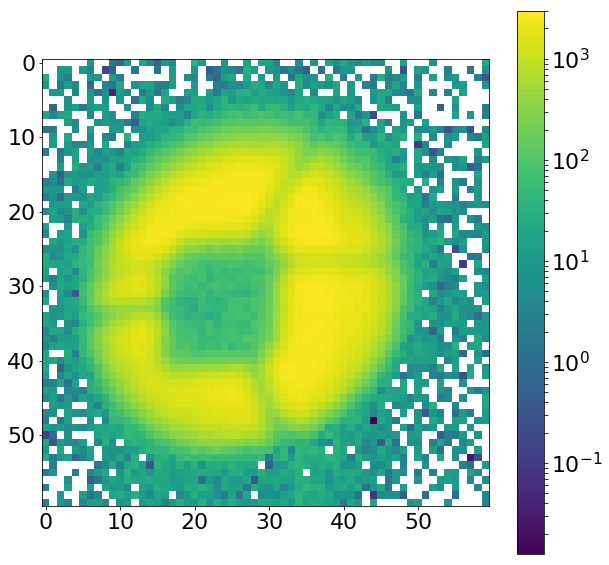

In [1756]:
plt.figure(figsize=(10,10))
plt.imshow(sci_image,norm=LogNorm())
plt.colorbar()

In [1757]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()

(number of walkers, number of steps, number of parameters): (248, 75, 31)
minimal likelihood is: 14043.8407948
minimal chi2 reduced is: 7.79765064607


In [1758]:
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)

          z4        z5        z6        z7        z8        z9       z10  \
0 -29.089274  1.470517  0.964793  0.434297  0.150196  0.207108  0.097994   

       z11  
0  0.41542  
    hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy  \
0  0.759114   0.108127  0.162171 -0.090235  0.069385     0.168654   

   radiometricEffect  radiometricExponent    x_ilum    y_ilum  
0           0.663937             0.045217  0.399963 -0.307039  
    x_fiber   y_fiber       0.9  frd_sigma  det_vert  slitHolder_frac_dx  \
0  0.049593  0.130428  0.958879   0.136446  1.020595            0.350618   

   grating_lines  scattering_radius  scattering_slope  scattering_amplitude  \
0   31976.762366          26.461928          2.551907              0.399919   

   pixel_effect  fiber_r      flux  
0       0.74363  1.80009  0.988362  


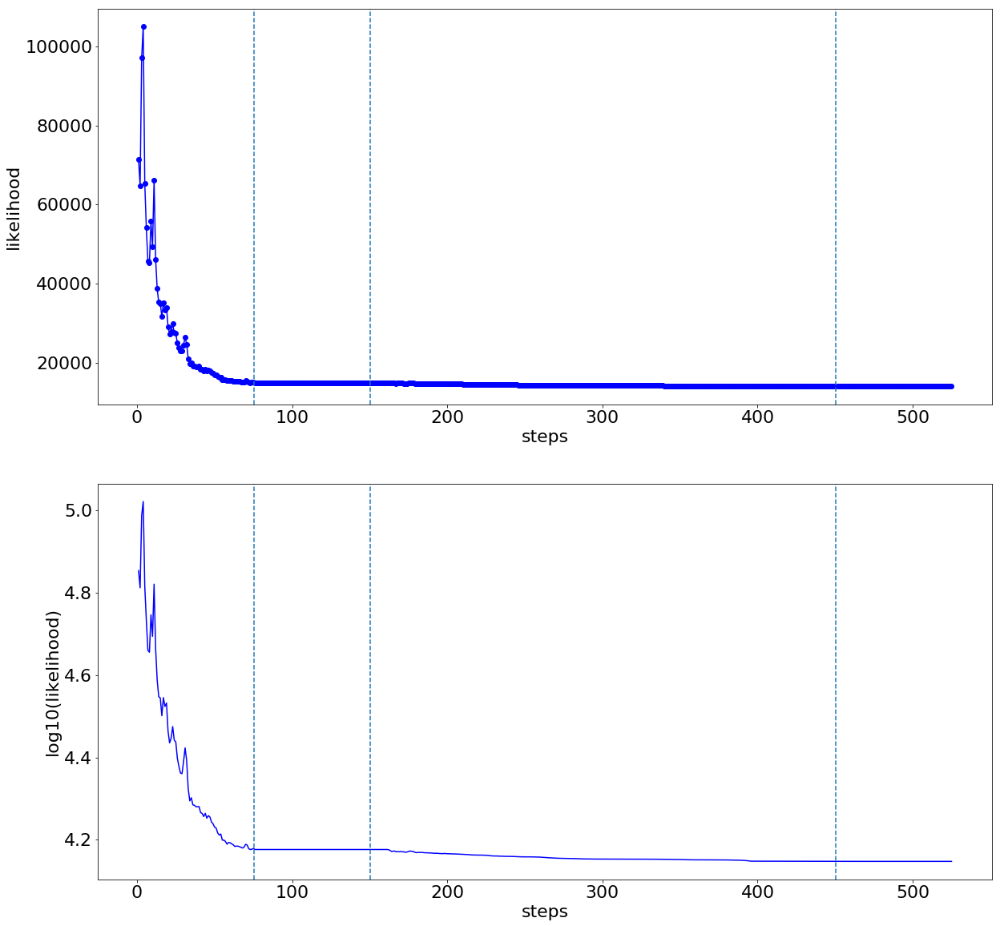

In [1759]:
size=75

plt.figure(figsize=(20,20))
plt.subplot(211)
plt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')
plt.ylabel('likelihood')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(size*2+0.5,ls='--')
plt.axvline(size*6+0.5,ls='--')
plt.subplot(212)
plt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-')
plt.ylabel('log10(likelihood)')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(2*size+0.5,ls='--')
plt.axvline(6*size+0.5,ls='--')

In [1760]:
if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1)   
    
model(minchain)
#model(allparameters_proposal)

-36714.675309499813

In [1761]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')
aperilluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'aperilluminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')

wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy')          

optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')

optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled

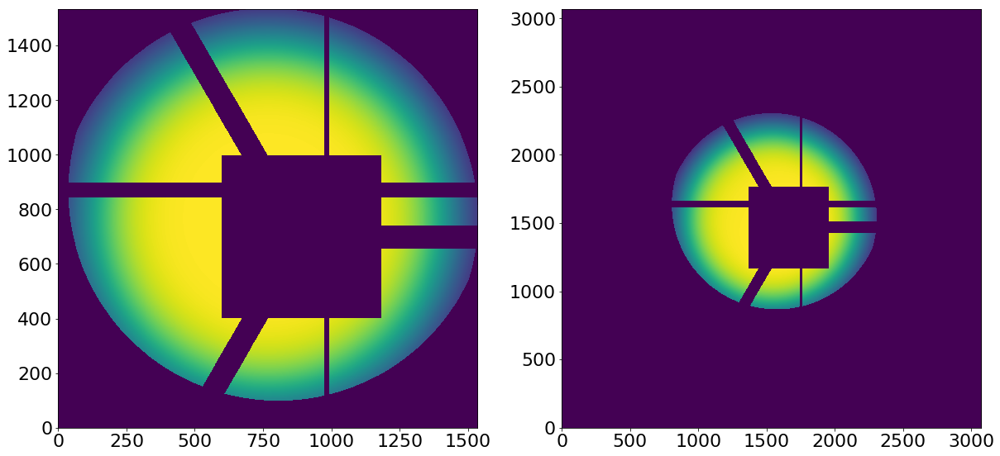

In [1762]:
plt.figure(figsize=(20,12))
plt.subplot(121)
plt.imshow(pupililluminated,origin='lower')
plt.subplot(122)
plt.imshow(ilum_radiometric,origin='lower')

chi**2 reduced is: 20.3925587587
Abs of residual divided by total flux is: 0.167323714955
Abs of residual divided by largest value of a flux in the image is: 0.355454698067


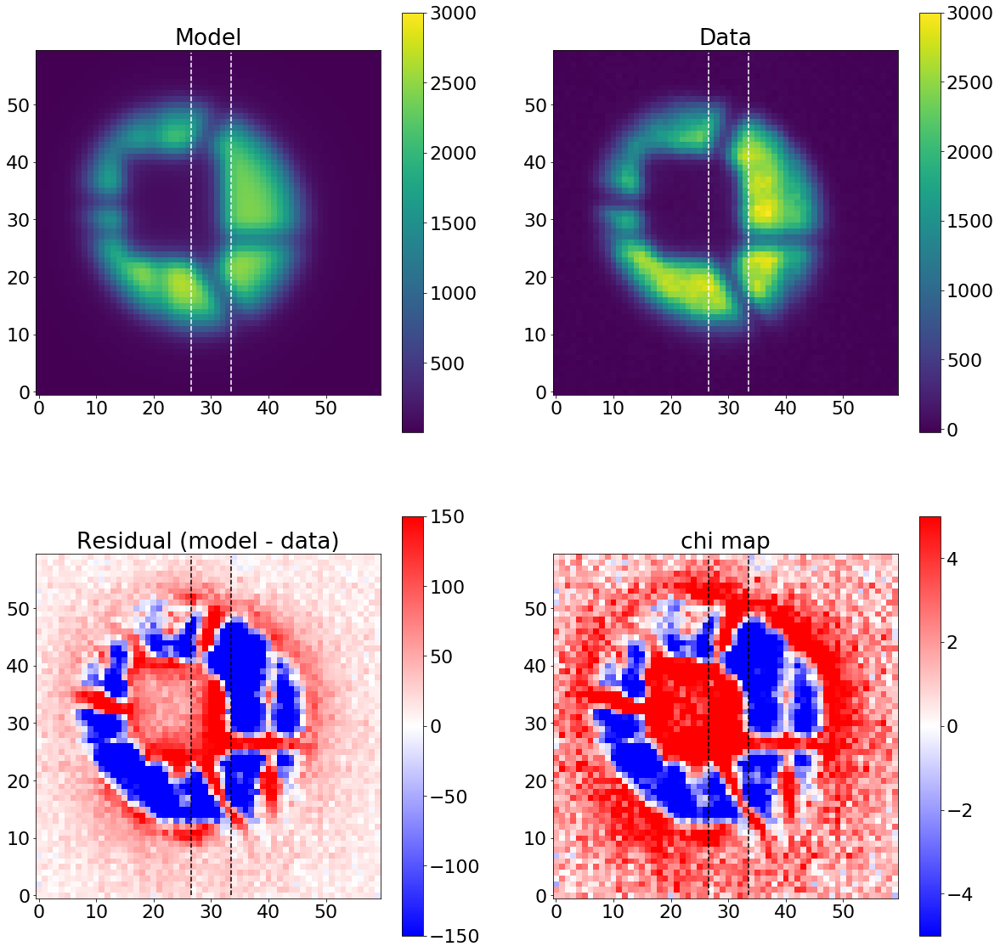

In [1764]:
single_analysis.create_basic_comparison_plot()

20.3925587587
chi**2 reduced is: 20.3925587587
Abs of residual divided by total flux is: 0.167323714955
Abs of residual divided by largest value of a flux in the image is: 0.355454698067


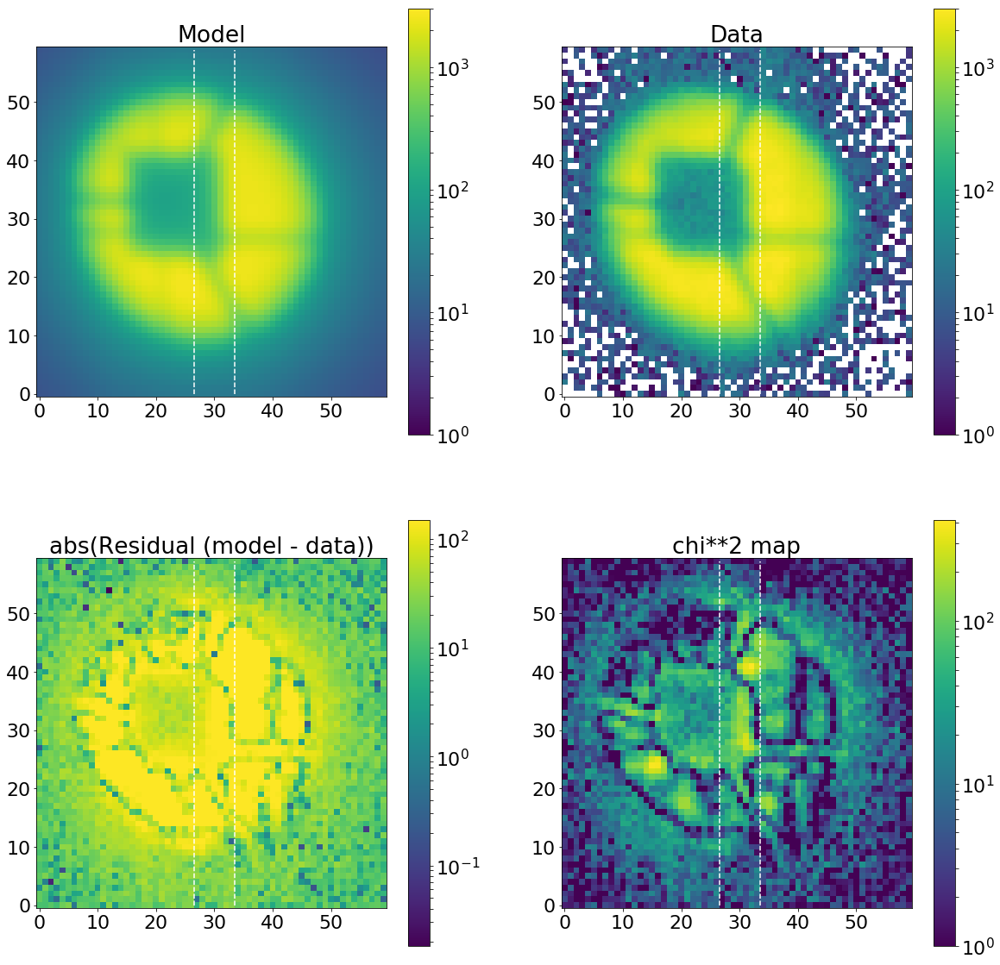

In [1765]:
single_analysis.create_basic_comparison_plot_log()

19.3485204357


0.093063794832682206

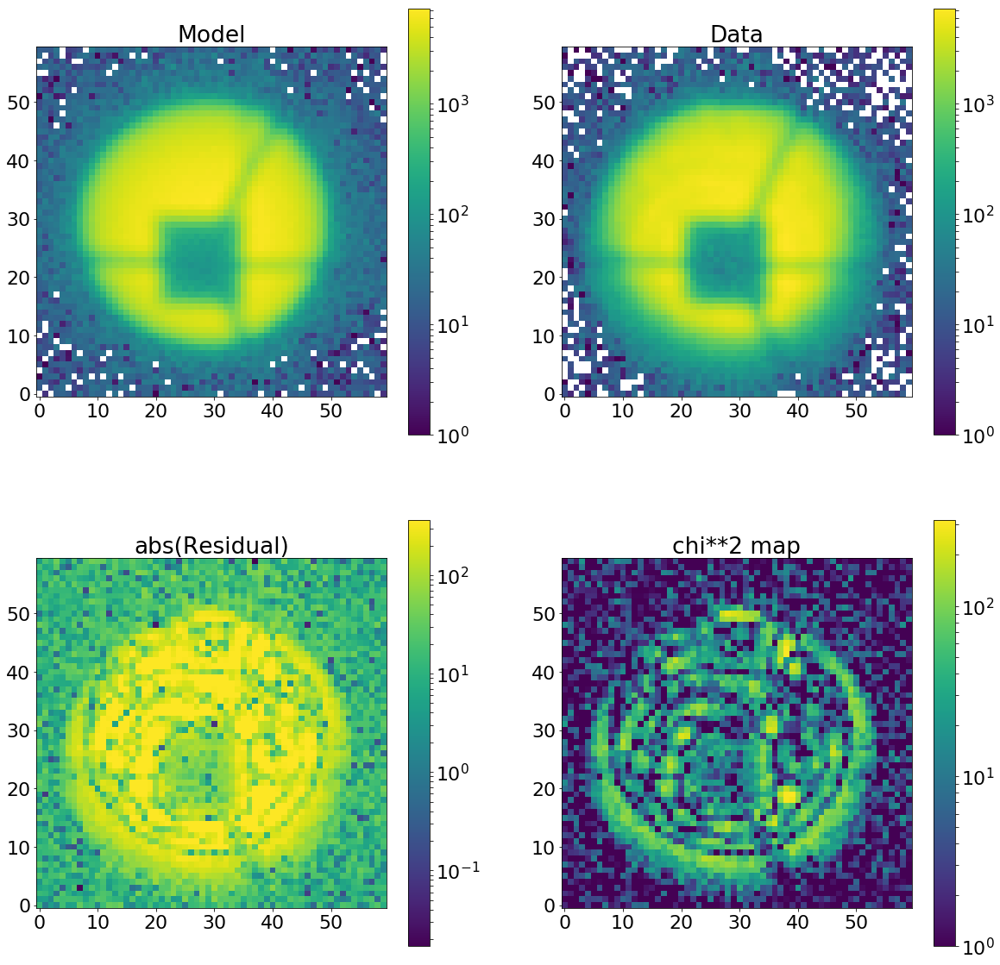

In [1328]:
artifical_noise=single_analysis.create_artificial_noise()
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(res_iapetus+artifical_noise,origin='lower',vmin=1,vmax=np.max(np.abs(sci_image)),norm=LogNorm())
plt.colorbar()
plt.title('Model')
plt.grid(False)
plt.subplot(222)
plt.imshow(sci_image,origin='lower',vmin=1,vmax=np.max(np.abs(sci_image)),norm=LogNorm())
plt.colorbar()
plt.title('Data')
plt.grid(False)
plt.subplot(223)
plt.imshow(np.abs(res_iapetus+artifical_noise-sci_image),origin='lower',vmax=np.max(np.abs(sci_image))/20,norm=LogNorm())
plt.colorbar()
plt.title('abs(Residual)')
plt.grid(False)
plt.subplot(224)
plt.imshow((res_iapetus+artifical_noise-sci_image)**2/((1)*var_image),origin='lower',vmin=1,norm=LogNorm())
plt.colorbar()
plt.title('chi**2 map')
print(np.sum((res_iapetus-sci_image)**2/((var_image.shape[0]*var_image.shape[1])*var_image)))
np.sum(np.abs((res_iapetus-sci_image)))/np.sum((res_iapetus))

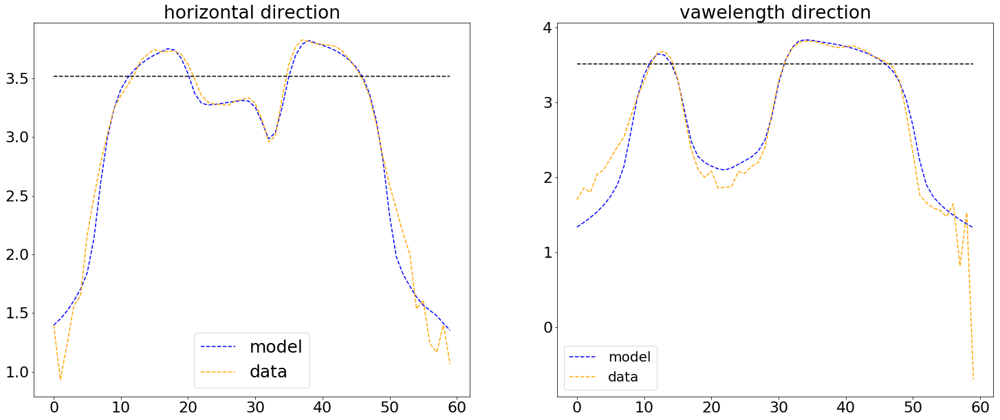

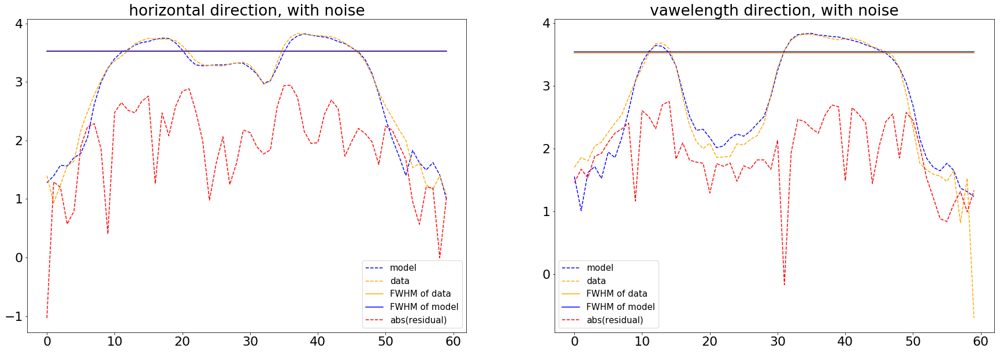

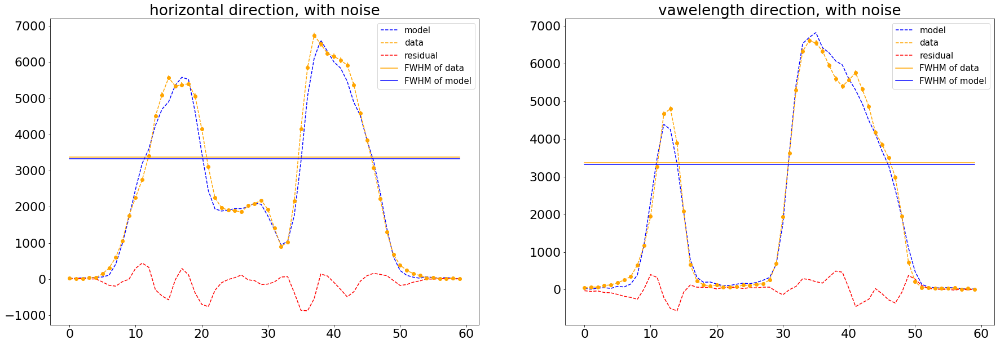

In [1329]:
single_analysis.create_cut_plots()

## Preparation for focused data (total solution)

### creation of results_of_fit_many

In [13]:
def solution_at_0_and_plots(date,single_number,results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper):
    
    results_of_fit_single=results_of_fit_single[np.abs(results_of_fit_single['z4'])>0]
    err_results_of_fit_single=err_results_of_fit_single[np.abs(err_results_of_fit_single['z4'])>0]
    err_results_of_fit_single_lower=err_results_of_fit_single_lower[np.abs(err_results_of_fit_single_lower['z4'])>0]
    err_results_of_fit_single_upper=err_results_of_fit_single_upper[np.abs(err_results_of_fit_single_upper['z4'])>0]    
    
    if len(results_of_fit_single)<=3:
        solution_at_0=np.full(31,0)
        return solution_at_0
    else:
        IMAGES_FOLDER='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/'

        solution_at_0=[]

        for q in columns_analysis:
            z4_arr=np.array(results_of_fit_single[q])
            z4_arr_err=np.array(err_results_of_fit_single[q])
            z4_arr_err_up=np.array(err_results_of_fit_single_upper[q])
            z4_arr_err_low=np.array(err_results_of_fit_single_lower[q])
            index_arr=results_of_fit_single[q].index.values.astype(float)
            #print(q)
            #print(index_arr)
            #print(z4_arr_err)
            
            z4_arr_no0=z4_arr[np.abs(index_arr)>0.5]
            z4_arr_no0_err=z4_arr_err[np.abs(index_arr)>0.5]
            z4_arr_no0_err_up=z4_arr_err_up[np.abs(index_arr)>0.5]
            z4_arr_no0_err_low=z4_arr_err_low[np.abs(index_arr)>0.5]
            index_arr_no0=index_arr[np.abs(index_arr)>0.5]

            z4_arr_only0=z4_arr[np.abs(index_arr)<=0.5]
            z4_arr_only0_err=z4_arr_err[np.abs(index_arr)<=0.5]
            z4_arr_only0_err_up=z4_arr_err_up[np.abs(index_arr)<=0.5] 
            z4_arr_only0_err_low=z4_arr_err_low[np.abs(index_arr)<=0.5]
            index_arr_only0=index_arr[np.abs(index_arr)<=0.5]

            fit_res=[]
            if q in columns[:8]:
                # these variables are fit via linear fit, without values at focus
                popt=optimize.leastsq(curve_fit_custom_lin,x0=[1,1],args=(index_arr_no0, z4_arr_no0, z4_arr_no0_err_low,z4_arr_no0_err_up))[0]
                for i in np.linspace(-4.5,4.5,19):
                    fit_res.append(lin_fit_1D(i,popt[0],popt[1]))
                solution_at_0.append(fit_res[9])

            if q in np.concatenate((np.array(columns[8:21]),np.array(['frd_sigma','det_vert','slitHolder_frac_dx',])),axis=0):
                # these variables are set at mean value (constant fit), without values at focus
                popt=optimize.leastsq(curve_fit_custom_con,x0=[1],args=(index_arr_no0, z4_arr_no0, z4_arr_no0_err_low,z4_arr_no0_err_up))[0]
                fit_res=lin_fit_1DConstant(np.linspace(-4.5,4.5,19),popt[0])
                solution_at_0.append(fit_res[9])

            if q in np.array(['grating_lines','scattering_radius','pixel_effect', 'scattering_slope', 'scattering_amplitude','fiber_r','flux','chi2','chi2max']):
                # these variables are set at value as measured at 0 - (perhaps is should be close to 0)
                if z4_arr_only0.size==1:
                    for i in np.linspace(-4.5,4.5,19):
                        fit_res.append(z4_arr_only0) 
                    solution_at_0.append(fit_res[9])
                else:
                    # these variables are set at mean value (constant fit), without values at focus
                    popt=optimize.leastsq(curve_fit_custom_con,x0=[1],args=(index_arr_only0, z4_arr_only0, z4_arr_only0_err_low,z4_arr_only0_err_up))[0]
                    fit_res=lin_fit_1DConstant(np.linspace(-4.5,4.5,19),popt[0])
                    solution_at_0.append(fit_res[9])


            #making plots here
            ######
            """
            plt.figure(figsize=(20,10))
            plt.errorbar(index_arr,z4_arr,yerr=[np.abs(z4_arr_err_low),z4_arr_err_up],color='blue',fmt='o',elinewidth=2,capsize=10,markeredgewidth=2,label='single fit results')
            plt.plot(np.linspace(-4.5,4.5,19),fit_res,color='orange',label='fit')
            if q in columns[:8]:
                plt.plot(np.linspace(-4.5,4.5,19),np.zeros((19,1)),':',color='black')
            plt.plot([0], [fit_res[9]], marker='o', markersize=10, color="red",label='prediction for focus')
            plt.title(q,size=40)
            plt.legend(fontsize=25)
            plt.xlabel('defocus lab [mm]',size=30)
            plt.ylabel('defocus model',size=30)
            #print(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/')
            if not os.path.exists(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/'):
                os.makedirs(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/')
            plt.savefig(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/'+str(q))

            if not os.path.exists(IMAGES_FOLDER+'Defocus/'+str(q)+'/'):
                os.makedirs(IMAGES_FOLDER+'Defocus/'+str(q)+'/')
            plt.savefig(IMAGES_FOLDER+'Defocus/'+str(q)+'/'+str(single_number))

            plt.close()   
            """
            ######

        solution_at_0=np.array(solution_at_0)[:len(solution_at_0)-2]
        return solution_at_0

In [14]:
single_number_for_single_pos_full=np.load("/Users/nevencaplar/Documents/PFS/2017-12-15/single_number_for_single_pos_full.npy") 

columns=['z4','z5','z6','z7','z8','z9','z10','z11',
              'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
              'radiometricEffect','radiometricExponent',
              'x_ilum','y_ilum',
              'x_fiber','y_fiber','effective_ilum_radius','frd_sigma','det_vert','slitHolder_frac_dx',
              'grating_lines','scattering_radius','scattering_slope','scattering_amplitude',
              'pixel_effect','fiber_r','flux']  

columns_analysis=columns+['chi2','chi2max']

results_of_fit_many_single_defocus=pd.DataFrame(np.zeros((len(single_number_for_single_pos_full[:,0]),len(columns_analysis))).reshape(-1,len(columns_analysis)),index=single_number_for_single_pos_full[:,0],columns=columns_analysis)
err_results_of_fit_many_single_defocus=pd.DataFrame(np.zeros((len(single_number_for_single_pos_full[:,0]),len(columns_analysis))).reshape(-1,len(columns_analysis)),index=single_number_for_single_pos_full[:,0],columns=columns_analysis)

results_of_fit_many_single_defocus_pd=pd.DataFrame(results_of_fit_many_single_defocus)
err_results_of_fit_many_single_defocus_pd=pd.DataFrame(err_results_of_fit_many_single_defocus)

results_of_fit_many = {'m4': results_of_fit_many_single_defocus_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_pd.copy(),
                       '0d' : results_of_fit_many_single_defocus_pd.copy(),
                       '0' :  results_of_fit_many_single_defocus_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']

for single_number in range(100):
        
    results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper=create_results_of_fit_single('Oct12',single_number)
    solution_at_0=solution_at_0_and_plots('Oct12',single_number,results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper)
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:
        #print(single_number,i)
        if len(results_of_fit_single)<=4:
            pass
        else:
            if i<18:
                results_of_fit_many[label[i]].at[single_number]=results_of_fit_single.iloc[i]    
            else:
                results_of_fit_many[label[18]].at[single_number]=np.concatenate((solution_at_0,np.array([1,1]))) 
            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:        
    results_of_fit_many[label[i]]=results_of_fit_many[label[i]][np.abs(results_of_fit_many[label[i]]['z4'])>0]

0 obs (Emcee3): 8552 is found!
0 obs (Emcee3): 8555 is found!
0 obs (Emcee3): 8558 is found!
0 obs (Emcee3): 8567 is found!
0 obs (Emcee3): 8573 is found!
0 obs (Emcee3): 8600 is found!
0 obs (Emcee3): 8603 is found!
0 obs (Emcee3): 8606 is found!
0 obs (Emcee3): 8612 is found!
0 obs (Emcee3): 8621 is found!
0 obs (Emcee3): 8624 is found!
0 obs (Emcee3): 8627 is found!
1 obs (Emcee3): 8552 is found!
1 obs (Emcee3): 8555 is found!
1 obs (Emcee3): 8558 is found!
1 obs (Emcee3): 8567 is found!
1 obs (Emcee3): 8573 is found!
1 obs (Emcee3): 8600 is found!
1 obs (Emcee3): 8603 is found!
1 obs (Emcee3): 8606 is found!
1 obs (Emcee3): 8612 is found!
1 obs (Emcee3): 8621 is found!
1 obs (Emcee3): 8624 is found!
1 obs (Emcee3): 8627 is found!
2 obs (Emcee3): 8552 is found!
2 obs (Emcee3): 8555 is found!
2 obs (Emcee3): 8558 is found!
2 obs (Emcee3): 8567 is found!
2 obs (Emcee3): 8573 is found!
2 obs (Emcee3): 8600 is found!
2 obs (Emcee3): 8603 is found!
2 obs (Emcee3): 8606 is found!
2 obs (E

37 obs (Emcee3): 8603 is found!
37 obs (Emcee3): 8606 is found!
37 obs (Emcee3): 8612 is found!
37 obs (Emcee3): 8621 is found!
37 obs (Emcee3): 8624 is found!
37 obs (Emcee3): 8627 is found!
42 obs (Emcee3): 8552 is found!
42 obs (Emcee3): 8555 is found!
42 obs (Emcee3): 8558 is found!
42 obs (Emcee3): 8567 is found!
42 obs (Emcee3): 8573 is found!
42 obs (Emcee3): 8600 is found!
42 obs (Emcee3): 8603 is found!
42 obs (Emcee3): 8606 is found!
42 obs (Emcee3): 8612 is found!
42 obs (Emcee3): 8621 is found!
42 obs (Emcee3): 8624 is found!
42 obs (Emcee3): 8627 is found!
43 obs (Emcee3): 8552 is found!
43 obs (Emcee3): 8555 is found!
43 obs (Emcee3): 8558 is found!
43 obs (Emcee3): 8567 is found!
43 obs (Emcee3): 8573 is found!
43 obs (Emcee3): 8600 is found!
43 obs (Emcee3): 8603 is found!
43 obs (Emcee3): 8606 is found!
43 obs (Emcee3): 8612 is found!
43 obs (Emcee3): 8621 is found!
43 obs (Emcee3): 8624 is found!
43 obs (Emcee3): 8627 is found!
44 obs (Emcee3): 8552 is found!
44 obs (

84 obs (Emcee3): 8627 is found!
85 obs (Emcee3): 8552 is found!
85 obs (Emcee3): 8555 is found!
85 obs (Emcee3): 8558 is found!
85 obs (Emcee3): 8567 is found!
85 obs (Emcee3): 8573 is found!
85 obs (Emcee3): 8600 is found!
85 obs (Emcee3): 8603 is found!
85 obs (Emcee3): 8606 is found!
85 obs (Emcee3): 8612 is found!
85 obs (Emcee3): 8621 is found!
85 obs (Emcee3): 8624 is found!
85 obs (Emcee3): 8627 is found!
86 obs (Emcee3): 8552 is found!
86 obs (Emcee3): 8555 is found!
86 obs (Emcee3): 8558 is found!
86 obs (Emcee3): 8567 is found!
86 obs (Emcee3): 8573 is found!
86 obs (Emcee3): 8600 is found!
86 obs (Emcee3): 8603 is found!
86 obs (Emcee3): 8606 is found!
86 obs (Emcee3): 8612 is found!
86 obs (Emcee3): 8621 is found!
86 obs (Emcee3): 8624 is found!
86 obs (Emcee3): 8627 is found!
87 obs (Emcee3): 8552 is found!
87 obs (Emcee3): 8555 is found!
87 obs (Emcee3): 8558 is found!
87 obs (Emcee3): 8567 is found!
87 obs (Emcee3): 8573 is found!
87 obs (Emcee3): 8600 is found!
87 obs (

In [15]:
import pickle
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Oct122018/' + 'results_of_fit_many.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many,f, protocol=pickle.HIGHEST_PROTOCOL)

In [17]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Oct12'
descriptions=results_of_fit_many[label[0]].columns
for j in tqdm([0,1,2,7,9,10,16,17,18]):
    for i in range(0,len(descriptions)):

        x=single_number_for_single_pos_full[np.array(results_of_fit_many[label[j]][descriptions[i]].index).astype(int)][:,[3]].ravel()
        y=4294-single_number_for_single_pos_full[np.array(results_of_fit_many[label[j]][descriptions[i]].index).astype(int)][:,[4]].ravel()
        values=np.array(results_of_fit_many[label[j]][descriptions[i]])
        colors=values
        area = np.pi * (15 * 1)**2  # 0 to 15 point radii

        # z5-z11
        if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                abs_max_colors=max(np.abs(colors))
                max_colors=1
                min_colors=-1 

        if np.in1d([i],[0,10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+(min_dif+max_dif)/2
            min_colors=median_color-(min_dif+max_dif)/2
            

            
        #'z4,dx,dy,chi'
        if np.in1d([i],[31,32])[0] == True:   
            max_colors=max(colors)
            min_colors=min(colors)

        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4416)
        plt.xlim(0,4294)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title(str(label[j])+" "+str(descriptions[i]))


        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
        plt.clf()

  0%|                                                                   | 0/9 [00:00<?, ?it/s]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/m4/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/z4/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/z5/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/z6/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/z7/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/z8/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/z9/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/z10/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/z11/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/hscFrac/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/strutFrac/
Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/dxFocal/
Images are in folder: /Users/nevencaplar/Docu

 11%|██████▌                                                    | 1/9 [00:15<02:04, 15.52s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/m35/


 22%|█████████████                                              | 2/9 [00:30<01:45, 15.07s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/m3/


 33%|███████████████████▋                                       | 3/9 [00:44<01:28, 14.72s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/m05/


 44%|██████████████████████████▏                                | 4/9 [00:58<01:12, 14.51s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/0/


 56%|████████████████████████████████▊                          | 5/9 [01:11<00:57, 14.36s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/p05/


 67%|███████████████████████████████████████▎                   | 6/9 [01:25<00:42, 14.25s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/p35/


 78%|█████████████████████████████████████████████▉             | 7/9 [01:39<00:28, 14.23s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/p4/


 89%|████████████████████████████████████████████████████▍      | 8/9 [01:53<00:14, 14.21s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct12/Plane/0p/


100%|███████████████████████████████████████████████████████████| 9/9 [02:07<00:00, 14.16s/it]


### 1D plots

In [18]:
res_y=[]
for i in [5,25,35,45,55,75,85,95]:
    res_y.append(4294-single_number_for_single_pos_full[i][4])
res_y=np.array(res_y)

In [19]:
res_x=[]
for i in [40,41,42,43,44,45,46,47,48,49]:
    res_x.append(single_number_for_single_pos_full[i][3])
res_x=np.array(res_x)

In [117]:
res_x[res_x>int(4096/2)]=res_x[res_x>int(4096/2)]+69

In [119]:
loc_w=[[2,3,4,5,6,7],[22,23,24,25,26,27],[32,33,34,35,36,37],[42,43,44,45,46,47],[52,53,54,55,56,57],[72,73,74,75,76,77],[82,83,84,85,86,87],[92,93,94,95,96,97]]
label_short=['m4','m35','m3','m05','0','p05','p3','p35','p4']
 
description='hscFrac'

for description in columns:

    res0=[]
    for w in [0,1,2,3,4,5,6,7]:
        res0.append(np.median(results_of_fit_many[label_short[0]].loc[loc_w[w]][description].dropna(how='all')))

    res1=[]
    for w in [0,1,2,3,4,5,6,7]:
        res1.append(np.median(results_of_fit_many[label_short[1]].loc[loc_w[w]][description].dropna(how='all')))

    res2=[]
    for w in [0,1,2,3,4,5,6,7]:
        res2.append(np.median(results_of_fit_many[label_short[2]].loc[loc_w[w]][description].dropna(how='all')))

    res3=[]
    for w in [0,1,2,3,4,5,6,7]:
        res3.append(np.median(results_of_fit_many[label_short[3]].loc[loc_w[w]][description].dropna(how='all')))

    res4=[]
    for w in [0,1,2,3,4,5,6,7]:
        res4.append(np.median(results_of_fit_many[label_short[4]].loc[loc_w[w]][description].dropna(how='all')))

    res5=[]
    for w in [0,1,2,3,4,5,6,7]:
        res5.append(np.median(results_of_fit_many[label_short[5]].loc[loc_w[w]][description].dropna(how='all')))

    res6=[]
    for w in [0,1,2,3,4,5,6,7]:
        res6.append(np.median(results_of_fit_many[label_short[6]].loc[loc_w[w]][description].dropna(how='all')))

    res7=[]
    for w in [0,1,2,3,4,5,6,7]:
        res7.append(np.median(results_of_fit_many[label_short[7]].loc[loc_w[w]][description].dropna(how='all')))

    res8=[]
    for w in [0,1,2,3,4,5,6,7]:
        res8.append(np.median(results_of_fit_many[label_short[8]].loc[loc_w[w]][description].dropna(how='all')))

    res_defocused=np.array([res0,res1,res2,res6,res7,res8])
    #res_y_defocused=res_y[0,1,2,6,7,8]
    res_focused=np.array([res3,res4,res5])
        
    res_defocused_median=[]
    for i in range(res_defocused.shape[1]):
        x=res_defocused[:,i]
        x=x[~np.isnan(x)]
        res_defocused_median.append(np.median(x))
        
    popt, pcov = curve_fit(lin_fit_1DConstant, res_y, res_defocused_median)
        
    plt.figure(figsize=(30,12))
    plt.plot(res_y,res0,label='m4',color='red',lw=3,marker='o',markersize=15)
    plt.plot(res_y,res1,label='m35',color='orange',lw=3,marker='o',markersize=15)
    plt.plot(res_y,res2,label='m3',color='yellow',lw=3,marker='o',markersize=15)
    plt.plot(res_y,res3,label='m05',color='brown',lw=3,marker='o',markersize=15,ls='--')
    plt.plot(res_y,res4,label='0',color='black',lw=3,marker='o',markersize=15,ls='--')
    plt.plot(res_y,res5,label='p05',color='violet',lw=3,marker='o',markersize=15,ls='--')
    plt.plot(res_y,res6,label='p3',color='magenta',lw=3,marker='o',markersize=15)
    plt.plot(res_y,res7,label='p35',color='cyan',lw=3,marker='o',markersize=15)
    plt.plot(res_y,res8,label='p3',color='blue',lw=3,marker='o',markersize=15)
    plt.plot(res_y,np.ones(len(res_y))*popt,label='def median',color='black',lw=3,marker='o',markersize=15,ls=':')
    plt.title('y: '+str(description))

    plt.legend()  

    IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/1D/'

    if not os.path.exists(IMAGES_FOLDER2):
        os.makedirs(IMAGES_FOLDER2)
        print('Images are in folder: '+str(IMAGES_FOLDER2))

    plt.savefig(IMAGES_FOLDER2+'y'+str(description))
    plt.close()

In [120]:
loc_w=[[0,20,30,40,50,60,70,80,90],[1,21,31,41,51,61,71,81,91],[2,22,32,42,52,62,72,82,92],[3,23,33,43,53,63,73,83,93],[4,24,34,44,54,64,74,84,94],[5,25,35,45,55,65,75,85,95],
       [6,26,36,46,56,66,76,86,96],[7,27,37,47,57,67,87,97],[8,28,38,48,58,68,78,88,98],[9,29,39,49,59,69,79,89,99]]
label_short=['m4','m35','m3','m05','0','p05','p3','p35','p4']

for description in columns:

    res0=[]
    for w in [0,1,2,3,4,5,6,7,8,9]:
        res0.append(np.mean(results_of_fit_many[label_short[0]].loc[loc_w[w]][description].dropna(how='all')))

    res1=[]
    for w in [0,1,2,3,4,5,6,7,8,9]:
        res1.append(np.mean(results_of_fit_many[label_short[1]].loc[loc_w[w]][description].dropna(how='all')))

    res2=[]
    for w in [0,1,2,3,4,5,6,7,8,9]:
        res2.append(np.mean(results_of_fit_many[label_short[2]].loc[loc_w[w]][description].dropna(how='all')))

    res3=[]
    for w in [0,1,2,3,4,5,6,7,8,9]:
        res3.append(np.mean(results_of_fit_many[label_short[3]].loc[loc_w[w]][description].dropna(how='all')))

    res4=[]
    for w in [0,1,2,3,4,5,6,7,8,9]:
        res4.append(np.mean(results_of_fit_many[label_short[4]].loc[loc_w[w]][description].dropna(how='all')))

    res5=[]
    for w in [0,1,2,3,4,5,6,7,8,9]:
        res5.append(np.mean(results_of_fit_many[label_short[5]].loc[loc_w[w]][description].dropna(how='all')))

    res6=[]
    for w in [0,1,2,3,4,5,6,7,8,9]:
        res6.append(np.mean(results_of_fit_many[label_short[6]].loc[loc_w[w]][description].dropna(how='all')))

    res7=[]
    for w in [0,1,2,3,4,5,6,7,8,9]:
        res7.append(np.mean(results_of_fit_many[label_short[7]].loc[loc_w[w]][description].dropna(how='all')))

    res8=[]
    for w in [0,1,2,3,4,5,6,7,8,9]:
        res8.append(np.mean(results_of_fit_many[label_short[8]].loc[loc_w[w]][description].dropna(how='all')))

    plt.figure(figsize=(30,12))
    plt.plot(res_x,res0,label='m4',color='red',lw=3,marker='o',markersize=15)
    plt.plot(res_x,res1,label='m35',color='orange',lw=3,marker='o',markersize=15)
    plt.plot(res_x,res2,label='m3',color='yellow',lw=3,marker='o',markersize=15)
    plt.plot(res_x,res3,label='m05',color='brown',lw=3,marker='o',markersize=15,ls='--')
    plt.plot(res_x,res4,label='0',color='black',lw=3,marker='o',markersize=15,ls='--')
    plt.plot(res_x,res5,label='p05',color='violet',lw=3,marker='o',markersize=15,ls='--')
    plt.plot(res_x,res6,label='p3',color='magenta',lw=3,marker='o',markersize=15)
    plt.plot(res_x,res7,label='p35',color='cyan',lw=3,marker='o',markersize=15)
    plt.plot(res_x,res8,label='p3',color='blue',lw=3,marker='o',markersize=15)
    plt.title('x: '+str(description))

    plt.legend()
    
    

    IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/1D/'

    if not os.path.exists(IMAGES_FOLDER2):
        os.makedirs(IMAGES_FOLDER2)
        print('Images are in folder: '+str(IMAGES_FOLDER2))

    plt.savefig(IMAGES_FOLDER2+'x'+str(description))
    plt.close()
    

### Creation of prediction for next fit and verification

In [203]:
from scipy.optimize import curve_fit

def lin_fit_2D(x_y, a, b,c):
    x=x_y[:,0]
    y=x_y[:,1]
    return a * x + b*y+c

def lin_fit_3D(dz_dx_dy, a, b,c,d):
    z=dz_dx_dy[:,0]
    x=dz_dx_dy[:,1]
    y=dz_dx_dy[:,2]
    return a * z + b*x+c*y+d


def func(x,a1,a2,b1,b2,c1,d,a1b1,a1c1,b1c1):
    return a1*x[0]+a2*x[0]**2+b1*x[1]+b2*x[1]**2+c1*x[2]+d+a1b1*x[0]*x[1]+a1c1*x[0]*x[2]+b1c1*x[1]*x[2]

#def func(x, a1,a2,a3,a4,a5,b1,b2,b3,b4,b5,c):
#    return np.polynomial.chebyshev.chebval(x[0],[a1,a2,a3,a4,a5])+np.polynomial.chebyshev.chebval(x[1],[b1,b2,b3,b4,b5])+c

#popt1, pcov = curve_fit(func, np.transpose(res_convolving_array1[:,[0,1]]), 10/4*res_convolving_array1[:,2])



label_short=['m4','m35','m3','m15','m05','0d','0','p05','p15','p3','p35','p4']
label_defocus=['m4','m35','m3','m15','p15','p3','p35','p4']
label_focus=['m05','0d','0','p05']
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
mm=np.array([-4. , -3.5, -3. , -2.5, -2. , -1.5, -1. , -0.5, -0. , -0. ,  0.5,
        1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4.,0 ])

In [204]:
results_of_fit_many_interpolation = {'m4': results_of_fit_many_single_defocus_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_pd.copy(),
                       '0d' : results_of_fit_many_single_defocus_pd.copy(),
                       '0' :  results_of_fit_many_single_defocus_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_pd.copy()}

In [205]:
i=0
all_x=single_number_for_single_pos_full[results_of_fit_many_interpolation[label[i]].index.astype(int)][:,3]
all_y=single_number_for_single_pos_full[results_of_fit_many_interpolation[label[i]].index.astype(int)][:,4]

In [206]:
all_x[all_x>int(4096/2)]=all_x[all_x>int(4096/2)]+69

all_x_in_respect_to_center=all_x-int((4096+69)/2)
all_y_in_respect_to_center=all_y-int(4176/2)

In [207]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
              'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
              'radiometricEffect','radiometricExponent',
              'x_ilum','y_ilum',
              'x_fiber','y_fiber','effective_ilum_radius','frd_sigma','det_vert','slitHolder_frac_dx',
              'grating_lines','scattering_radius','scattering_slope','scattering_amplitude',
              'pixel_effect','fiber_r','flux']  

In [208]:
# parameters that vary slowly across the detector - describing wavefront and pupil (without illumination of the pupil)

single_parameter=[]
for j in ['z4','z5','z6','z7','z8','z9','z10','z11','hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy','det_vert','slitHolder_frac_dx']:
    for i in label_defocus:
        single_selection=results_of_fit_many[i][j]
        single_selection_x=all_x_in_respect_to_center[single_selection.index.astype(int)]
        single_selection_y=all_y_in_respect_to_center[single_selection.index.astype(int)]
        single_selection_z=np.full(len(single_selection),mm[label.index(i)])
        single_selection_values=single_selection.values
        single_selection_array=np.transpose(np.array([single_selection.index,single_selection_x,single_selection_y,single_selection_z,single_selection_values]))    
        if i==label_short[0]:
            single_parameter=single_selection_array
        else:
            single_parameter=np.vstack((single_parameter,single_selection_array))

    popt, pcov = curve_fit(func, xdata=np.transpose(single_parameter[:,[1,2,3]]), ydata=single_parameter[:,4],p0=[0,0,0,0,0,0,0,0,0])
    print(str(j)+' '+str(popt))
    print(str(j)+' '+str(func([2100,0,mm[label.index(i)]],*popt)))


    for i in label:
        z=mm[label.index(i)]
        results_of_fit_many_interpolation[i].at[:,j]=func([all_x_in_respect_to_center,all_y_in_respect_to_center,np.full(len(all_x),mm[label.index(i)])],*popt)

z4 [-0.000006    0.00000024 -0.00010225  0.00000015 -7.61995088 -1.00804073
  0.00000005 -0.00001317  0.00007708]
z4 -30.540089113
z5 [ 0.00002076  0.00000007 -0.00007841 -0.00000001  0.01257    -0.23661718
  0.00000026  0.00020785 -0.00001281]
z5 1.92235968481
z6 [ 0.00001076  0.00000013 -0.00005542 -0.00000024  0.19275922 -0.14074264
 -0.00000002  0.00000364 -0.00009011]
z6 1.2529477951
z7 [ 0.00011376 -0.00000003 -0.00010435 -0.00000004 -0.01820188  0.54607933
  0.00000007 -0.00000031 -0.00001557]
z7 0.561884212608
z8 [-0.00022381 -0.          0.00000242  0.00000003 -0.0347839  -0.05561376
  0.00000001  0.00003479 -0.00001217]
z8 -0.380226862915
z9 [ 0.0000348   0.00000002 -0.00004312 -0.00000002  0.00113774 -0.16370656
 -0.          0.0000023  -0.00000293]
z9 0.00815687060959
z10 [ 0.00002769 -0.          0.00001455 -0.00000001 -0.00498591 -0.2819536
 -0.00000003  0.00002632 -0.00000123]
z10 -0.0313669799928
z11 [-0.00001499  0.00000008 -0.00008186  0.00000008  0.03530277 -0.436711

In [209]:
# parameters that vary as a function of fiber, sensitive in defocus - describing illumination of the pupil)
# we just select median value across all defocused measurments?

inerpolation_mean_par_dx=[]
for j in ['frd_sigma','radiometricEffect','radiometricExponent','x_ilum','y_ilum','x_fiber','y_fiber','effective_ilum_radius']:
    dx=[]
    values=[]
    for i in label_defocus:
        if len(dx)==0:
            dx=single_number_for_single_pos_full[results_of_fit_many[i][j].index.astype(int)][:,3]
            dspot=single_number_for_single_pos_full[results_of_fit_many[i][j].index.astype(int)][:,1]
            values=results_of_fit_many[i][j]
        else:
            dx=np.hstack((dx,single_number_for_single_pos_full[results_of_fit_many[i][j].index.astype(int)][:,3]))
            dspot=np.hstack((dspot,single_number_for_single_pos_full[results_of_fit_many[i][j].index.astype(int)][:,1]))
            values=np.hstack((values,results_of_fit_many[i][j]))           
            
            
    fiber_r_res=[]
    for i in range(10):
        if len(values[dspot==i])>1:
            fiber_r_res.append(np.median(values[dspot==i]))
        else:
            fiber_r_res.append(1.8)


    dx=[]
    for i in label:
        dx=single_number_for_single_pos_full[results_of_fit_many_interpolation[i].index.astype(int)][:,3]
        dspot=single_number_for_single_pos_full[results_of_fit_many_interpolation[i].index.astype(int)][:,1]

        values=[]
        for l in range(100):
            values.append(fiber_r_res[int(single_number_for_single_pos_full[l][1])])

    for i in label:
        z=mm[label.index(i)]
        results_of_fit_many_interpolation[i].at[:,j]=values




In [223]:
# parameters that vary slowly across the pupil, sensitive in focus

single_parameter=[]
for j in ['scattering_radius','scattering_slope','scattering_amplitude','pixel_effect','flux']:
    for i in label_focus:
        single_selection=results_of_fit_many[i][j]
        single_selection_x=all_x_in_respect_to_center[single_selection.index.astype(int)]
        single_selection_y=all_y_in_respect_to_center[single_selection.index.astype(int)]
        single_selection_z=np.full(len(single_selection),mm[label.index(i)])
        single_selection_values=single_selection.values
        single_selection_array=np.transpose(np.array([single_selection.index,single_selection_x,single_selection_y,single_selection_z,single_selection_values]))    
        if i==label_focus[0]:
            single_parameter=single_selection_array
        else:
            single_parameter=np.vstack((single_parameter,single_selection_array))

    popt, pcov = curve_fit(func, np.transpose(single_parameter[:,[1,2,3]]), single_parameter[:,4])
        #print(popt)


    for i in label:
        z=mm[label.index(i)]
        results_of_fit_many_interpolation[i].at[:,j]=func([all_x_in_respect_to_center,all_y_in_respect_to_center,np.full(len(all_x),mm[label.index(i)])],*popt)

/Users/nevencaplar/Documents/PFS/lsst_stack3/python/miniconda3-4.3.21/lib/python3.6/site-packages/scipy/optimize/minpack.py:779: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


In [224]:
# factors depending on dy as a non-smooth function
# fits grating lines as a median value of grating value for a given wavelength for 2 value in focus
inerpolation_mean_par_dy=[]
for j in ['grating_lines']:
    dy=[]
    values=[]
    for i in ['0','0d']:
        if len(dy)==0:
            dy=single_number_for_single_pos_full[results_of_fit_many[i][j].index.astype(int)][:,4]
            dspot=single_number_for_single_pos_full[results_of_fit_many[i][j].index.astype(int)][:,2]
            values=results_of_fit_many[i][j]
        else:
            dy=np.hstack((dy,single_number_for_single_pos_full[results_of_fit_many[i][j].index.astype(int)][:,4]))
            dspot=np.hstack((dspot,single_number_for_single_pos_full[results_of_fit_many[i][j].index.astype(int)][:,2]))
            values=np.hstack((values,results_of_fit_many[i][j]))           
            
            
grating_lines_res=[]
for i in range(10):
    if len(values[dspot==i])>1:
        grating_lines_res.append(np.median(values[dspot==i]))
    else:
        grating_lines_res.append(100000)
                                           
dy=[]
for i in label:
    dy=single_number_for_single_pos_full[results_of_fit_many[i].index.astype(int)][:,4]
    dspot=single_number_for_single_pos_full[results_of_fit_many[i].index.astype(int)][:,2]

    values=[]
    for l in range(100):
        values.append(grating_lines_res[int(single_number_for_single_pos_full[l][2])])
        
for i in label:
    z=mm[label.index(i)]
    results_of_fit_many_interpolation[i].at[:,j]=values


In [225]:
# parameters that vary as a function of fiber, sensitive in defocus - describing illumination of the pupil)
# we just select median value across all focused measurments?
inerpolation_mean_par_dx=[]
for j in ['fiber_r']:
    dx=[]
    values=[]
    for i in label_focus:
        if len(dx)==0:
            dx=single_number_for_single_pos_full[results_of_fit_many[i][j].index.astype(int)][:,3]
            dspot=single_number_for_single_pos_full[results_of_fit_many[i][j].index.astype(int)][:,1]
            values=results_of_fit_many[i][j]
        else:
            dx=np.hstack((dx,single_number_for_single_pos_full[results_of_fit_many[i][j].index.astype(int)][:,3]))
            dspot=np.hstack((dspot,single_number_for_single_pos_full[results_of_fit_many[i][j].index.astype(int)][:,1]))
            values=np.hstack((values,results_of_fit_many[i][j]))           
            
            
    fiber_r_res=[]
    for i in range(10):
        if len(values[dspot==i])>1:
            fiber_r_res.append(np.median(values[dspot==i]))
        else:
            fiber_r_res.append(1.8)


    dx=[]
    for i in label:
        dx=single_number_for_single_pos_full[results_of_fit_many_interpolation[i].index.astype(int)][:,3]
        dspot=single_number_for_single_pos_full[results_of_fit_many_interpolation[i].index.astype(int)][:,1]

        values=[]
        for l in range(100):
            values.append(fiber_r_res[int(single_number_for_single_pos_full[l][1])])

    for i in label:
        z=mm[label.index(i)]
        results_of_fit_many_interpolation[i].at[:,j]=values

In [226]:
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Oct122018/' + 'results_of_fit_many_interpolation.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_interpolation,f, protocol=pickle.HIGHEST_PROTOCOL)

#### verification 

In [227]:
from shutil import copy

In [234]:
columns[15]

'radiometricExponent'

In [235]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10

descriptions=results_of_fit_many[label[0]].columns
for j in tqdm([0,1,2,5,7,8,9,10,12,16,17]):
    for i in range(0,len(descriptions)):

        x=single_number_for_single_pos_full[np.array(results_of_fit_many_interpolation[label[j]][descriptions[i]].index).astype(int)][:,[3]].ravel()
        y=4294-single_number_for_single_pos_full[np.array(results_of_fit_many_interpolation[label[j]][descriptions[i]].index).astype(int)][:,[4]].ravel()
        values=np.array(results_of_fit_many_interpolation[label[j]][descriptions[i]])
        colors=values
        area = np.pi * (15 * 1)**2  # 0 to 15 point radii

        # z5-z11
        if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                abs_max_colors=max(np.abs(colors))
                max_colors=1
                min_colors=-1 

        if np.in1d([i],[0,10,11,8,9,12,13,14,15,16,17,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+min_dif
            min_colors=median_color-min_dif
            
        if np.in1d([i],[18,19])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+max_dif
            min_colors=median_color-max_dif            

            
        #'z4,dx,dy,chi'
        if np.in1d([i],[31,32])[0] == True:   
            max_colors=max(colors)
            min_colors=min(colors)

        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4416)
        plt.xlim(0,4294)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title('Interpolation: '+str(label[j])+" "+str(descriptions[i]))


        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneInterpolation/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneInterpolation/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        #copy(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]), IMAGES_FOLDER2)
        
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
        plt.clf()

100%|█████████████████████████████████████████████████████████| 11/11 [02:52<00:00, 15.67s/it]


In [236]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10

descriptions=results_of_fit_many[label[0]].columns
for j in tqdm([0,1,2,7,9,10,16,17,18]):
    for i in range(0,len(descriptions)):

        x=single_number_for_single_pos_full[np.array(results_of_fit_many[label[j]][descriptions[i]].index).astype(int)][:,[3]].ravel()
        y=4294-single_number_for_single_pos_full[np.array(results_of_fit_many[label[j]][descriptions[i]].index).astype(int)][:,[4]].ravel()
        values=np.array(results_of_fit_many[label[j]][descriptions[i]])
        values_residuals=np.array(results_of_fit_many_interpolation[label[j]][descriptions[i]])[np.array(results_of_fit_many[label[j]][descriptions[i]].index).astype(int)]
        
        colors=values-values_residuals
        area = np.pi * (15 * 1)**2  # 0 to 15 point radii

        # z5-z11
        if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                abs_max_colors=max(np.abs(colors))
                max_colors=1
                min_colors=-1 

        if np.in1d([i],[0,10,11,8,9,12,13,14,15,16,17,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+(min_dif+max_dif)/2
            min_colors=median_color-(min_dif+max_dif)/2
            
        if np.in1d([i],[18,19])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+max_dif
            min_colors=median_color-max_dif   
            
        #'z4,dx,dy,chi'
        if np.in1d([i],[31,32])[0] == True:   
            max_colors=max(colors)
            min_colors=min(colors)

        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4416)
        plt.xlim(0,4294)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title("Residuals: "+str(label[j])+" "+str(descriptions[i]))


        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneResidual/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneResidual/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        copy(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i])+'.png', IMAGES_FOLDER2)
        
        
        #plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
        plt.clf()

100%|███████████████████████████████████████████████████████████| 9/9 [01:32<00:00, 10.30s/it]


## Analysis of the focused data

In [1420]:
%load_ext autoreload
%autoreload 2

import Zernike_Module
from Zernike_Module import LNP_PFS,LN_PFS_single,create_parInit,downsample_manual_function,Zernike_Analysis,PFSPupilFactory,custom_fftconvolve,stepK,maxK,sky_scale,sky_size,create_x,remove_pupil_parameters_from_all_parameters

#import Zernike_Module_lastOct15_beforeScatterChange
#from Zernike_Module_lastOct15_beforeScatterChange import LNP_PFS,LN_PFS_single,create_parInit,downsample_manual_function,Zernike_Analysis,PFSPupilFactory,custom_fftconvolve,stepK,maxK,sky_scale,sky_size,create_x,remove_pupil_parameters_from_all_parameters

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### kinda unit test

In [1421]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_radius','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  




sci_image_unit=np.ones((50,50))
var_image_unit=np.ones((50,50))

allparameters_proposal=np.array([20,0.09,0.02,-0.1,0.0,0.1,0.02,0.2,
                                 0.65,0.1,0.0,0.0,0.07,-0.2,
                                 0.7,1,-0.0,0.00,
                                 0.2,0.1,0.90,
                                 0.1,1,0.28,
                                 50000,20,2.5,0.27,
                                 0.47,1.85,1.0])

model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=1)   

res=model(allparameters_proposal)
print(res)
#assert res=-4808.04
#print('ok')

-4208.83232426


### Core Analysis (pandas dataframe creation)  (no defocus plots)


In [144]:
def create_results_of_fit_single(date,single_number):
    results_of_fit_single=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)
    err_results_of_fit_single=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)
    err_results_of_fit_single_lower=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)
    err_results_of_fit_single_upper=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)

    # arrange all results in one pandas 
    #date='Sep19'
    #date='Sep27'
    RESULT_FOLDER='/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/'+str(date)+'/'

    single_defocus_list=[8552,8555,8558,8561,8564,8567,8570,8573,8600,8603,8606,8609,8612,8615,8618,8621,8624,8627]

    #single_number=55
    image_index=single_number
    method='P'
    eps=6

    res_likelihood=[]

    for single_defocus in range(0,len(single_defocus_list)):
        try:
            obs=single_defocus_list[single_defocus]
            try:
                chain=np.load(RESULT_FOLDER+'chain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+'Emcee3.npy')
                likechain=np.load(RESULT_FOLDER+'likechain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+'Emcee3.npy')
                print(str(single_number)+' obs (Emcee3): '+str(obs)+' is found!')
            except:    
                chain=np.load(RESULT_FOLDER+'chain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+'Emcee2.npy')
                likechain=np.load(RESULT_FOLDER+'likechain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+'Emcee2.npy')
                print(str(single_number)+' obs (Emcee2): '+str(obs)+' is found!')

            if obs==8600:
                sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(image_index)+'Stacked_Cleaned_Dithered.npy')
                var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(image_index)+'Stacked_Dithered.npy')
            else:       
                sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(image_index)+'Stacked_Cleaned.npy')
                var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(image_index)+'Stacked.npy')

            likechain0=likechain

            chain0=chain
            minchain=chain0[np.abs(likechain0)==np.min(np.abs(likechain0))][0]
            chi2reduced=2*np.min(np.abs(likechain0))/(sci_image.shape[0])**2


            """
            minchain_err=[]
            for i in range(len(columns)):
                #minchain_err=np.append(minchain_err,np.std(chain0[:,:,i].flatten()))
                minchain_err=np.append(minchain_err,np.sqrt(chi2reduced)*np.std(chain0[:,:,i].flatten()))

            minchain_err=np.array(minchain_err)
            """
            minchain_err_old=create_minchain_err(chain0,likechain0,sci_image,var_image,old=1)
            minchain_err=create_minchain_err(chain0,likechain0,sci_image,var_image)
            results_of_fit_single.iloc[single_defocus]=np.concatenate((minchain,np.array([chi2reduced,np.mean(sci_image**2/var_image)])),axis=0)
            err_results_of_fit_single.iloc[single_defocus]=np.concatenate((minchain_err_old,np.array([1,1])),axis=0)
            err_results_of_fit_single_lower.iloc[single_defocus]=np.concatenate((minchain_err[:,0],np.array([1,1])),axis=0)
            err_results_of_fit_single_upper.iloc[single_defocus]=np.concatenate((minchain_err[:,1],np.array([1,1])),axis=0)
            
        
        except:
            ValueError
            
    #results_of_fit_single=results_of_fit_single[np.abs(results_of_fit_single['z4'])>0]
    #err_results_of_fit_single=err_results_of_fit_single[np.abs(err_results_of_fit_single['z4'])>0]
    #err_results_of_fit_single_lower=err_results_of_fit_single_lower[np.abs(err_results_of_fit_single_lower['z4'])>0]
    #err_results_of_fit_single_upper=err_results_of_fit_single_upper[np.abs(err_results_of_fit_single_upper['z4'])>0]              
    
    return results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper

In [145]:
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Oct122018/' + 'results_of_fit_many_interpolation.pkl', 'rb') as f:
    results_of_fit_many_interpolation=pickle.load(f)
    
single_number_for_single_pos_full\
=np.load("/Users/nevencaplar/Documents/PFS/2017-12-15/single_number_for_single_pos_full.npy") 

In [146]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
              'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
              'radiometricEffect','radiometricExponent',
              'x_ilum','y_ilum',
              'x_fiber','y_fiber','effective_radius_illumination','frd_sigma','det_vert','slitHolder_frac_dx',
              'grating_lines','scattering_radius','scattering_slope','scattering_amplitude',
              'pixel_effect','fiber_r','flux']      

columns_analysis=columns+['chi2','chi2max']

results_of_fit_many_single_defocus=pd.DataFrame(np.zeros((len(single_number_for_single_pos_full[:,0]),len(columns_analysis))).reshape(-1,len(columns_analysis)),index=single_number_for_single_pos_full[:,0],columns=columns_analysis)
err_results_of_fit_many_single_defocus=pd.DataFrame(np.zeros((len(single_number_for_single_pos_full[:,0]),len(columns_analysis))).reshape(-1,len(columns_analysis)),index=single_number_for_single_pos_full[:,0],columns=columns_analysis)

results_of_fit_many_single_defocus_pd=pd.DataFrame(results_of_fit_many_single_defocus)
err_results_of_fit_many_single_defocus_pd=pd.DataFrame(err_results_of_fit_many_single_defocus)

results_of_fit_many_focus = {'m4': results_of_fit_many_single_defocus_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_pd.copy(),
                       '0d' : results_of_fit_many_single_defocus_pd.copy(),
                       '0' :  results_of_fit_many_single_defocus_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_pd.copy()}


In [147]:
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']

for single_number in range(100):
        
    results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper=create_results_of_fit_single('Oct10',single_number)
    #solution_at_0=solution_at_0_and_plots('Sep27',single_number,results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper)
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        #print(single_number,i)
        if len(results_of_fit_single)<=4:
            pass
        else:
            if i<18:
                results_of_fit_many_focus[label[i]].at[single_number]=results_of_fit_single.iloc[i]    
            else:
                results_of_fit_many_focus[label[18]].at[single_number]=np.concatenate((solution_at_0,np.array([1,1]))) 
            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_focus[label[i]]=results_of_fit_many_focus[label[i]][np.abs(results_of_fit_many_focus[label[i]]['z4'])>0]

0 obs (Emcee3): 8573 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
0 obs (Emcee3): 8600 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: f

2 obs (Emcee3): 8603 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
3 obs (Emcee3): 8573 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: f

det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
6 obs (Emcee3): 8573 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: fai

det_vert: failed!
slitHolder_frac_dx: failed!
8 obs (Emcee3): 8603 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
8 obs (Emcee3): 8606 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9

x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
23 obs (Emcee3): 8600 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_

z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
26 obs (Emcee3): 8600 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFo

32 obs (Emcee3): 8603 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
33 obs (Emcee3): 8573 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac:

35 obs (Emcee3): 8606 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
36 obs (Emcee3): 8573 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac:

42 obs (Emcee3): 8600 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
42 obs (Emcee3): 8603 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac:

z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
45 obs (Emcee3): 8603 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFo

47 obs (Emcee3): 8606 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
52 obs (Emcee3): 8573 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac:

slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
55 obs (Emcee3): 8573 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: fai

z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
57 obs (Emcee3): 8603 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFo

74 obs (Emcee3): 8600 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
74 obs (Emcee3): 8603 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac:

hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
77 obs (Emcee3): 8573 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect

z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
84 obs (Emcee3): 8573 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFo

86 obs (Emcee3): 8603 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
86 obs (Emcee3): 8606 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac:

z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
91 obs (Emcee3): 8573 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radi

94 obs (Emcee3): 8573 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
94 obs (Emcee3): 8600 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac:

frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
96 obs (Emcee3): 8603 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
96 obs (Emcee3): 8606 is found!
z5: failed!
z6: failed!
z7: f

det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
99 obs (Emcee3): 8603 is found!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: failed!
hscFrac: failed!
strutFrac: failed!
dxFocal: failed!
dyFocal: failed!
slitFrac: failed!
slitFrac_dy: failed!
radiometricEffect: failed!
radiometricExponent: failed!
x_ilum: failed!
y_ilum: failed!
x_fiber: failed!
y_fiber: failed!
effective_radius_illumination: failed!
frd_sigma: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
z5: failed!
z6: failed!
z7: failed!
z8: failed!
z9: failed!
z10: failed!
z11: fa

In [148]:
import pickle
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Oct122018/' + 'results_of_fit_many_focus.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_focus,f, protocol=pickle.HIGHEST_PROTOCOL)

In [194]:
index_values=np.array(results_of_fit_many_focus[label[9]][descriptions[i]].index).astype(int)
index_values=index_values[index_values!=83]

In [201]:
len(index_values)

55

In [199]:
values=np.array(results_of_fit_many_focus[label[j]][descriptions[i]])
values

array([  2.09317421,   1.54106354,   1.00321973,   0.5156672 ,
         0.18717695,   0.29742899,   0.27347879,   0.0428727 ,
         0.52853154,   1.43549135,   0.2028537 ,  -0.10236189,
         0.14641735,   0.16792215,   0.06235967,   0.06028117,
        -0.27405492,  -0.4930211 ,  -0.54265778,  -0.16913964,
        -0.49214624,  -0.76589805,   0.02775873,  -0.57783055,
         0.36313805,  -0.50627446,  -0.22812874,  -0.54059741,
        -0.46191708,  -0.45825855,  -0.0223006 ,  -0.45045204,
        -0.49763229,   0.47858009,  -0.57834437,  -0.23424133,
        -0.09651108,  -0.59387352,  -0.27527217,   0.6409943 ,
        -0.34580258, -19.20877962,  -0.22493497,  -0.7676643 ,
        -0.10389113,   0.54159564,   0.19926578,  -0.12040196,
        -0.49312819,  -0.44547428,  -0.22884235,  -0.6729109 ,
        -0.44441305,   0.06482783,  -0.32736597,   0.77030512])

In [200]:
len(values)

56

In [207]:
results_of_fit_many_focus[label[j]].loc[index_values]

,z4,z5,z6,z7,z8,z9,z10,z11,hscFrac,strutFrac,...,slitHolder_frac_dx,grating_lines,scattering_radius,scattering_slope,scattering_amplitude,pixel_effect,fiber_r,flux,chi2,chi2max
0,2.093174,1.115481,-0.520254,0.519367,0.507108,-0.161658,-0.504075,0.268175,0.692600,0.105320,...,-0.292678,47188.608020,22.456759,2.240155,0.004693,0.438304,1.885511,0.992084,4.482132,481.775787
1,1.541064,0.822374,-0.662953,0.553153,0.417038,-0.169000,-0.467879,0.163536,0.683428,0.102573,...,-0.227728,54326.717725,22.107259,2.393550,0.007745,0.486111,1.898849,0.991079,4.713656,515.763306
2,1.003220,0.299730,-0.850878,0.595594,0.230697,-0.168865,-0.397046,0.029308,0.670587,0.098310,...,-0.106171,36850.583335,21.828177,2.244960,0.004587,0.488696,1.865540,0.994486,2.995548,446.456238
3,0.515667,0.084193,-0.892125,0.602044,0.140279,-0.161348,-0.364413,0.005636,0.667398,0.096997,...,-0.053024,34415.553952,21.940037,2.279764,0.004852,0.486111,1.901382,0.993569,2.070767,260.300690
4,0.187177,-0.109953,-0.897268,0.598551,0.048958,-0.148714,-0.332347,0.008406,0.666215,0.096119,...,-0.003721,28358.990979,22.196616,2.236007,0.003877,0.514307,1.918887,0.993678,2.582814,334.009949
5,0.297429,-0.173733,-0.889368,0.594888,0.016256,-0.142957,-0.321065,0.015469,0.666279,0.095895,...,0.012731,22418.584280,22.314863,3.000000,0.026212,0.446688,1.918054,0.991518,3.810086,500.696533
6,0.273479,-0.336714,-0.849609,0.577211,-0.073961,-0.123757,-0.290383,0.056162,0.667913,0.095731,...,0.056268,29996.440546,22.809225,2.335080,0.004410,0.537826,1.930276,0.994815,3.156943,507.470032
7,0.042873,-0.480283,-0.774687,0.548691,-0.164346,-0.099569,-0.260178,0.123913,0.671602,0.096039,...,0.095758,28738.379773,23.464754,2.181183,0.002479,0.547630,1.924404,0.995892,2.946271,495.920868
8,0.528532,-0.715613,-0.506158,0.456384,-0.350335,-0.034423,-0.199460,0.344170,0.685501,0.098010,...,0.163326,33170.203182,25.256215,2.363724,0.005772,0.516412,1.945500,0.993537,3.667776,493.266632
9,1.435491,-0.808066,-0.321924,0.391855,-0.442469,0.005536,-0.169588,0.497734,0.695700,0.099828,...,0.191014,32087.066654,26.450086,2.539265,0.008067,0.435059,1.885559,0.990916,5.061376,526.145874


### Plane plots

In [208]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Oct10'


descriptions=results_of_fit_many_focus[label[0]].columns
for j in tqdm([9,8,7,10]):
    for i in range(0,len(descriptions)):
        
        index_values=np.array(results_of_fit_many_focus[label[j]][descriptions[i]].index).astype(int)
        index_values=index_values[index_values!=83]
        
        x=single_number_for_single_pos_full[index_values][:,[3]].ravel()
        y=4294-single_number_for_single_pos_full[index_values][:,[4]].ravel()
        values=np.array(results_of_fit_many_focus[label[j]].loc[index_values][descriptions[i]])
        colors=values
        area = np.pi * (15 * 1)**2  # 0 to 15 point radii

        # z5-z11
        if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                abs_max_colors=max(np.abs(colors))
                max_colors=1
                min_colors=-1 

        if np.in1d([i],[0,10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+(min_dif+max_dif)/2
            min_colors=median_color-(min_dif+max_dif)/2
            

            
        #'chi'
        if np.in1d([i],[31,32])[0] == True:   
            max_colors=max(colors)
            min_colors=min(colors)

        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4416)
        plt.xlim(0,4294)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title(str(label[j])+" "+str(descriptions[i]))


        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        copy(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i])+'.png', IMAGES_FOLDER2)
        plt.clf()



  0%|                                                                   | 0/4 [00:00<?, ?it/s]

 25%|██████████████▊                                            | 1/4 [00:11<00:34, 11.39s/it]

 50%|█████████████████████████████▌                             | 2/4 [00:21<00:21, 10.96s/it]

 75%|████████████████████████████████████████████▎              | 3/4 [00:32<00:10, 10.73s/it]

100%|███████████████████████████████████████████████████████████| 4/4 [00:42<00:00, 10.55s/it]



## Look at result of the analysis at one single point - focus analysis

In [1770]:
obs='8603'
single_number='55'
image_index=int(single_number)
eps=6
#date='Sep19'
#date='Sep28'
date='Oct10'


obs_possibilites=np.array([8552,8555,8558,8561,8564,8567,8570,8573,8603,8600,8606,8609,8612,8615,8618,8621,8624,8627])
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]

if obs=='8600':
    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned_Dithered.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked_Dithered.npy')
else:       
    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked.npy')

In [1771]:
import pickle
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Oct122018/' + 'results_of_fit_many_interpolation.pkl', 'rb') as f:
    results_of_fit_many_interpolation=pickle.load(f)

allparameters_proposal=results_of_fit_many_interpolation[labelInput].loc[int(single_number)].values[:len(columns)]

In [1772]:
# this is proposal before the analysis of focused images
allparameters_proposal

dfz22 = pd.DataFrame(np.array([np.array([allparameters_proposal])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([allparameters_proposal])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([allparameters_proposal])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([allparameters_proposal])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)

         z4        z5        z6        z7        z8        z9       z10  \
0 -1.017668 -0.242758 -0.151377  0.540587 -0.072194 -0.167122 -0.278223   

        z11  
0 -0.447333  
    hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy  \
0  0.653311   0.075343  0.004528  0.107545  0.064798     0.158258   

   radiometricEffect  radiometricExponent    x_ilum    y_ilum  
0           0.541073             0.805556  0.141328  0.100519  
   x_fiber   y_fiber       0.9  frd_sigma  det_vert  slitHolder_frac_dx  \
0 -0.11089  0.051759  0.945115   0.128359  1.029283           -0.049374   

   grating_lines  scattering_radius  scattering_slope  scattering_amplitude  \
0  110301.413483          16.112418           2.28293              0.119352   

   pixel_effect   fiber_r     flux  
0      0.443365  1.885593  0.99788  


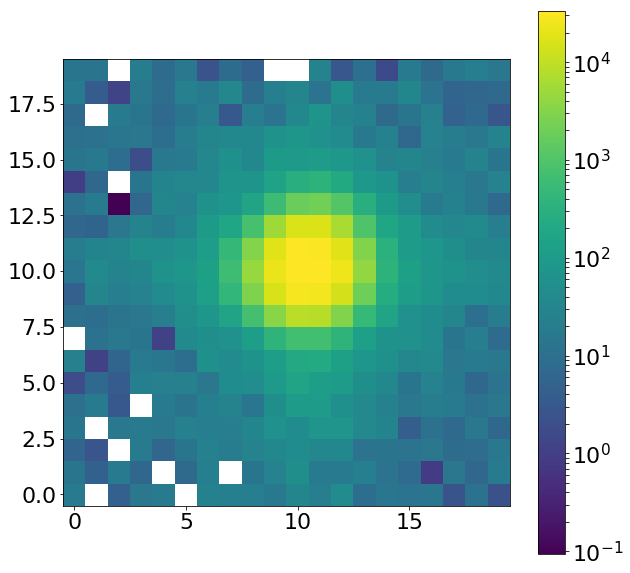

In [1773]:
plt.figure(figsize=(10,10))
plt.imshow(sci_image,norm=LogNorm(),origin='lower')
plt.colorbar()

In [1774]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()

(number of walkers, number of steps, number of parameters): (248, 75, 31)
minimal likelihood is: 813.387200036
minimal chi2 reduced is: 4.0303905045


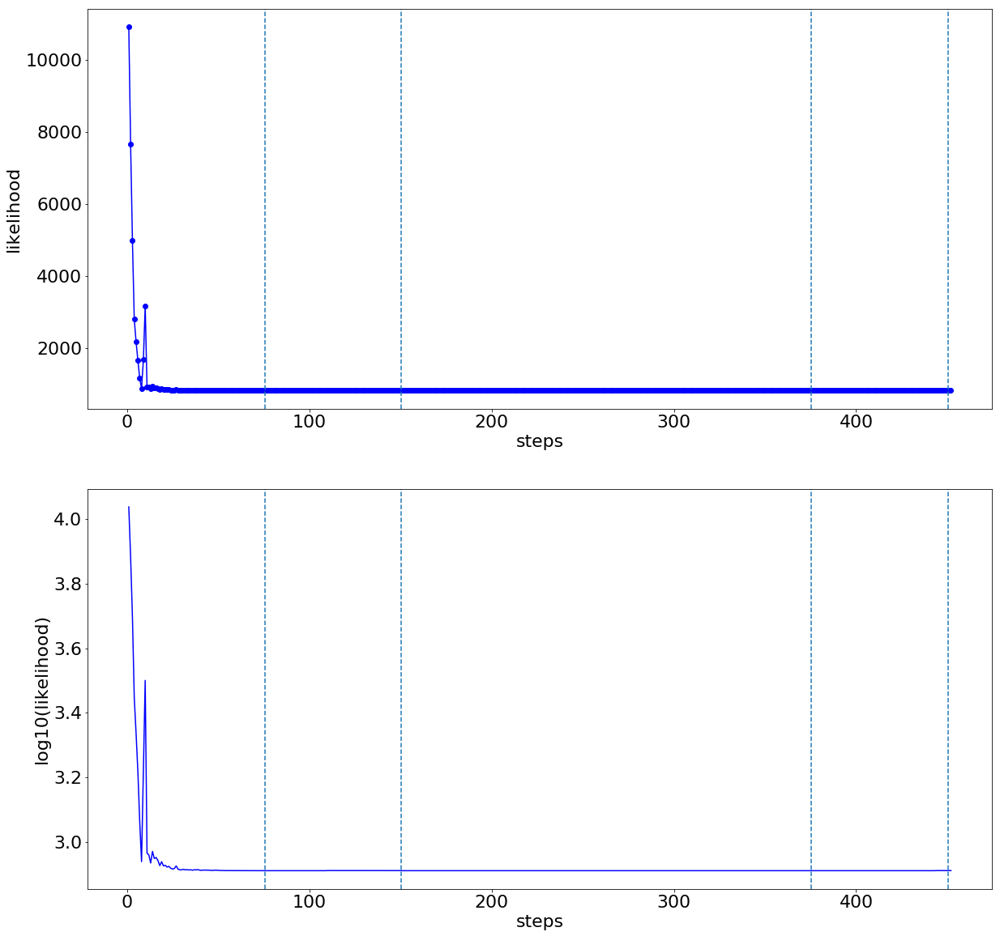

In [1775]:
size=75

plt.figure(figsize=(20,20))
plt.subplot(211)
plt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')
plt.ylabel('likelihood')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(size*2+0.5,ls='--')
plt.axvline(size*5+0.5,ls='--')
plt.axvline(size*6+0.5,ls='--')
plt.subplot(212)
plt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-')
plt.ylabel('log10(likelihood)')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(2*size+0.5,ls='--')
plt.axvline(size*5+0.5,ls='--')
plt.axvline(6*size+0.5,ls='--')

In [1776]:
# this is proposal before the analysis of focused images
allparameters_proposal

dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)

         z4        z5        z6        z7        z8        z9       z10  \
0 -0.450452 -0.242758 -0.151377  0.540587 -0.072194 -0.167122 -0.278223   

        z11  
0 -0.447333  
    hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy  \
0  0.653311   0.075343  0.004528  0.107545  0.064798     0.158258   

   radiometricEffect  radiometricExponent    x_ilum    y_ilum  
0           0.541073             0.805556  0.141328  0.100519  
   x_fiber   y_fiber       0.9  frd_sigma  det_vert  slitHolder_frac_dx  \
0 -0.11089  0.051759  0.945115   0.128359  1.029283           -0.049374   

   grating_lines  scattering_radius  scattering_slope  scattering_amplitude  \
0       120000.0          16.112418           2.58219              0.005961   

   pixel_effect   fiber_r      flux  
0      0.479965  1.885522  0.996308  


In [1777]:
if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1)   
    
model(minchain)
#model(allparameters_proposal)

-813.38720003621813

In [1778]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')

optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled

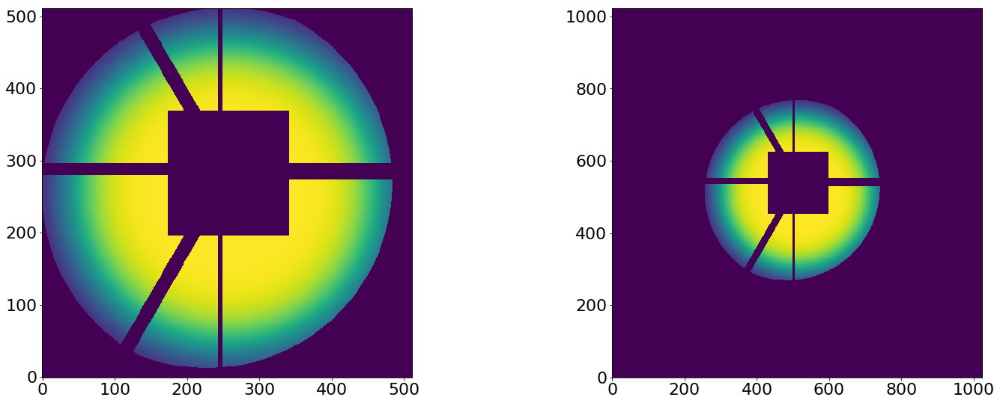

In [1779]:
plt.figure(figsize=(25,20))
plt.subplot(221)
plt.imshow(pupililluminated,origin='lower')
plt.subplot(222)
plt.imshow(ilum,origin='lower')

chi**2 reduced is: 4.03039050528
Abs of residual divided by total flux is: 0.0385782275593
Abs of residual divided by largest value of a flux in the image is: 0.0495536689117


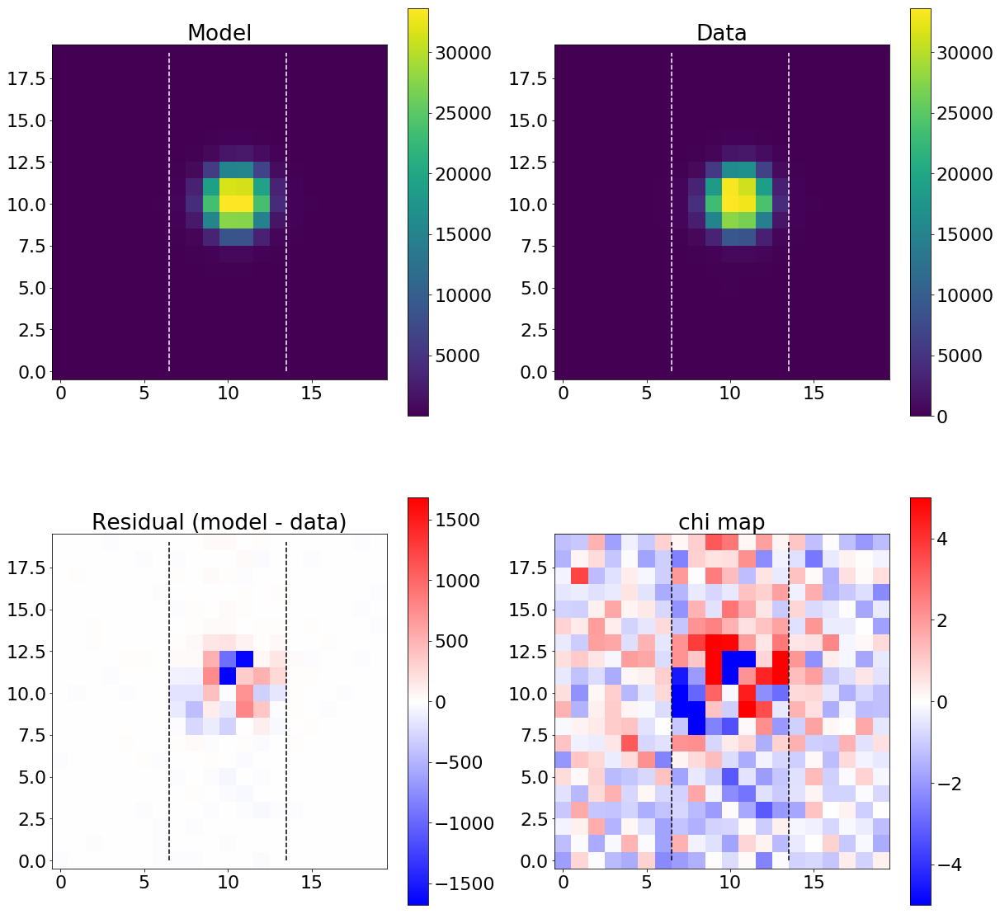

In [1780]:
single_analysis.create_basic_comparison_plot()

4.03039050528
chi**2 reduced is: 4.03039050528
Abs of residual divided by total flux is: 0.0385782275593
Abs of residual divided by largest value of a flux in the image is: 0.0495536689117


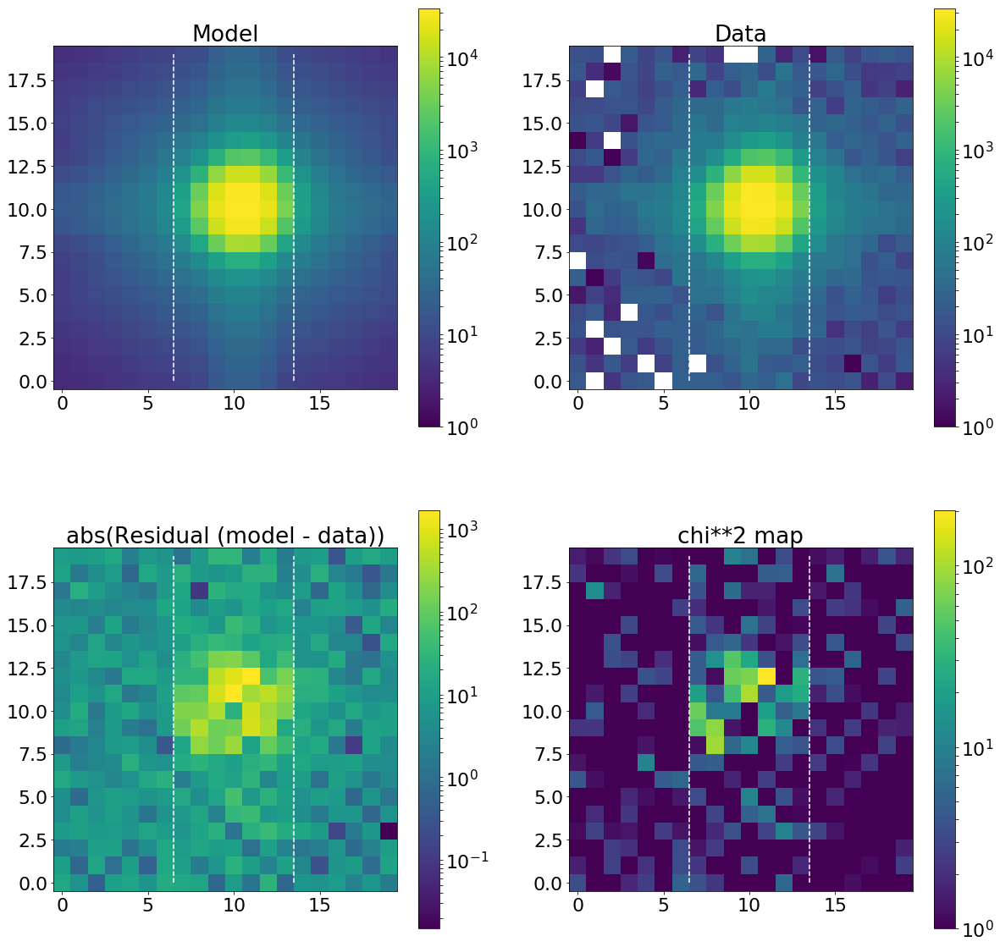

In [1781]:
single_analysis.create_basic_comparison_plot_log()

4.03039050528


0.03857822755926818

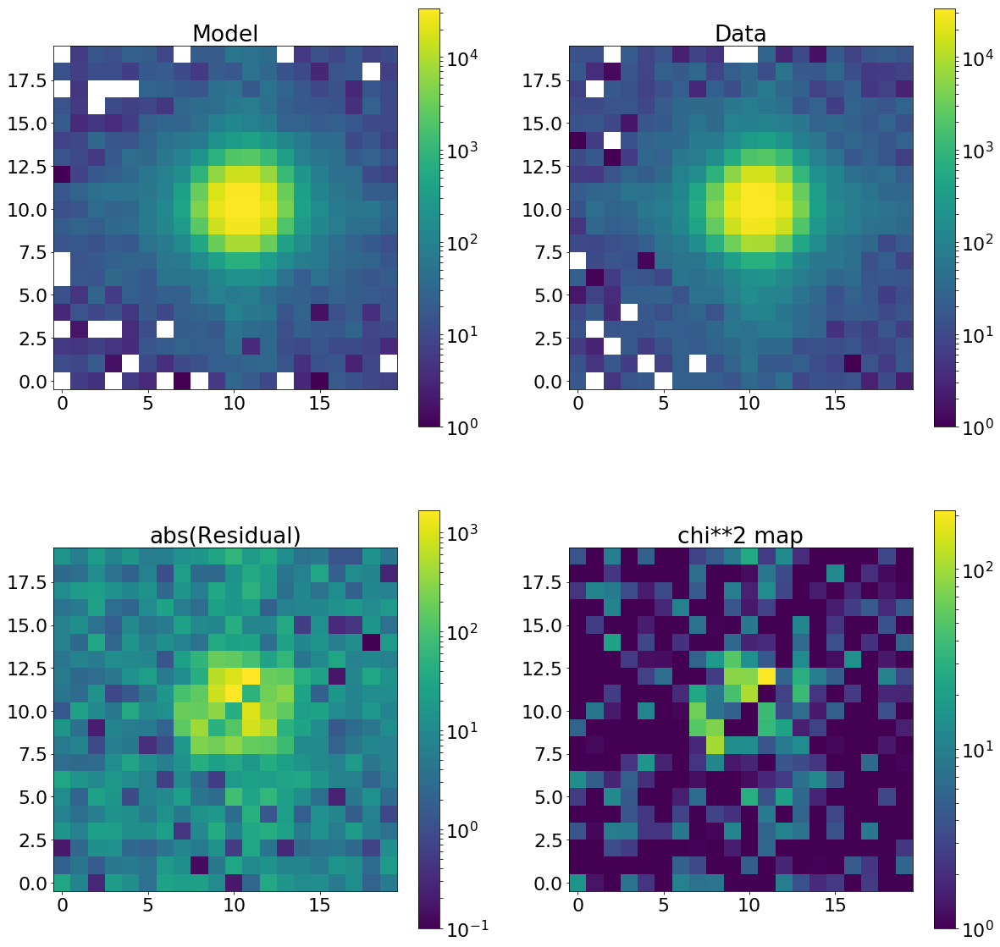

In [1782]:
artifical_noise=single_analysis.create_artificial_noise()


plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(res_iapetus+artifical_noise,origin='lower',vmin=1,vmax=np.max(np.abs(sci_image)),norm=LogNorm())
plt.colorbar()
plt.title('Model')
plt.grid(False)
plt.subplot(222)
plt.imshow(sci_image,origin='lower',vmin=1,vmax=np.max(np.abs(sci_image)),norm=LogNorm())
plt.colorbar()
plt.title('Data')
plt.grid(False)
plt.subplot(223)
plt.imshow(np.abs(res_iapetus+artifical_noise-sci_image),origin='lower',vmax=np.max(np.abs(sci_image))/20,norm=LogNorm())
plt.colorbar()
plt.title('abs(Residual)')
plt.grid(False)
plt.subplot(224)
plt.imshow((res_iapetus+artifical_noise-sci_image)**2/((1)*var_image),origin='lower',vmin=1,norm=LogNorm())
plt.colorbar()
plt.title('chi**2 map')
print(np.sum((res_iapetus-sci_image)**2/((var_image.shape[0]*var_image.shape[1])*var_image)))
np.sum(np.abs((res_iapetus-sci_image)))/np.sum((res_iapetus))

9.96808886886
27.4054174386


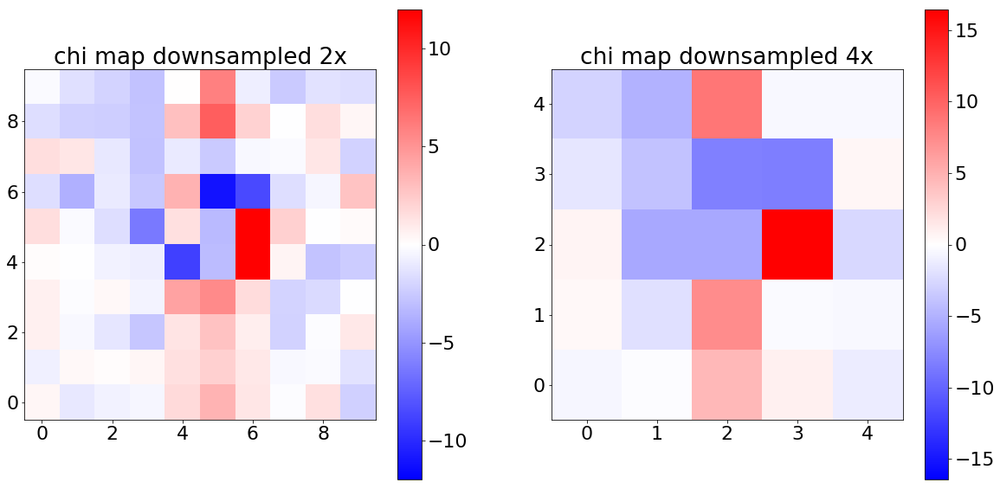

In [555]:
sci_image_2=downsample_manual_function(sci_image,int(sci_image.shape[0]/2))
sci_image_4=downsample_manual_function(sci_image,int(sci_image.shape[0]/4))

res_iapetus_2=downsample_manual_function(res_iapetus,int(res_iapetus.shape[0]/2))
res_iapetus_4=downsample_manual_function(res_iapetus,int(res_iapetus.shape[0]/4))

var_image_2=downsample_manual_function(var_image,int(var_image.shape[0]/2))
var_image_4=downsample_manual_function(var_image,int(var_image.shape[0]/4))

chi_downsample_2=(res_iapetus_2-sci_image_2)/np.sqrt(var_image_2)
chi_downsample_4=(res_iapetus_4-sci_image_4)/np.sqrt(var_image_4)

print(np.mean(chi_downsample_2**2))
print(np.mean(chi_downsample_4**2))


plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(chi_downsample_2,origin='lower',cmap='bwr',vmin=-np.max(np.abs(chi_downsample_2)),vmax=np.max(np.abs(chi_downsample_2)))
plt.colorbar()
plt.title('chi map downsampled 2x')
plt.subplot(122)
plt.imshow(chi_downsample_4,origin='lower',cmap='bwr',vmin=-np.max(np.abs(chi_downsample_4)),vmax=np.max(np.abs(chi_downsample_4)))
plt.colorbar()
plt.title('chi map downsampled 4x')

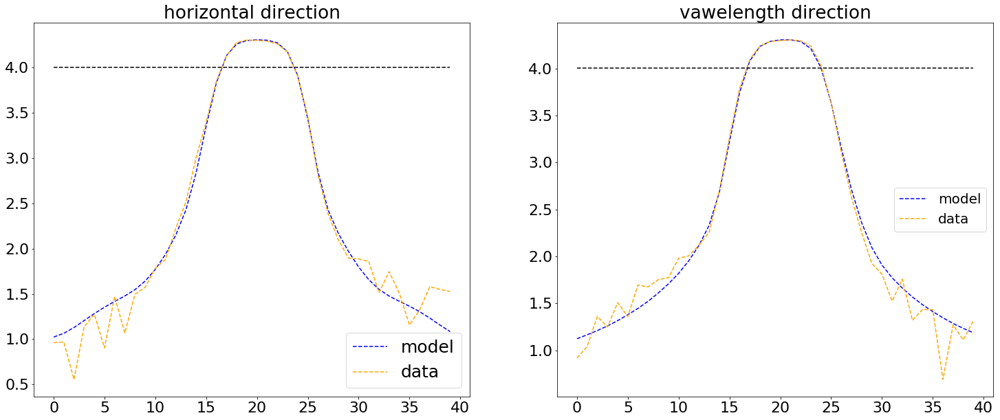

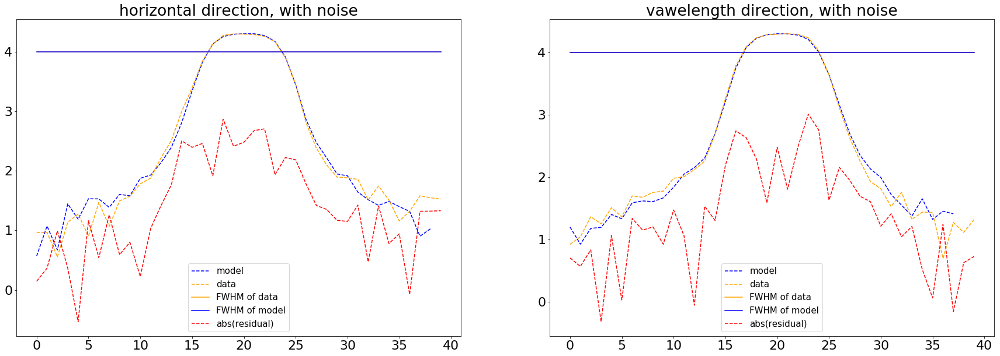

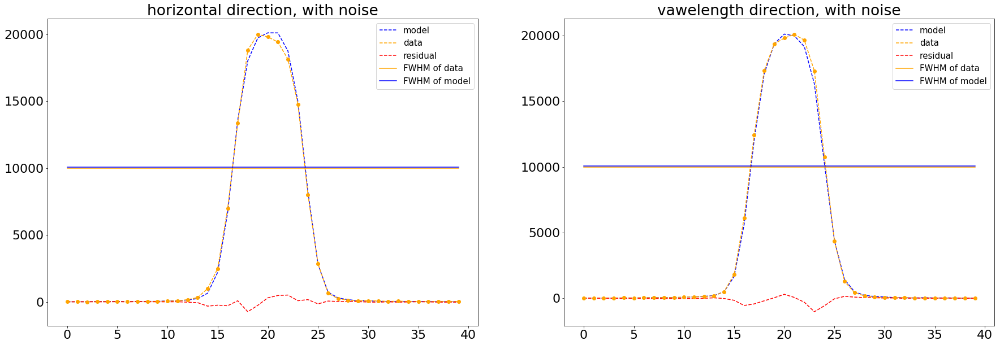

In [527]:
single_analysis.create_cut_plots()

## Total solution

In [211]:
from scipy.optimize import curve_fit
import pickle

with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Oct122018/' + 'results_of_fit_many_interpolation.pkl', 'rb') as f:
    results_of_fit_many_interpolation=pickle.load(f)
    
def lin_fit_2D(x_y, a, b,c):
    x=x_y[:,0]
    y=x_y[:,1]
    return a * x + b*y+c

def lin_fit_3D(dz_dx_dy, a, b,c,d):
    z=dz_dx_dy[:,0]
    x=dz_dx_dy[:,1]
    y=dz_dx_dy[:,2]
    return a * z + b*x+c*y+d


def func(x,a1,a2,b1,b2,c1,d,a1b1,a1c1,b1c1):
    return a1*x[0]+a2*x[0]**2+b1*x[1]+b2*x[1]**2+c1*x[2]+d+a1b1*x[0]*x[1]+a1c1*x[0]*x[2]+b1c1*x[1]*x[2]

#def func(x, a1,a2,a3,a4,a5,b1,b2,b3,b4,b5,c):
#    return np.polynomial.chebyshev.chebval(x[0],[a1,a2,a3,a4,a5])+np.polynomial.chebyshev.chebval(x[1],[b1,b2,b3,b4,b5])+c

#popt1, pcov = curve_fit(func, np.transpose(res_convolving_array1[:,[0,1]]), 10/4*res_convolving_array1[:,2])



label_short=['m4','m35','m3','m05','0','p05','p3','p35','p4']
label_defocus=['m4','m35','m3','m15','p15','p3','p35','p4']
label_focus=['m05','0','p05']
label_focusd=['m05','0','0d','p05']
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
mm=np.array([-4. , -3.5, -3. , -2.5, -2. , -1.5, -1. , -0.5, -0. , -0. ,  0.5,
        1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4.,0 ])

In [217]:
results_of_fit_many_interpolation_with_focus = {'m4': results_of_fit_many_interpolation['m4'].copy(), 
                       'm35' :results_of_fit_many_interpolation['m35'].copy(),
                       'm3' :  results_of_fit_many_interpolation['m3'].copy(),
                       'm25' : results_of_fit_many_interpolation['m25'].copy(),
                       'm2' :results_of_fit_many_interpolation['m2'].copy(),
                       'm15' : results_of_fit_many_interpolation['m15'].copy(),
                       'm1' :results_of_fit_many_interpolation['m1'].copy(),
                       'm05' : results_of_fit_many_interpolation['m05'].copy(),
                       '0d' : results_of_fit_many_interpolation['0d'].copy(),
                       '0' :  results_of_fit_many_interpolation['0'].copy(),
                       'p05' :results_of_fit_many_interpolation['p05'].copy(),
                       'p1' : results_of_fit_many_interpolation['p1'].copy(),
                       'p15': results_of_fit_many_interpolation['p15'].copy(),
                       'p2' : results_of_fit_many_interpolation['p2'].copy(),
                       'p25' :results_of_fit_many_interpolation['p25'].copy(),
                       'p3' : results_of_fit_many_interpolation['p3'].copy(),
                       'p35' : results_of_fit_many_interpolation['p35'].copy(),
                        'p4' :results_of_fit_many_interpolation['p4'].copy(),
                      '0p' :results_of_fit_many_interpolation['0p'].copy()}

In [218]:
i=0
all_x=single_number_for_single_pos_full[results_of_fit_many_interpolation_with_focus[label[i]].index.astype(int)][:,3]
all_y=single_number_for_single_pos_full[results_of_fit_many_interpolation_with_focus[label[i]].index.astype(int)][:,4]

all_x[all_x>int(4096/2)]=all_x[all_x>int(4096/2)]+69

all_x_in_respect_to_center=all_x-int((4096+69)/2)
all_y_in_respect_to_center=all_y-int(4176/2)

In [214]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
              'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
              'radiometricEffect','radiometricExponent',
              'x_ilum','y_ilum',
              'x_fiber','y_fiber','effective_ilum_radius','frd_sigma','det_vert','slitHolder_frac_dx',
              'grating_lines','scattering_radius','scattering_slope','scattering_amplitude',
              'pixel_effect','fiber_r','flux']  

In [225]:
single_selection=results_of_fit_many_focus[i][j]
single_selection_index=single_selection.index
single_selection_index=single_selection_index[single_selection_index!=83]
single_selection=single_selection.loc[single_selection_index]
single_selection

0.0     0.0
1.0     0.0
2.0     0.0
3.0     0.0
4.0     0.0
5.0     0.0
6.0     0.0
7.0     0.0
8.0     0.0
9.0     0.0
10.0    0.0
11.0    0.0
12.0    0.0
13.0    0.0
14.0    0.0
15.0    0.0
16.0    0.0
17.0    0.0
18.0    0.0
19.0    0.0
20.0    0.0
21.0    0.0
22.0    0.0
23.0    0.0
24.0    0.0
25.0    0.0
26.0    0.0
27.0    0.0
28.0    0.0
29.0    0.0
       ... 
69.0    0.0
70.0    0.0
71.0    0.0
72.0    0.0
73.0    0.0
74.0    0.0
75.0    0.0
76.0    0.0
77.0    0.0
78.0    0.0
79.0    0.0
80.0    0.0
81.0    0.0
82.0    0.0
84.0    0.0
85.0    0.0
86.0    0.0
87.0    0.0
88.0    0.0
89.0    0.0
90.0    0.0
91.0    0.0
92.0    0.0
93.0    0.0
94.0    0.0
95.0    0.0
96.0    0.0
97.0    0.0
98.0    0.0
99.0    0.0
Name: flux, Length: 99, dtype: float64

In [226]:
# parameters that vary slowly across the pupil, sensitive in focus

single_parameter=[]
for j in ['z4','scattering_radius','scattering_slope','scattering_amplitude','pixel_effect','flux']:
    for i in label_focus:
        single_selection=results_of_fit_many_focus[i][j]
        

        # removing 83
        single_selection_index=single_selection.index
        single_selection_index=single_selection_index[single_selection_index!=83]
        single_selection=single_selection.loc[single_selection_index]
        
        single_selection_x=all_x_in_respect_to_center[single_selection.index.astype(int)]
        single_selection_y=all_y_in_respect_to_center[single_selection.index.astype(int)]
        single_selection_z=np.full(len(single_selection),mm[label.index(i)])
        single_selection_values=single_selection.values
        single_selection_array=np.transpose(np.array([single_selection.index,single_selection_x,single_selection_y,single_selection_z,single_selection_values]))    
        if i==label_focus[0]:
            single_parameter=single_selection_array
        else:
            single_parameter=np.vstack((single_parameter,single_selection_array))

    popt, pcov = curve_fit(func, np.transpose(single_parameter[:,[1,2,3]]), single_parameter[:,4])
        #print(popt)


    for i in label:
        z=mm[label.index(i)]
        results_of_fit_many_interpolation_with_focus[i].at[:,j]=func([all_x_in_respect_to_center,all_y_in_respect_to_center,np.full(len(all_x),mm[label.index(i)])],*popt)

/Users/nevencaplar/Documents/PFS/lsst_stack3/python/miniconda3-4.3.21/lib/python3.6/site-packages/scipy/optimize/minpack.py:779: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


In [245]:
# factors depending on dy as a non-smooth function
# fits grating lines as a median value of grating value for a given wavelength for 2 value in focus
inerpolation_mean_par_dy=[]
for j in ['grating_lines']:
    dy=[]
    values=[]
    for i in ['0','0d']:
        if len(dy)==0:
            dy=single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,4]
            dspot=single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,2]
            dfiber=single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,1]
            values=results_of_fit_many_focus[i][j]
        else:
            dy=np.hstack((dy,single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,4]))
            dspot=np.hstack((dspot,single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,2]))
            dfiber=np.hstack((dfiber,single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,1]))
            values=np.hstack((values,results_of_fit_many_focus[i][j]))           
            
"""        
grating_lines_res=[]
for i in range(10):
    if len(values[dspot==i])>1:
        grating_lines_res.append(np.median(values[dspot==i]))
    else:
        grating_lines_res.append(100000)
                                           
dy=[]
for i in label:
    dy=single_number_for_single_pos_full[results_of_fit_many[i].index.astype(int)][:,4]
    dspot=single_number_for_single_pos_full[results_of_fit_many[i].index.astype(int)][:,2]

    values=[]
    for l in range(100):
        values.append(grating_lines_res[int(single_number_for_single_pos_full[l][2])])
        
for i in label:
    z=mm[label.index(i)]
    results_of_fit_many_interpolation_with_focus[i].at[:,j]=values
"""  
# have to run "next level grating with splines "
# this creates function grating_lines_fit which gives number of grating lines as a function of wavelegth
# for each spot you have to find which wavelength does it correspond

dy=[]
for i in label:
    dy=single_number_for_single_pos_full[results_of_fit_many_interpolation[i].index.astype(int)][:,4]
    dspot=single_number_for_single_pos_full[results_of_fit_many_interpolation[i].index.astype(int)][:,2]
    dfiber=single_number_for_single_pos_full[results_of_fit_many_interpolation[i].index.astype(int)][:,1]     
    
    values=[]
    for l in range(100):
        z=fiberID[int(dfiber[l])]
        single_fiber_y_data=detector_map[3].data[z][0]
        single_fiber_x_data=detector_map[3].data[z][1]
        single_fiber_wavelength_data=detector_map[3].data[z][3]
        f = interp1d(single_fiber_y_data, single_fiber_wavelength_data,fill_value="extrapolate")
        grating_lines_fit(f(dy[l]))
        
        values.append( grating_lines_fit(f(dy[l])))
   
for i in label:
    z=mm[label.index(i)]
    results_of_fit_many_interpolation_with_focus[i].at[:,j]=values    

In [248]:
# parameters that vary as a function of fiber, sensitive in defocus - describing illumination of the pupil)
# we just select median value across all focused measurments?
inerpolation_mean_par_dx=[]
for j in ['fiber_r']:
    dx=[]
    values=[]
    for i in label_focus:
        if len(dx)==0:
            dx=single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,3]
            dspot=single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,2]
            dfiber=single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,1]

            values=results_of_fit_many_focus[i][j]
        else:
            dx=np.hstack((dx,single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,3]))
            dspot=np.hstack((dspot,single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,2]))
            dfiber=np.hstack((dfiber,single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,1]))
            values=np.hstack((values,results_of_fit_many_focus[i][j]))           
            
            
    fiber_r_res=[]
    for i in range(10):
        if len(values[dspot==i])>1:
            fiber_r_res.append(np.median(values[dfiber==i]))
        else:
            fiber_r_res.append(1.8)


    dx=[]
    for i in label:
        dx=single_number_for_single_pos_full[results_of_fit_many_interpolation[i].index.astype(int)][:,3]
        dspot=single_number_for_single_pos_full[results_of_fit_many_interpolation[i].index.astype(int)][:,1]

        values=[]
        for l in range(100):
            values.append(fiber_r_res[int(single_number_for_single_pos_full[l][1])])

    for i in label:
        z=mm[label.index(i)]
        results_of_fit_many_interpolation_with_focus[i].at[:,j]=values

In [249]:
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Oct122018/' + 'results_of_fit_many_interpolation_with_focus.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_interpolation_with_focus,f, protocol=pickle.HIGHEST_PROTOCOL)

### next level grating with splines 

In [235]:
import astropy
from scipy.interpolate import interp1d

detector_map = fits.open('/Users/nevencaplar/Documents/PFS/DetectorMap/pfsDetectorMap-005833-r1.fits')

single_number_for_single_pos_full_y_reversed=single_number_for_single_pos_full
single_number_for_single_pos_full_y_reversed[:,4]=4176-single_number_for_single_pos_full_y_reversed[:,4]

In [236]:
inerpolation_mean_par_dy=[]
for j in ['grating_lines']:
    dy=[]
    values=[]
    for i in ['0','0d']:
        if len(dy)==0:
            dy=single_number_for_single_pos_full_y_reversed[results_of_fit_many_focus[i][j].index.astype(int)][:,4]
            dspot=single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,2]
            dfiber=single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,1]
            values=results_of_fit_many_focus[i][j]
        else:
            dy=np.hstack((dy,single_number_for_single_pos_full_y_reversed[results_of_fit_many_focus[i][j].index.astype(int)][:,4]))
            dspot=np.hstack((dspot,single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,2]))
            dfiber=np.hstack((dfiber,single_number_for_single_pos_full[results_of_fit_many_focus[i][j].index.astype(int)][:,1]))
            values=np.hstack((values,results_of_fit_many_focus[i][j]))           
            
            
grating_lines_res=[]
for i in range(10):
    if len(values[dspot==i])>1:
        grating_lines_res.append(np.median(values[dspot==i]))
    else:
        grating_lines_res.append(100000)

In [237]:
fiberID=np.round(np.array([6,67,194,257,315,337,393,455,582,644])*600/650).astype(int)

dy_changed_to_dwavelength=[]
for j in range(len(dy)):
    i=fiberID[int(dfiber[j])]
    single_fiber_y_data=detector_map[3].data[i][0]
    single_fiber_x_data=detector_map[3].data[i][1]
    single_fiber_wavelength_data=detector_map[3].data[i][3]
    f = interp1d(single_fiber_y_data, single_fiber_wavelength_data,fill_value="extrapolate")
    dy_changed_to_dwavelength.append(f(dy[j]))
    
dy_changed_to_dwavelength=np.array(dy_changed_to_dwavelength)

In [238]:
dy_changed_to_dwavelength_sorted=dy_changed_to_dwavelength[np.argsort(dy_changed_to_dwavelength)]
values_sorted=values[np.argsort(dy_changed_to_dwavelength)]
position_of_break=np.argwhere(np.diff(dy_changed_to_dwavelength_sorted)>10).ravel()
position_of_break=np.insert(position_of_break,0,0)
position_of_break=np.insert(position_of_break,len(position_of_break),len(dy_changed_to_dwavelength_sorted))
position_of_break

array([  0,  19,  31,  43,  55,  67,  79,  91, 112])

In [239]:
res_wavelength=[]
res_values=[]
for i in range(len(position_of_break)-1):
    res_wavelength.append(dy_changed_to_dwavelength_sorted[position_of_break[i]+1:position_of_break[i+1]])
    res_values.append(values_sorted[position_of_break[i]+1:position_of_break[i+1]])


In [240]:
res_wavelength

[array([ 697.22854184,  697.25174967,  697.25174967,  697.27272542,
         697.27272542,  697.38332812,  697.38332812,  697.42759497,
         697.42759497,  697.43178756,  697.43178756,  697.68441885,
         697.68441885,  697.83892448,  697.83892448,  697.97270674,
         697.97270674,  698.14675173]),
 array([ 739.02747411,  739.02747411,  739.2103927 ,  739.2103927 ,
         739.22304507,  739.22304507,  739.22751872,  739.22751872,
         739.5535851 ,  739.5535851 ,  739.81163684]),
 array([ 764.11355855,  764.11355855,  764.17762361,  764.17762361,
         764.21864752,  764.21864752,  764.2232293 ,  764.2232293 ,
         764.45526048,  764.45526048,  764.69834843]),
 array([ 795.40960279,  795.40960279,  795.45762513,  795.45762513,
         795.60683903,  795.60683903,  795.61153873,  795.61153873,
         795.74945294,  795.74945294,  796.1487438 ]),
 array([ 827.00158013,  827.00158013,  827.05546061,  827.05546061,
         827.17192172,  827.17192172,  827.1767

In [241]:
res_values

[array([  68778.25671722,   62191.88309683,   65998.85248522,
          53253.67925852,   65266.46522928,   37197.74404725,
          36121.6663847 ,  119999.99999999,  119999.99999998,
          90717.49154238,   93346.08147677,  120000.        ,
          70466.89631525,  120000.        ,  120000.        ,
         119999.99999997,   79729.42506347,  103792.40922404]),
 array([  60402.80086841,   66054.19951861,  119999.99999929,
         120000.        ,   88484.45095179,   94617.17891225,
          73239.33417774,  109514.33045492,   84751.62031294,
          57198.45274254,   51583.62298748]),
 array([ 100760.32267386,  119999.99999999,   92922.77487115,
         108065.08230372,  120000.        ,  120000.        ,
         112132.61546303,  119999.99999999,   88362.44986439,
          74508.24762901,   52137.09974176]),
 array([  81299.98316951,   84336.63034254,  115226.09284396,
          80844.3893683 ,  119999.99999999,  120000.        ,
         100783.41634861,  120000.    

In [242]:
res_res_wavelength=[]
res_res_values=[]
for i in res_wavelength:
    res_res_wavelength.append(np.median(i))
    
for i in res_values:
    res_res_values.append(np.median(i))

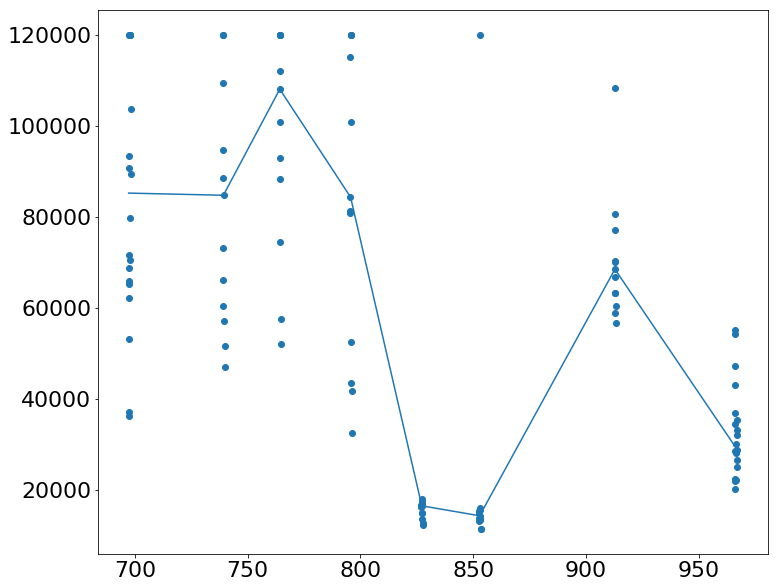

In [243]:
grating_lines_fit=interp1d(res_res_wavelength,res_res_values,fill_value="extrapolate")
plt.scatter(dy_changed_to_dwavelength,values)
plt.plot(dy_changed_to_dwavelength_sorted,grating_lines_fit(dy_changed_to_dwavelength_sorted))

In [244]:
dy=[]
for i in label:
    dy=single_number_for_single_pos_full_y_reversed[results_of_fit_many_interpolation[i].index.astype(int)][:,4]
    dspot=single_number_for_single_pos_full[results_of_fit_many_interpolation[i].index.astype(int)][:,2]
    dfiber=single_number_for_single_pos_full[results_of_fit_many_interpolation[i].index.astype(int)][:,1]     
    
    values=[]
    for l in range(100):
        z=fiberID[int(dfiber[l])]
        single_fiber_y_data=detector_map[3].data[z][0]
        single_fiber_x_data=detector_map[3].data[z][1]
        single_fiber_wavelength_data=detector_map[3].data[z][3]
        f = interp1d(single_fiber_y_data, single_fiber_wavelength_data,fill_value="extrapolate")
        f(grating_lines_fit(dy[l]))
        
        values.append(f(grating_lines_fit(dy[l])))
   
for i in label:
    z=mm[label.index(i)]
    results_of_fit_many_interpolation_with_focus[i].at[:,j]=values

### verification 

In [283]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Oct10'
descriptions=results_of_fit_many_interpolation_with_focus[label[0]].columns
for j in tqdm([7,8,9,10]):
    for i in range(0,len(columns)):

        x=single_number_for_single_pos_full[np.array(results_of_fit_many_interpolation_with_focus[label[j]][descriptions[i]].index).astype(int)][:,[3]].ravel()
        y=single_number_for_single_pos_full[np.array(results_of_fit_many_interpolation_with_focus[label[j]][descriptions[i]].index).astype(int)][:,[4]].ravel()
        values=np.array(results_of_fit_many_interpolation_with_focus[label[j]][descriptions[i]])
        colors=values
        area = np.pi * (15 * 1)**2  # 0 to 15 point radii

        # z5-z11
        if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                abs_max_colors=max(np.abs(colors))
                max_colors=1
                min_colors=-1 

        if np.in1d([i],[0,10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+min_dif
            min_colors=median_color-min_dif
            

            
        #'z4,dx,dy,chi'
        if np.in1d([i],[31,32])[0] == True:   
            max_colors=max(colors)
            min_colors=min(colors)

        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4416)
        plt.xlim(0,4294)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title('Focus Interpolation: '+str(label[j])+" "+str(descriptions[i]))


        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneInterpolation/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneInterpolation/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
        plt.clf()






  0%|                                                                   | 0/4 [00:00<?, ?it/s]




 25%|██████████████▊                                            | 1/4 [00:14<00:44, 14.74s/it]




 50%|█████████████████████████████▌                             | 2/4 [00:28<00:28, 14.24s/it]




 75%|████████████████████████████████████████████▎              | 3/4 [00:42<00:14, 14.10s/it]




100%|███████████████████████████████████████████████████████████| 4/4 [00:56<00:00, 14.24s/it]






# Simulating images

## creating pandas dataframe contaning information about PSF at each point of the detector

In [284]:
import astropy
from astropy.io import fits

detector_map = fits.open('/Users/nevencaplar/Documents/PFS/DetectorMap/pfsDetectorMap-005833-r1.fits')

In [285]:
from scipy.optimize import curve_fit
import pickle

with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Oct122018/' + 'results_of_fit_many_interpolation_with_focus.pkl', 'rb') as f:
    results_of_fit_many_interpolation_with_focus=pickle.load(f)


def func_focus(x,a1,a2,b1,b2,d,a1b1):
    return a1*x[0]+a2*x[0]**2+b1*x[1]+b2*x[1]**2+d+a1b1*x[0]*x[1]

In [296]:
j=0
i=9
#x=single_number_for_single_pos_full[np.array(results_of_fit_many_interpolation_with_focus[label[j]][descriptions[i]].index).astype(int)][:,[3]].ravel()
#y=4294-single_number_for_single_pos_full[np.array(results_of_fit_many_interpolation_with_focus[label[j]][descriptions[i]].index).astype(int)][:,[4]].ravel()

all_x=single_number_for_single_pos_full[results_of_fit_many_interpolation_with_focus[label[i]].index.astype(int)][:,3]
all_y=single_number_for_single_pos_full[results_of_fit_many_interpolation_with_focus[label[i]].index.astype(int)][:,4]

all_x[all_x>int(4096/2)]=all_x[all_x>int(4096/2)]+69

all_x_in_respect_to_center=all_x-int((4096+69)/2)
all_y_in_respect_to_center=all_y-int(4176/2)


In [297]:
parameters_that_vary_as_xy=['z4','z5','z6','z7','z8','z9','z10','z11','hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
                            'det_vert','slitHolder_frac_dx','scattering_radius','scattering_slope','scattering_amplitude','pixel_effect']
parameters_that_vary_as_fiber=['fiber_r','frd_sigma','radiometricEffect','radiometricExponent','x_ilum','y_ilum','x_fiber','y_fiber','effective_ilum_radius']
parameters_that_vary_as_wavelength=['grating_lines']


In [298]:
# parameters that vary slowly across the detector - describing wavefront and pupil (without illumination of the pupil)
parameters_for_func_focus_that_vary_as_xy=[]
single_parameter=[]
for j in parameters_that_vary_as_xy:

    single_selection=results_of_fit_many_interpolation_with_focus['0'][j]
    single_selection_x=all_x_in_respect_to_center[single_selection.index.astype(int)]
    single_selection_y=all_y_in_respect_to_center[single_selection.index.astype(int)]
    single_selection_values=single_selection.values
    single_selection_array=np.transpose(np.array([single_selection.index,single_selection_x,single_selection_y,single_selection_values]))    

    single_parameter=single_selection_array


    popt, pcov = curve_fit(func_focus, xdata=np.transpose(single_parameter[:,[1,2]]), ydata=single_parameter[:,3],p0=[0,0,0,0,0,0])
    parameters_for_func_focus_that_vary_as_xy.append(popt)
    print(str(j)+' '+str(popt))
    #print(str(j)+' '+str(func_focus([2100,0],*popt)))

parameters_for_func_focus_that_vary_as_xy=np.array(parameters_for_func_focus_that_vary_as_xy)

z4 [-0.00006798  0.00000021  0.00006836  0.00000007 -0.54403919 -0.00000003]
z5 [ 0.00002076  0.00000007  0.00007841 -0.00000001 -0.23661718 -0.00000026]
z6 [ 0.00001076  0.00000013  0.00005542 -0.00000024 -0.14074264  0.00000002]
z7 [ 0.00011376 -0.00000003  0.00010435 -0.00000004  0.54607933 -0.00000007]
z8 [-0.00022381 -0.         -0.00000242  0.00000003 -0.05561376 -0.00000001]
z9 [ 0.0000348   0.00000002  0.00004312 -0.00000002 -0.16370656  0.        ]
z10 [ 0.00002769 -0.         -0.00001455 -0.00000001 -0.2819536   0.00000003]
z11 [-0.00001499  0.00000008  0.00008186  0.00000008 -0.43671165  0.00000004]
hscFrac [-0.00000649  0.00000001  0.00000287  0.          0.65417141  0.        ]
strutFrac [-0.00000333  0.          0.00000158  0.          0.07572842  0.        ]
dxFocal [ 0.00008448 -0.00000001 -0.00000106 -0.         -0.00207493  0.        ]
dyFocal [ 0.00007415 -0.00000001 -0.00009063 -0.00000001  0.08968609  0.        ]
slitFrac [-0.00000043 -0.          0.00000205 -0.   

In [299]:
parameters_for_func_focus_that_vary_as_fiber=[]
for j in range(len(parameters_that_vary_as_fiber)):
    parameters_for_func_focus_that_vary_as_fiber.append([np.median(results_of_fit_many_interpolation_with_focus['0'][parameters_that_vary_as_fiber[j]]),np.std(results_of_fit_many_interpolation_with_focus['0'][parameters_that_vary_as_fiber[j]])])
    print(str(parameters_that_vary_as_fiber[j])+str(parameters_for_func_focus_that_vary_as_fiber[-1]))       


fiber_r[1.875066976148841, 0.041139660711581795]
frd_sigma[0.1132864415082766, 0.04132711615903417]
radiometricEffect[0.67636198527276692, 0.1473797217518026]
radiometricExponent[0.64185182071307656, 0.28507785386208295]
x_ilum[0.047802537356487394, 0.04395252315699463]
y_ilum[0.067474806412326685, 0.02753514168350894]
x_fiber[-0.021363945553947383, 0.03459866537620169]
y_fiber[0.038253712992682348, 0.08429583361136656]
effective_ilum_radius[0.93599567858684107, 0.03525247419814343]


In [301]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Oct10'
descriptions=results_of_fit_many_interpolation_with_focus[label[0]].columns
for j in tqdm([7,8,9,10]):
    for i in range(0,8):

        x=single_number_for_single_pos_full[np.array(results_of_fit_many_interpolation_with_focus[label[j]][descriptions[i]].index).astype(int)][:,[3]].ravel()
        y=single_number_for_single_pos_full[np.array(results_of_fit_many_interpolation_with_focus[label[j]][descriptions[i]].index).astype(int)][:,[4]].ravel()
        values=func_focus([x-int((4096+69)/2),y-int(4176/2)],*parameters_for_func_focus_that_vary_as_xy[i])
        colors=values
        area = np.pi * (15 * 1)**2  # 0 to 15 point radii

        # z5-z11
        if np.in1d([i],[0,1,2,3,4,5,6,7])[0] == True:
                abs_max_colors=max(np.abs(colors))
                max_colors=1
                min_colors=-1 

        if np.in1d([i],[10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+min_dif
            min_colors=median_color-min_dif
            

            
        #'z4,dx,dy,chi'
        if np.in1d([i],[31,32])[0] == True:   
            max_colors=max(colors)
            min_colors=min(colors)

        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4176)
        plt.xlim(0,4294)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title('Simulation: '+str(label[j])+" "+str(descriptions[i]))


        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneSimulation/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneSimulation/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
        plt.clf()
        
        
        






  0%|                                                                   | 0/4 [00:00<?, ?it/s]




 25%|██████████████▊                                            | 1/4 [00:03<00:11,  3.68s/it]




 50%|█████████████████████████████▌                             | 2/4 [00:07<00:07,  3.66s/it]




 75%|████████████████████████████████████████████▎              | 3/4 [00:10<00:03,  3.64s/it]




100%|███████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.65s/it]






In [303]:
number_of_spots=25
number_of_fibers=600

fiber_list=[]
for i in range(1,number_of_fibers+1):
    fiber_list.append('fiber_'+str(i))

fiber_array=np.repeat(fiber_list,number_of_spots)

spot_list=[]
for i in range(1,number_of_spots+1):
    spot_list.append(np.repeat('spot_'+str(i),number_of_fibers))
    
spot_array=np.transpose(np.array(spot_list)).ravel()


arrays=[fiber_array,spot_array]

df = pd.DataFrame(np.zeros((number_of_spots*number_of_fibers,len(columns))), index=arrays,columns=columns)

In [262]:
par=1
#probably not correct
if np.mean(single_fiber_x_data)>((4096)/2):
    single_fiber_x_data=single_fiber_x_data+69
else:
    pass

func_focus([single_fiber_x_data-int((4096+69)/2),single_fiber_y_data-int(4176/2)],*parameters_for_func_focus_that_vary_as_xy[par])

array([ 0.88852772,  0.8242463 ,  0.7596088 ,  0.69455529,  0.62903908,
        0.56301948,  0.49646243,  0.42933639,  0.36119657,  0.29284838,
        0.22385537,  0.15419668,  0.08385297,  0.01280573, -0.05896272,
       -0.1314702 , -0.20518681, -0.27923301, -0.35407652, -0.42973981,
       -0.50624755, -0.58362703, -0.6619088 , -0.74112924, -0.82182651])

In [304]:
# function of detector

for fiber_i in range(number_of_fibers):
    single_fiber_y_data=detector_map[3].data[fiber_i][0]-int((4096+69)/2)
    single_fiber_x_data=detector_map[3].data[fiber_i][1]-int(4176/2)
    single_fiber_wavelength_data=detector_map[3].data[fiber_i][3]
    for par in range(len(parameters_for_func_focus_that_vary_as_xy)):
        df.loc[['fiber_'+str(fiber_i+1)],parameters_that_vary_as_xy[par]]=func_focus([single_fiber_x_data,single_fiber_y_data],*parameters_for_func_focus_that_vary_as_xy[par])
        
        
# function of fiber 

for fiber_i in range(number_of_fibers):
    single_fiber_y_data=detector_map[3].data[fiber_i][0]-int((4096+69)/2)
    single_fiber_x_data=detector_map[3].data[fiber_i][1]-int(4176/2)
    single_fiber_wavelength_data=detector_map[3].data[fiber_i][3]
    for par in range(len(parameters_that_vary_as_fiber)):
        df.loc[['fiber_'+str(fiber_i+1)],parameters_that_vary_as_fiber[par]]=np.random.randn()*parameters_for_func_focus_that_vary_as_fiber[par][1]+parameters_for_func_focus_that_vary_as_fiber[par][0]
        
# flux

for fiber_i in range(number_of_fibers):
    single_fiber_y_data=detector_map[3].data[fiber_i][0]-int((4096+69)/2)
    single_fiber_x_data=detector_map[3].data[fiber_i][1]-int(4176/2)
    single_fiber_wavelength_data=detector_map[3].data[fiber_i][3]
    for par in range(len(['flux'])):
        df.loc[['fiber_'+str(fiber_i+1)],['flux']]=1
        
# grating lines        

for fiber_i in range(number_of_fibers):
    single_fiber_y_data=detector_map[3].data[fiber_i][0]-int((4096+69)/2)
    single_fiber_x_data=detector_map[3].data[fiber_i][1]-int(4176/2)
    single_fiber_wavelength_data=detector_map[3].data[fiber_i][3]
    for par in range(len(['grating_lines'])):
        df.loc[['fiber_'+str(fiber_i+1)],['grating_lines']]=grating_lines_fit(single_fiber_wavelength_data)


In [305]:
df.to_pickle("/Users/nevencaplar/Documents/PFS/Simulations/df_v01b.pkl")

In [309]:
df.loc['fiber_1']

,z4,z5,z6,z7,z8,z9,z10,z11,hscFrac,strutFrac,...,frd_sigma,det_vert,slitHolder_frac_dx,grating_lines,scattering_radius,scattering_slope,scattering_amplitude,pixel_effect,fiber_r,flux
spot_1,0.439131,-1.188993,-0.558055,-0.473738,0.476554,-0.301180,-0.226064,0.240077,0.711171,0.107012,...,0.101807,0.967601,-0.199365,85920.071310,35.249003,2.167165,0.019343,0.366372,1.793011,1.0
spot_2,0.419056,-1.082179,-0.410126,-0.406325,0.461407,-0.284474,-0.234817,0.190236,0.709191,0.103956,...,0.101807,0.961984,-0.220098,85760.322640,33.095872,2.138984,0.017384,0.374567,1.793011,1.0
spot_3,0.402783,-0.976317,-0.274974,-0.341259,0.447749,-0.268712,-0.243820,0.144989,0.707325,0.101164,...,0.101807,0.957126,-0.239384,85600.376206,31.085935,2.114762,0.015746,0.382501,1.793011,1.0
spot_4,0.390283,-0.871368,-0.152624,-0.278516,0.435572,-0.253897,-0.253080,0.104315,0.705572,0.098638,...,0.101807,0.953030,-0.257217,85440.332612,29.218938,2.094503,0.014429,0.390175,1.793011,1.0
spot_5,0.381539,-0.767298,-0.043091,-0.218078,0.424874,-0.240028,-0.262599,0.068200,0.703930,0.096376,...,0.101807,0.949698,-0.273594,85280.268346,27.494694,2.078208,0.013434,0.397594,1.793011,1.0
spot_6,0.376538,-0.664077,0.053611,-0.159929,0.415649,-0.227108,-0.272381,0.036632,0.702399,0.094379,...,0.101807,0.947134,-0.288511,85120.255072,25.913037,2.065878,0.012760,0.404759,1.793011,1.0
spot_7,0.375272,-0.561053,0.137946,-0.103721,0.407853,-0.215068,-0.282490,0.009447,0.700968,0.092635,...,0.101807,0.945329,-0.302044,84959.370120,24.465444,2.057475,0.012407,0.411715,1.793011,1.0
spot_8,0.377748,-0.459459,0.208876,-0.050127,0.401578,-0.204054,-0.292807,-0.013030,0.699655,0.091168,...,0.101807,0.944307,-0.314026,84799.630408,23.169445,2.053101,0.012380,0.418378,1.793011,1.0
spot_9,0.383941,-0.358642,0.266948,0.001211,0.396770,-0.193991,-0.303394,-0.030986,0.698449,0.089963,...,0.101807,0.944055,-0.324542,93964.598592,22.015671,2.052694,0.012675,0.424792,1.793011,1.0
spot_10,0.393844,-0.258583,0.312155,0.050303,0.393428,-0.184880,-0.314254,-0.044430,0.697350,0.089022,...,0.101807,0.944575,-0.333592,107122.740715,21.004025,2.056255,0.013292,0.430959,1.793011,1.0


## creating and testing images, before going to cluster

In [310]:
%load_ext autoreload
%autoreload 2

#import Zernike_Module
#from Zernike_Module import LNP_PFS,LN_PFS_single,create_parInit,downsample_manual_function,Zernike_Analysis,PFSPupilFactory,custom_fftconvolve,stepK,maxK,sky_scale,sky_size,create_x,remove_pupil_parameters_from_all_parameters
import pickle
import Zernike_Module_Simulation
from Zernike_Module_Simulation import LNP_PFS,LN_PFS_single,create_parInit,downsample_manual_function,Zernike_Analysis,PFSPupilFactory,custom_fftconvolve,stepK,maxK,sky_scale,sky_size,create_x,remove_pupil_parameters_from_all_parameters

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [311]:
print(Zernike_Module_Simulation.__version__)

0.1


In [312]:
sci_template_image=np.ones((20,20))
var_template_image=np.ones((20,20))

SIMULATION_FOLDER='/Users/nevencaplar/Documents/PFS/Simulations/'

with open(SIMULATION_FOLDER + 'df_v01b.pkl', 'rb') as f:
    df=pickle.load(f)

In [313]:
import multiprocessing
pool=multiprocessing.Pool()

Process ForkPoolWorker-21:
Process ForkPoolWorker-19:
Process ForkPoolWorker-20:
Process ForkPoolWorker-22:
Process ForkPoolWorker-18:
Process ForkPoolWorker-25:
Process ForkPoolWorker-23:
Process ForkPoolWorker-24:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/nevencaplar/Documents/PFS/lsst_stack3/python/miniconda3-4.3.21/lib/python3.6/multiprocessing/process.py", line 249, in _bootstrap
    self.run()
  File "/Users/nevencaplar/Documents/PFS/lsst_stack3/python/miniconda3-4.3.21/lib/python3.6/multiprocessing/process.py", line 249, in _bootstrap
    self.run()
  File "/Users/nevencaplar/Documents/PFS/lsst_stack3/python/miniconda3-4.3.21/lib/python3.6/multiprocessing/process.py", line 249, in _bootstrap
    self.run()
  File "/Users/nevencaplar/Documents/PFS/lsst_stack3/python

In [63]:
number_of_spots=25
number_of_fibers=600

fiber_list=[]
for i in range(1,number_of_fibers+1):
    fiber_list.append('fiber_'+str(i))

fiber_array=np.repeat(fiber_list,number_of_spots)

spot_list=[]
for i in range(1,number_of_spots+1):
    spot_list.append(np.repeat('spot_'+str(i),number_of_fibers))
    
spot_array=np.transpose(np.array(spot_list)).ravel()


arrays=[fiber_array,spot_array]

data=np.transpose(np.array(arrays))

In [64]:
assert df.shape[0]==len(data)

In [49]:
def mp_worker(input):
    model = LN_PFS_single(sci_template_image,var_template_image,pupil_parameters=None,use_pupil_parameters=None,save=0,simulation_name=input[0]+'_'+input[1])
    model(df.loc[(input[0],input[1])].values)
    
def mp_handler():
    p = multiprocessing.Pool(2)
    p.map(mp_worker, data)
    
mp_handler()

In [105]:
input=data[24]
df.loc[(input[0],input[1])].values

array([     0.98502046,      1.16783772,     -0.55707095,      0.52141405,
            0.52004807,     -0.16268742,     -0.51177128,      0.29488153,
            0.69352911,      0.1065374 ,     -0.23772059,     -0.32924079,
            0.06069671,     -0.15488143,      0.86147436,      0.74751597,
            0.02453408,      0.07623874,      0.00767324,      0.08689082,
            0.89252054,      0.13913712,      1.04529656,     -0.29341865,
        32220.72709232,     22.8612524 ,      1.9277709 ,      0.0722483 ,
            0.57598262,      1.80370272,      1.        ])

In [106]:
mp_worker(data[24])

FileNotFoundError: [Errno 2] No such file or directory: '/tigress/ncaplar/Simulations/v01/Result/fiber_1_spot_25.npy'

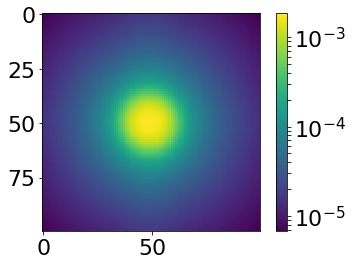

In [34]:
plt.imshow(optPsf_cut_grating_convolved_simulation_cut, norm=LogNorm())
plt.colorbar()

## creating images on cluster

In [ ]:
# run
# python ZernikeSimulation_Creator.py

## creating fits

In [316]:
from astropy.io import fits
import glob

def last_4chars(x):
    return(int(x[-6:-3].replace("_","").replace(".","")))

for fiber_i in tqdm(range(1,601)):
    new_hdul = fits.HDUList()
    single_fiber_names=sorted(glob.glob("/Users/nevencaplar/Documents/PFS/Simulations/v01/Result/Npy/fiber_"+str(fiber_i)+"_*"), key = last_4chars)

    for i in range(25):
        n=np.load(single_fiber_names[i])
        new_hdul.append(fits.ImageHDU(n))

    new_hdul.writeto('/Users/nevencaplar/Documents/PFS/Simulations/v01/Result/Fits/fiber_'+str(fiber_i)+'.fits',overwrite=True)







  0%|                                                                 | 0/600 [00:00<?, ?it/s]





  0%|                                                         | 1/600 [00:00<01:27,  6.83it/s]





  0%|▏                                                        | 2/600 [00:00<01:17,  7.75it/s]





  0%|▎                                                        | 3/600 [00:00<01:14,  8.00it/s]





  1%|▍                                                        | 4/600 [00:00<01:15,  7.94it/s]





  1%|▍                                                        | 5/600 [00:00<01:13,  8.07it/s]





  1%|▌                                                        | 6/600 [00:00<01:12,  8.15it/s]





  1%|▋                                                        | 7/600 [00:00<01:12,  8.22it/s]





  1%|▊                                                        | 8/600 [00:00<01:11,  8.28it/s]





  2%|▊                                                        | 9/600 [00:01<01:10,  8.36it/s]

 12%|██████▍                                                 | 69/600 [00:08<01:06,  8.03it/s]





 12%|██████▌                                                 | 70/600 [00:08<01:05,  8.04it/s]





 12%|██████▋                                                 | 71/600 [00:08<01:05,  8.05it/s]





 12%|██████▋                                                 | 72/600 [00:08<01:05,  8.05it/s]





 12%|██████▊                                                 | 73/600 [00:09<01:05,  8.07it/s]





 12%|██████▉                                                 | 74/600 [00:09<01:05,  8.08it/s]





 12%|███████                                                 | 75/600 [00:09<01:04,  8.09it/s]





 13%|███████                                                 | 76/600 [00:09<01:04,  8.09it/s]





 13%|███████▏                                                | 77/600 [00:09<01:04,  8.10it/s]





 13%|███████▎                                                | 78/600 [00:09<01:04,  8.10it/s]







 23%|████████████▋                                          | 138/600 [00:16<00:55,  8.26it/s]





 23%|████████████▋                                          | 139/600 [00:16<00:55,  8.26it/s]





 23%|████████████▊                                          | 140/600 [00:16<00:55,  8.26it/s]





 24%|████████████▉                                          | 141/600 [00:17<00:55,  8.27it/s]





 24%|█████████████                                          | 142/600 [00:17<00:55,  8.27it/s]





 24%|█████████████                                          | 143/600 [00:17<00:55,  8.27it/s]





 24%|█████████████▏                                         | 144/600 [00:17<00:55,  8.28it/s]





 24%|█████████████▎                                         | 145/600 [00:17<00:54,  8.28it/s]





 24%|█████████████▍                                         | 146/600 [00:17<00:54,  8.29it/s]





 24%|█████████████▍                                         | 147/600 [00:17<00:54,  8.29it/s]







 34%|██████████████████▉                                    | 207/600 [00:24<00:46,  8.49it/s]





 35%|███████████████████                                    | 208/600 [00:24<00:46,  8.49it/s]





 35%|███████████████████▏                                   | 209/600 [00:24<00:46,  8.49it/s]





 35%|███████████████████▎                                   | 210/600 [00:24<00:45,  8.50it/s]





 35%|███████████████████▎                                   | 211/600 [00:24<00:45,  8.50it/s]





 35%|███████████████████▍                                   | 212/600 [00:24<00:45,  8.50it/s]





 36%|███████████████████▌                                   | 213/600 [00:25<00:45,  8.50it/s]





 36%|███████████████████▌                                   | 214/600 [00:25<00:45,  8.50it/s]





 36%|███████████████████▋                                   | 215/600 [00:25<00:45,  8.50it/s]





 36%|███████████████████▊                                   | 216/600 [00:25<00:45,  8.50it/s]







 46%|█████████████████████████▎                             | 276/600 [00:32<00:38,  8.46it/s]





 46%|█████████████████████████▍                             | 277/600 [00:32<00:38,  8.45it/s]





 46%|█████████████████████████▍                             | 278/600 [00:32<00:38,  8.45it/s]





 46%|█████████████████████████▌                             | 279/600 [00:33<00:37,  8.45it/s]





 47%|█████████████████████████▋                             | 280/600 [00:33<00:37,  8.45it/s]





 47%|█████████████████████████▊                             | 281/600 [00:33<00:37,  8.45it/s]





 47%|█████████████████████████▊                             | 282/600 [00:33<00:37,  8.45it/s]





 47%|█████████████████████████▉                             | 283/600 [00:33<00:37,  8.45it/s]





 47%|██████████████████████████                             | 284/600 [00:33<00:37,  8.45it/s]





 48%|██████████████████████████▏                            | 285/600 [00:33<00:37,  8.45it/s]







 57%|███████████████████████████████▌                       | 345/600 [00:40<00:29,  8.52it/s]





 58%|███████████████████████████████▋                       | 346/600 [00:40<00:29,  8.52it/s]





 58%|███████████████████████████████▊                       | 347/600 [00:40<00:29,  8.52it/s]





 58%|███████████████████████████████▉                       | 348/600 [00:40<00:29,  8.52it/s]





 58%|███████████████████████████████▉                       | 349/600 [00:40<00:29,  8.52it/s]





 58%|████████████████████████████████                       | 350/600 [00:41<00:29,  8.52it/s]





 58%|████████████████████████████████▏                      | 351/600 [00:41<00:29,  8.52it/s]





 59%|████████████████████████████████▎                      | 352/600 [00:41<00:29,  8.52it/s]





 59%|████████████████████████████████▎                      | 353/600 [00:41<00:28,  8.52it/s]





 59%|████████████████████████████████▍                      | 354/600 [00:41<00:28,  8.52it/s]







 69%|█████████████████████████████████████▉                 | 414/600 [00:48<00:21,  8.55it/s]





 69%|██████████████████████████████████████                 | 415/600 [00:48<00:21,  8.55it/s]





 69%|██████████████████████████████████████▏                | 416/600 [00:48<00:21,  8.55it/s]





 70%|██████████████████████████████████████▏                | 417/600 [00:48<00:21,  8.55it/s]





 70%|██████████████████████████████████████▎                | 418/600 [00:48<00:21,  8.55it/s]





 70%|██████████████████████████████████████▍                | 419/600 [00:48<00:21,  8.55it/s]





 70%|██████████████████████████████████████▌                | 420/600 [00:49<00:21,  8.55it/s]





 70%|██████████████████████████████████████▌                | 421/600 [00:49<00:20,  8.55it/s]





 70%|██████████████████████████████████████▋                | 422/600 [00:49<00:20,  8.55it/s]





 70%|██████████████████████████████████████▊                | 423/600 [00:49<00:20,  8.55it/s]







 80%|████████████████████████████████████████████▎          | 483/600 [00:56<00:13,  8.57it/s]





 81%|████████████████████████████████████████████▎          | 484/600 [00:56<00:13,  8.57it/s]





 81%|████████████████████████████████████████████▍          | 485/600 [00:56<00:13,  8.57it/s]





 81%|████████████████████████████████████████████▌          | 486/600 [00:56<00:13,  8.57it/s]





 81%|████████████████████████████████████████████▋          | 487/600 [00:56<00:13,  8.57it/s]





 81%|████████████████████████████████████████████▋          | 488/600 [00:56<00:13,  8.58it/s]





 82%|████████████████████████████████████████████▊          | 489/600 [00:57<00:12,  8.58it/s]





 82%|████████████████████████████████████████████▉          | 490/600 [00:57<00:12,  8.58it/s]





 82%|█████████████████████████████████████████████          | 491/600 [00:57<00:12,  8.58it/s]





 82%|█████████████████████████████████████████████          | 492/600 [00:57<00:12,  8.58it/s]







 92%|██████████████████████████████████████████████████▌    | 552/600 [01:04<00:05,  8.58it/s]





 92%|██████████████████████████████████████████████████▋    | 553/600 [01:04<00:05,  8.58it/s]





 92%|██████████████████████████████████████████████████▊    | 554/600 [01:04<00:05,  8.58it/s]





 92%|██████████████████████████████████████████████████▉    | 555/600 [01:04<00:05,  8.58it/s]





 93%|██████████████████████████████████████████████████▉    | 556/600 [01:04<00:05,  8.58it/s]





 93%|███████████████████████████████████████████████████    | 557/600 [01:04<00:05,  8.58it/s]





 93%|███████████████████████████████████████████████████▏   | 558/600 [01:04<00:04,  8.59it/s]





 93%|███████████████████████████████████████████████████▏   | 559/600 [01:05<00:04,  8.58it/s]





 93%|███████████████████████████████████████████████████▎   | 560/600 [01:05<00:04,  8.58it/s]





 94%|███████████████████████████████████████████████████▍   | 561/600 [01:05<00:04,  8.59it/s]







# Investigation of edges

In [28]:
from scipy.interpolate import UnivariateSpline
single_number_for_single_pos_full\
=np.load("/Users/nevencaplar/Documents/PFS/2017-12-15/single_number_for_single_pos_full.npy") 

In [12]:
obs='8552'
single_number='72'
image_index=int(single_number)
eps=5
#date='Sep27'
date='Oct12'

obs_possibilites=np.array([8552,8555,8558,8561,8564,8567,8570,8573,8603,8600,8606,8609,8612,8615,8618,8621,8624,8627])
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]

if obs=='8600':
    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned_Dithered.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked_Dithered.npy')
else:       
    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked.npy')
    

In [13]:
x=range(0,31)
y=sci_image[:,30][0:31]
yreduced05b = np.array(y) - np.max(sci_image[:,30][0:31])*0.5
yreduced01b = np.array(y) - np.max(sci_image[:,30][0:31])*0.1
freduced05b =UnivariateSpline(x, yreduced05b, s=0)
freduced01b =UnivariateSpline(x, yreduced01b, s=0)
print(freduced05b.roots())
print(freduced01b.roots())

x=range(30,60)
y=sci_image[:,30][30:60]
yreduced05t = np.array(y) - np.max(sci_image[:,30][30:60])*0.5
yreduced01t = np.array(y) - np.max(sci_image[:,30][30:60])*0.1
freduced05t =UnivariateSpline(x, yreduced05t, s=0)
freduced01t =UnivariateSpline(x, yreduced01t, s=0)
print(freduced05t.roots())
print(freduced01t.roots())


[ 12.60978359  21.25551428]
[  9.62712154  22.93015857]
[ 38.25824221  46.50547015]
[ 36.55095924  49.64090294]


In [139]:
mask = np.isin(single_number_for_single_pos_full[:,1], [0,1,2,3,4,5,6,7,8,9])

single_number_for_single_pos_full_selection=single_number_for_single_pos_full[mask]

In [194]:
from scipy.signal import argrelextrema

IMAGES_FOLDER='/Users/nevencaplar/Documents/PFS/Images/FRDeffects/'
if not os.path.exists(IMAGES_FOLDER):
    os.makedirs(IMAGES_FOLDER)
print('Images are in folder: '+str(IMAGES_FOLDER))


res8552=[]
for j in single_number_for_single_pos_full_selection[:,0].astype(int):
    print(j)
    obs='8552'
    single_number=str(j)
    image_index=int(single_number)

    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked.npy')
    

    res=[]
    for i in range(60):
        res.append(np.mean(sci_image[:,i]))

    res=np.array(res)
    mid_position_x=int(np.mean(argrelextrema(res, np.greater)[0][np.logical_and(np.array(argrelextrema(res, np.greater)[0]>10),np.array(argrelextrema(res, np.greater)[0]<50))]))

    
    mid_position=int(list(sci_image[:,mid_position_x]).index(sci_image[:,mid_position_x][sci_image[:,mid_position_x]<(np.max(sci_image[:,mid_position_x])*0.1)][int(len(sci_image[:,mid_position_x][sci_image[:,mid_position_x]<(np.max(sci_image[:,mid_position_x])*0.1)])/2)]))
    
    x=range(0,mid_position+1)
    y=sci_image[:,mid_position_x][0:mid_position+1]
    yreduced05b = np.array(y) - np.max(sci_image[:,mid_position_x][0:mid_position+1])*0.6
    yreduced01b = np.array(y) - np.max(sci_image[:,mid_position_x][0:mid_position+1])*0.2
    freduced05b =UnivariateSpline(x, yreduced05b, s=0)
    freduced01b =UnivariateSpline(x, yreduced01b, s=0)
    print(freduced05b.roots())
    print(freduced01b.roots())

    x=range(mid_position,60)
    y=sci_image[:,mid_position_x][mid_position:60]
    yreduced05t = np.array(y) - np.max(sci_image[:,mid_position_x][mid_position:60])*0.6
    yreduced01t = np.array(y) - np.max(sci_image[:,mid_position_x][mid_position:60])*0.2
    freduced05t =UnivariateSpline(x, yreduced05t, s=0)
    freduced01t =UnivariateSpline(x, yreduced01t, s=0)
    print(freduced05t.roots())
    print(freduced01t.roots())

    
    plt.figure(figsize=(25,10))

    plt.subplot(121)
    plt.imshow(sci_image,norm=LogNorm(),origin='lower')
    plt.subplot(122)
    plt.plot(range(0,mid_position+1),sci_image[:,mid_position_x][0:mid_position+1],color='b')
    plt.axvline(freduced05b.roots()[0],ls='--',color='b')
    plt.axvline(freduced05b.roots()[1],ls='--',color='b')
    plt.axvline(freduced01b.roots()[0],ls=':',color='b')
    plt.axvline(freduced01b.roots()[1],ls=':',color='b')
    plt.plot(range(mid_position,60),sci_image[:,mid_position_x][mid_position:60],color='r')
    plt.axvline(freduced05t.roots()[0],ls='--',color='r')
    plt.axvline(freduced05t.roots()[1],ls='--',color='r')
    plt.axvline(freduced01t.roots()[0],ls=':',color='r')
    plt.axvline(freduced01t.roots()[1],ls=':',color='r')
    
    plt.savefig(IMAGES_FOLDER+'/8552'+str(j)+'.png')
    plt.close()
    
    res8552.append(np.concatenate((np.abs(freduced05b.roots()[-2:]-freduced01b.roots()[-2:]),np.abs(freduced05t.roots()[-2:]-freduced01t.roots()[-2:]))))
    
res8552=np.array(res8552)

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/FRDeffects/
0
[  6.81812871  10.27652163]
[  5.59708393  11.35277063]
[ 28.07913504  37.87363682]
[ 26.69310429  44.31856616]
1
[  7.53571332  11.96465479]
[  5.04247618  13.7904912 ]
[ 30.13650226  43.15962837]
[ 28.48345331  49.33663989]
2
[  8.51435669  12.19530467]
[  6.45959764  13.55276879]
[ 31.11698078  41.74355595]
[ 29.65304084  46.57633246]
3
[  9.82749042  13.43120401]
[  7.43916054  14.67435335]
[ 32.39429993  41.29947827]
[ 30.89215216  46.34296732]
4
[ 10.0244371   14.04847052]
[  7.30581373  15.31163057]
[ 33.16085158  42.54594548]
[ 31.77730436  47.25067527]
5
[  8.60779713  12.78889711]
[  5.72647686  14.245061  ]
[ 32.18817855  44.12005202]
[ 30.70211281  49.25373135]
6
[ 11.56785948  17.32191176]
[  9.11848958  18.82287628]
[ 36.91433283  45.10493604]
[ 35.41832734  49.60364347]
7
[ 13.8496029   21.29038562]
[ 12.33587836  22.7311721 ]
[ 40.51128588  47.23837005]
[ 39.21223884  50.58985668]
8
[ 10.3250949

71
[ 10.93135477  18.56805443]
[  8.06452449  19.95832344]
[ 35.82778599  45.25433219]
[ 34.31079101  49.25606438]
72
[ 13.56974107  20.86507648]
[ 10.72985019  22.16186372]
[ 38.57942754  45.61327397]
[ 37.18102118  48.59854308]
73
[ 15.10259824  22.19351199]
[ 12.61117264  23.4402562 ]
[ 39.78707931  45.42448814]
[ 38.50397225  48.62546933]
74
[ 15.73067928  24.11811778]
[ 12.90940588  25.41503719]
[ 41.98071126  47.47963882]
[ 40.66124759  50.11029252]
75
[ 10.93404522  21.06580665]
[  8.69461856  22.36322076]
[ 38.9744113   47.36351026]
[ 37.57270329  50.27216022]
76
[ 15.01197991  26.08863814]
[ 13.34590435  27.52952907]
[ 44.04056774  49.37840417]
[ 42.65100104  52.05987827]
77
[ 15.55642842  27.69363867]
[ 14.29656413  29.38275246]
[ 45.59491999  49.46643055]
[ 44.38726341  51.78496511]
78
[ 13.53626318  23.12814494]
[ 11.32234012  25.81849668]
[ 44.21368852  51.05934038]
[ 42.5801864   53.80798044]
79
[ 12.76053336  24.39340018]
[ 10.32688385  26.12464045]
[ 42.73638368  47.801

In [196]:
IMAGES_FOLDER='/Users/nevencaplar/Documents/PFS/Images/FRDeffects/'
if not os.path.exists(IMAGES_FOLDER):
    os.makedirs(IMAGES_FOLDER)
print('Images are in folder: '+str(IMAGES_FOLDER))


res8627=[]
for j in single_number_for_single_pos_full_selection[:,0].astype(int):
    print(j)
    obs='8627'
    single_number=str(j)
    image_index=int(single_number)

    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked.npy')
    
    res=[]
    for i in range(60):
        res.append(np.mean(sci_image[:,i]))

    res=np.array(res)
    mid_position_x=int(np.mean(argrelextrema(res, np.greater)[0][np.logical_and(np.array(argrelextrema(res, np.greater)[0]>10),np.array(argrelextrema(res, np.greater)[0]<50))]))    
    
    mid_position=int(list(sci_image[:,mid_position_x]).index(sci_image[:,mid_position_x][sci_image[:,mid_position_x]<(np.max(sci_image[:,mid_position_x])*0.1)][int(len(sci_image[:,mid_position_x][sci_image[:,mid_position_x]<(np.max(sci_image[:,mid_position_x])*0.1)])/2)]))
    
    x=range(0,mid_position+1)
    y=sci_image[:,mid_position_x][0:mid_position+1]
    yreduced05b = np.array(y) - np.max(sci_image[:,mid_position_x][0:mid_position+1])*0.6
    yreduced01b = np.array(y) - np.max(sci_image[:,mid_position_x][0:mid_position+1])*0.2
    freduced05b =UnivariateSpline(x, yreduced05b, s=0)
    freduced01b =UnivariateSpline(x, yreduced01b, s=0)
    print(freduced05b.roots())
    print(freduced01b.roots())

    x=range(mid_position,60)
    y=sci_image[:,mid_position_x][mid_position:60]
    yreduced05t = np.array(y) - np.max(sci_image[:,mid_position_x][mid_position:60])*0.6
    yreduced01t = np.array(y) - np.max(sci_image[:,mid_position_x][mid_position:60])*0.2
    freduced05t =UnivariateSpline(x, yreduced05t, s=0)
    freduced01t =UnivariateSpline(x, yreduced01t, s=0)
    print(freduced05t.roots())
    print(freduced01t.roots())

    
    plt.figure(figsize=(25,10))

    plt.subplot(121)
    plt.imshow(sci_image,norm=LogNorm(),origin='lower')
    plt.subplot(122)
    plt.plot(range(0,mid_position+1),sci_image[:,mid_position_x][0:mid_position+1],color='b')
    plt.axvline(freduced05b.roots()[0],ls='--',color='b')
    plt.axvline(freduced05b.roots()[1],ls='--',color='b')
    plt.axvline(freduced01b.roots()[0],ls=':',color='b')
    plt.axvline(freduced01b.roots()[1],ls=':',color='b')
    plt.plot(range(mid_position,60),sci_image[:,mid_position_x][mid_position:60],color='r')
    plt.axvline(freduced05t.roots()[0],ls='--',color='r')
    plt.axvline(freduced05t.roots()[1],ls='--',color='r')
    plt.axvline(freduced01t.roots()[0],ls=':',color='r')
    plt.axvline(freduced01t.roots()[1],ls=':',color='r')
    
    plt.savefig(IMAGES_FOLDER+'/8627'+str(j)+'.png')
    plt.close()
    
    res8627.append(np.concatenate((np.abs(freduced05b.roots()[-2:]-freduced01b.roots()[-2:]),np.abs(freduced05t.roots()[-2:]-freduced01t.roots()[-2:]))))
    
res8627=np.array(res8627)

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/FRDeffects/
0
[ 16.57416107  28.37673285]
[ 14.47425633  30.43414814]
[ 49.22476767  52.7770208 ]
[ 47.65471616  55.1918207 ]
1
[ 14.33282282  27.71534766]
[ 11.65057628  29.4633468 ]
[ 46.60301647  52.35651661]
[ 44.98438196  54.57172365]
2
[ 15.26383341  25.96034874]
[ 12.43429181  27.64764517]
[ 45.44087059  49.78698   ]
[ 43.77796038  52.58367869]
3
[ 18.3280048  27.1021088]
[ 14.85651089  28.7450491 ]
[ 46.08197971  51.12960576]
[ 44.65689956  54.00181313]
4
[ 15.54268656  23.73156508]
[ 12.36524624  25.49248211]
[ 42.88249216  48.47537395]
[ 41.49212606  51.35438895]
5
[ 14.27157692  24.47601158]
[ 10.2213215   26.28281221]
[ 43.8852789   50.01655649]
[ 42.47451644  53.49745794]
6
[ 13.40433112  21.49055109]
[  9.76036794  23.03804905]
[ 40.50934304  47.94186348]
[ 39.13632412  51.93803102]
7
[ 11.13830222  17.62094426]
[  8.72214919  19.26609274]
[ 36.88465285  45.55598083]
[ 35.57731202  48.91857822]
8
[ 12.36082016 

71
[ 13.83058492  23.21335906]
[ 10.68165248  24.60989046]
[ 39.38319657  46.96818435]
[ 37.93588024  51.10767398]
72
[ 14.5398771   21.11652916]
[ 11.16782129  22.36591219]
[ 37.59173245  44.484189  ]
[ 36.23889579  48.99529863]
73
[ 15.11242992  20.31407793]
[ 11.85413896  21.55031643]
[ 36.52888548  42.49833859]
[ 35.20023493  47.66808225]
74
[ 13.50830123  18.38493144]
[ 10.39112137  19.57973371]
[ 34.5019146   42.30201365]
[ 33.19769551  46.98145051]
75
[ 12.61703353  18.99911536]
[  7.99042022  20.39024231]
[ 35.6253814   44.93731756]
[ 34.218575   50.3989397]
76
[ 12.39895791  16.60644436]
[  9.0373069   17.78699991]
[ 32.834499    44.40039819]
[ 31.46689302  49.61618193]
77
[  9.45986713  12.94180851]
[  7.59028659  13.97715348]
[ 29.08520251  42.93603794]
[ 27.7148251   46.95431303]
78
[ 10.84116995  17.02999075]
[  8.1010249   18.25385324]
[ 33.51524905  44.46146962]
[ 32.1854889   49.03795262]
79
[ 11.45391505  16.60862583]
[  9.23037116  17.87578159]
[ 33.01408809  44.20897

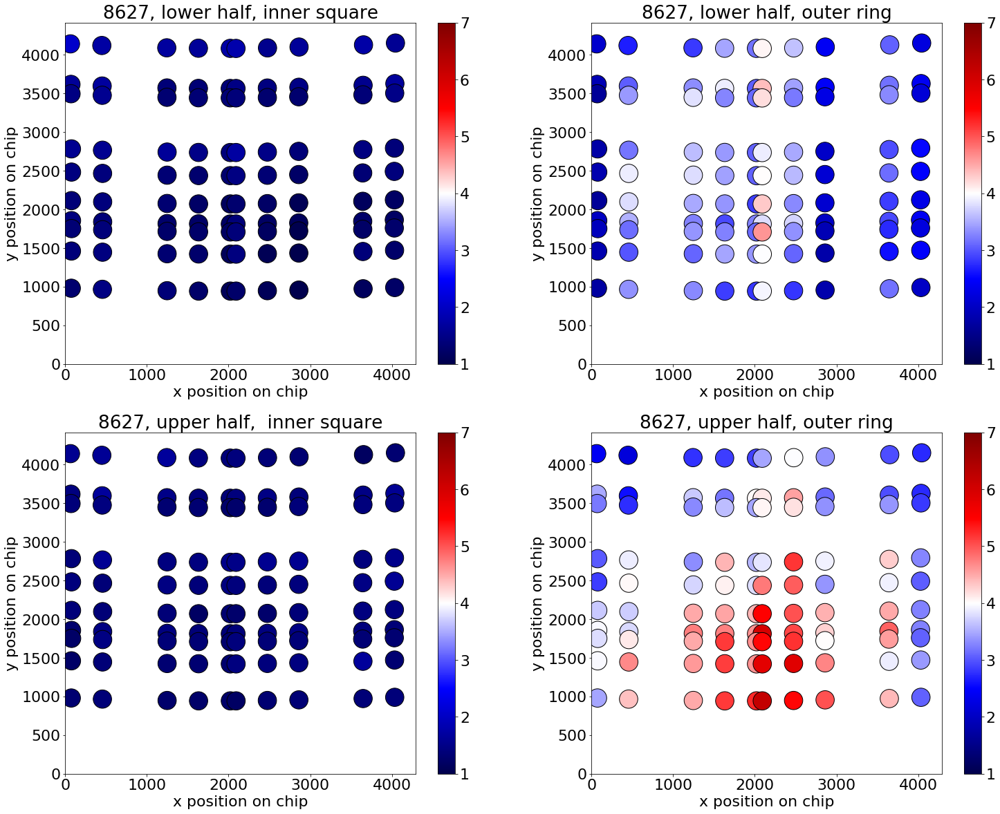

In [199]:
max_colors=7
min_colors=1

plt.figure(figsize=(25,20))
plt.subplot(221)
x=single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[3]].ravel()
y=4294-single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[4]].ravel()
values=res8627[:,1]
colors=values.ravel()
area = np.pi * (15 * 1)**2  # 0 to 15 point radii
plt.title('8627, lower half, inner square')


plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
plt.ylim(0,4416)
plt.xlim(0,4294)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.colorbar()


plt.subplot(222)
x=single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[3]].ravel()
y=4294-single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[4]].ravel()
values=res8627[:,0]
colors=values.ravel()
area = np.pi * (15 * 1)**2  # 0 to 15 point radii
plt.title('8627, lower half, outer ring')
plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
plt.ylim(0,4416)
plt.xlim(0,4294)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.colorbar()

plt.subplot(223)
x=single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[3]].ravel()
y=4294-single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[4]].ravel()
values=res8627[:,2]
colors=values.ravel()
area = np.pi * (15 * 1)**2  # 0 to 15 point radii
plt.title('8627, upper half,  inner square')


plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
plt.ylim(0,4416)
plt.xlim(0,4294)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.colorbar()

plt.subplot(224)
x=single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[3]].ravel()
y=4294-single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[4]].ravel()
values=res8627[:,3]
colors=values.ravel()
area = np.pi * (15 * 1)**2  # 0 to 15 point radii
plt.title('8627, upper half, outer ring')
plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
plt.ylim(0,4416)
plt.xlim(0,4294)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.colorbar()

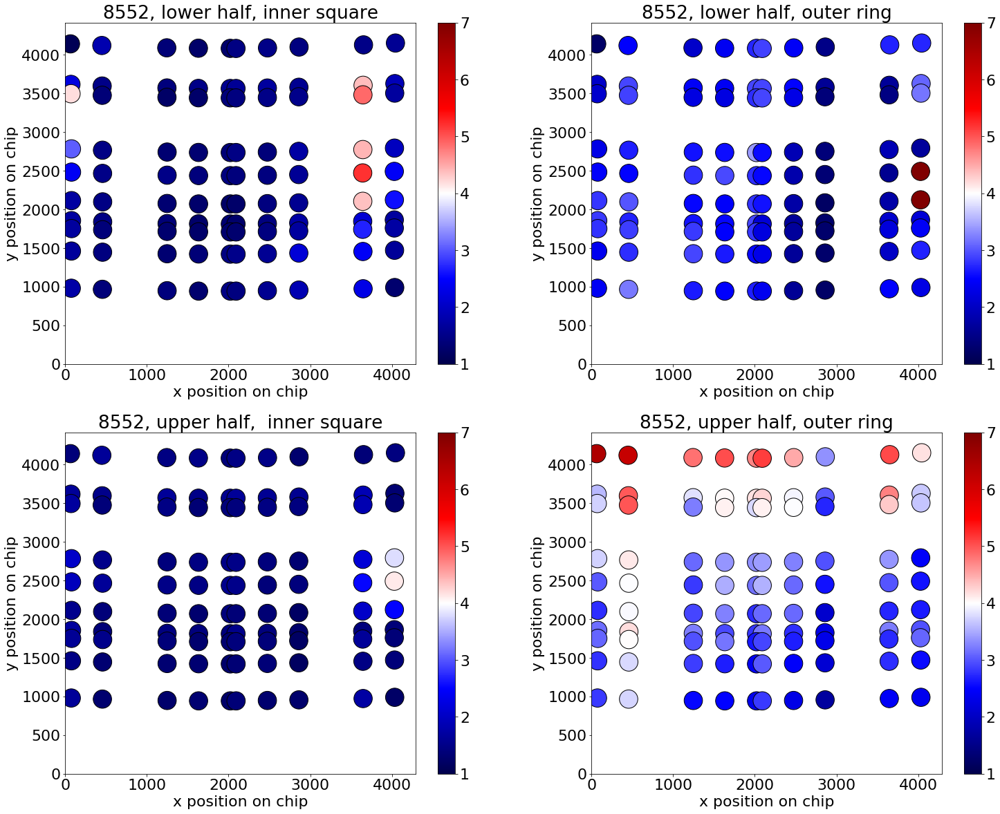

In [202]:
max_colors=7
min_colors=1

plt.figure(figsize=(25,20))
plt.subplot(221)
x=single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[3]].ravel()
y=4294-single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[4]].ravel()
values=res8552[:,1]
colors=values.ravel()
area = np.pi * (15 * 1)**2  # 0 to 15 point radii
plt.title('8552, lower half, inner square')


plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
plt.ylim(0,4416)
plt.xlim(0,4294)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')

plt.colorbar()


plt.subplot(222)
x=single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[3]].ravel()
y=4294-single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[4]].ravel()
values=res8552[:,0]
colors=values.ravel()
area = np.pi * (15 * 1)**2  # 0 to 15 point radii
plt.title('8552, lower half, outer ring')
plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
plt.ylim(0,4416)
plt.xlim(0,4294)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')

plt.colorbar()

plt.subplot(223)
x=single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[3]].ravel()
y=4294-single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[4]].ravel()
values=res8552[:,2]
colors=values.ravel()
area = np.pi * (15 * 1)**2  # 0 to 15 point radii
plt.title('8552, upper half,  inner square')


plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
plt.ylim(0,4416)
plt.xlim(0,4294)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')

plt.colorbar()

plt.subplot(224)
x=single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[3]].ravel()
y=4294-single_number_for_single_pos_full[single_number_for_single_pos_full_selection[:,0].astype(int)][:,[4]].ravel()
values=res8552[:,3]
colors=values.ravel()
area = np.pi * (15 * 1)**2  # 0 to 15 point radii
plt.title('8552, upper half, outer ring')
plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
plt.ylim(0,4416)
plt.xlim(0,4294)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')

plt.colorbar()

In [105]:
obs='8552'
single_number='82'
image_index=int(single_number)
eps=5
#date='Sep19'
#date='Sep28'
date='Oct5'


obs_possibilites=np.array([8552,8555,8558,8561,8564,8567,8570,8573,8603,8600,8606,8609,8612,8615,8618,8621,8624,8627])
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]

if obs=='8600':
    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned_Dithered.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked_Dithered.npy')
else:       
    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked.npy')

In [106]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()

(number of walkers, number of steps, number of parameters): (248, 100, 31)
minimal likelihood is: 11921.5290647
minimal chi2 reduced is: 6.61846969492


In [107]:
columns[15]

NameError: name 'columns' is not defined

In [108]:
minchain[1]=0
minchain[2]=0
minchain[3]=0
minchain[4]=0
minchain[5]=0
minchain[6]=0
minchain[7]=0
minchain[10]=0
minchain[11]=0
minchain[15]=0
minchain[16]=0
minchain[17]=0
minchain[18]=0
minchain[19]=0
minchain[20]=0.9
minchain[21]=0.0
minchain[22]=1
minchain[27]=0.4

In [109]:
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)

NameError: name 'columns' is not defined

In [239]:
# frd
res_pupililluminated=[]
res_optPsf_cut_fiber_convolved_downsampled=[]
for i in tqdm([0.0,0.01,0.02,0.03,0.04]):
    minchain[21]=i
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1)     
    model(minchain)

    pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
    optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    res_pupililluminated.append(pupililluminated)
    res_optPsf_cut_fiber_convolved_downsampled.append(optPsf_cut_fiber_convolved_downsampled)

100%|███████████████████████████████████████████████████████████| 5/5 [00:34<00:00,  6.94s/it]


[ 10.95930385  21.5050188 ]
[  9.58432644  22.86735495]
[ 38.20719544  48.77471001]
[ 36.84890146  50.13382763]
[ 1.37497741  1.36233615  1.35829399  1.35911763]


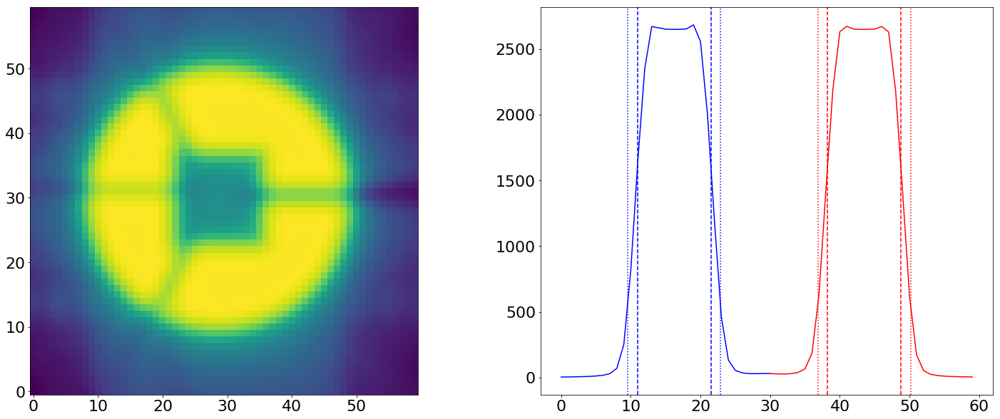

In [251]:
    sci_image=res_optPsf_cut_fiber_convolved_downsampled[0]
    res=[]
    for i in range(60):
        res.append(np.mean(sci_image[:,i]))
    res=np.array(res)
    mid_position_x=int(np.mean(argrelextrema(res, np.greater)[0][np.logical_and(np.array(argrelextrema(res, np.greater)[0]>10),np.array(argrelextrema(res, np.greater)[0]<50))]))

    
    mid_position=int(list(sci_image[:,mid_position_x]).index(sci_image[:,mid_position_x][sci_image[:,mid_position_x]<(np.max(sci_image[:,mid_position_x])*0.1)][int(len(sci_image[:,mid_position_x][sci_image[:,mid_position_x]<(np.max(sci_image[:,mid_position_x])*0.1)])/2)]))
    
    x=range(0,mid_position+1)
    y=sci_image[:,mid_position_x][0:mid_position+1]
    yreduced05b = np.array(y) - np.max(sci_image[:,mid_position_x][0:mid_position+1])*0.6
    yreduced01b = np.array(y) - np.max(sci_image[:,mid_position_x][0:mid_position+1])*0.2
    freduced05b =UnivariateSpline(x, yreduced05b, s=0)
    freduced01b =UnivariateSpline(x, yreduced01b, s=0)
    print(freduced05b.roots())
    print(freduced01b.roots())

    x=range(mid_position,60)
    y=sci_image[:,mid_position_x][mid_position:60]
    yreduced05t = np.array(y) - np.max(sci_image[:,mid_position_x][mid_position:60])*0.6
    yreduced01t = np.array(y) - np.max(sci_image[:,mid_position_x][mid_position:60])*0.2
    freduced05t =UnivariateSpline(x, yreduced05t, s=0)
    freduced01t =UnivariateSpline(x, yreduced01t, s=0)
    print(freduced05t.roots())
    print(freduced01t.roots())

    
    plt.figure(figsize=(25,10))

    plt.subplot(121)
    plt.imshow(sci_image,norm=LogNorm(),origin='lower')
    plt.subplot(122)
    plt.plot(range(0,mid_position+1),sci_image[:,mid_position_x][0:mid_position+1],color='b')
    plt.axvline(freduced05b.roots()[0],ls='--',color='b')
    plt.axvline(freduced05b.roots()[1],ls='--',color='b')
    plt.axvline(freduced01b.roots()[0],ls=':',color='b')
    plt.axvline(freduced01b.roots()[1],ls=':',color='b')
    plt.plot(range(mid_position,60),sci_image[:,mid_position_x][mid_position:60],color='r')
    plt.axvline(freduced05t.roots()[0],ls='--',color='r')
    plt.axvline(freduced05t.roots()[1],ls='--',color='r')
    plt.axvline(freduced01t.roots()[0],ls=':',color='r')
    plt.axvline(freduced01t.roots()[1],ls=':',color='r')
    
    print(np.concatenate((np.abs(freduced05b.roots()[-2:]-freduced01b.roots()[-2:]),np.abs(freduced05t.roots()[-2:]-freduced01t.roots()[-2:]))))

In [276]:
columns[15]

'radiometricExponent'

In [293]:
# y_fiber
res_pupililluminated=[]
res_optPsf_cut_fiber_convolved_downsampled=[]
for i in tqdm([0.0,0.4,0.7,0.9,1.4]):
    
    #frd sigma
    minchain[21]=0.08
    # y_fiber
    minchain[19]=0.2
    

   # y_ilum
    minchain[17]=0.2   
    # rad exponent
    minchain[15]=i
    
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1)     
    model(minchain)

    pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
    optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    res_pupililluminated.append(pupililluminated)
    res_optPsf_cut_fiber_convolved_downsampled.append(optPsf_cut_fiber_convolved_downsampled)

100%|███████████████████████████████████████████████████████████| 5/5 [00:41<00:00,  8.36s/it]


[ 16.83730381  22.03403094]
[ 14.2017327   23.40501073]
[ 38.02848319  44.55927241]
[ 36.61349014  47.71665073]
[ 2.6355711   1.3709798   1.41499305  3.15737832]


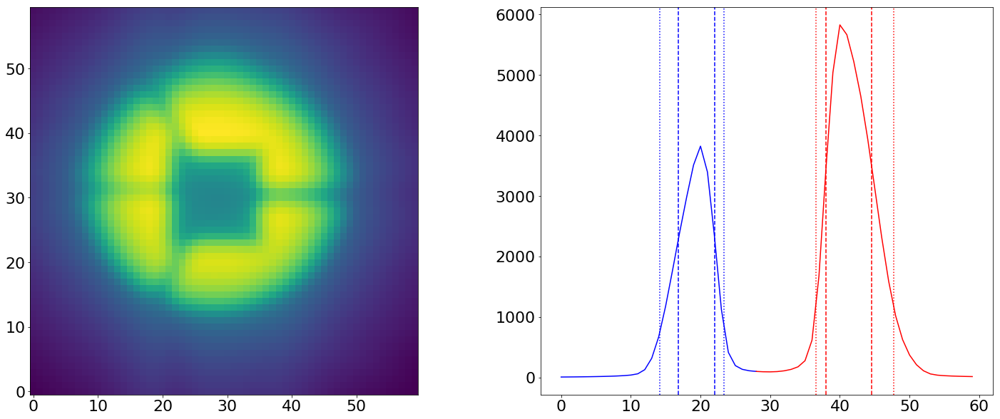

In [294]:
    sci_image=res_optPsf_cut_fiber_convolved_downsampled[1]

    
    res=[]
    for i in range(60):
        res.append(np.mean(sci_image[:,i]))
    res=np.array(res)
    mid_position_x=int(np.mean(argrelextrema(res, np.greater)[0][np.logical_and(np.array(argrelextrema(res, np.greater)[0]>10),np.array(argrelextrema(res, np.greater)[0]<50))]))

    
    mid_position=int(list(sci_image[:,mid_position_x]).index(sci_image[:,mid_position_x][sci_image[:,mid_position_x]<(np.max(sci_image[:,mid_position_x])*0.1)][int(len(sci_image[:,mid_position_x][sci_image[:,mid_position_x]<(np.max(sci_image[:,mid_position_x])*0.1)])/2)]))
    
    x=range(0,mid_position+1)
    y=sci_image[:,mid_position_x][0:mid_position+1]
    yreduced05b = np.array(y) - np.max(sci_image[:,mid_position_x][0:mid_position+1])*0.6
    yreduced01b = np.array(y) - np.max(sci_image[:,mid_position_x][0:mid_position+1])*0.2
    freduced05b =UnivariateSpline(x, yreduced05b, s=0)
    freduced01b =UnivariateSpline(x, yreduced01b, s=0)
    print(freduced05b.roots())
    print(freduced01b.roots())

    x=range(mid_position,60)
    y=sci_image[:,mid_position_x][mid_position:60]
    yreduced05t = np.array(y) - np.max(sci_image[:,mid_position_x][mid_position:60])*0.6
    yreduced01t = np.array(y) - np.max(sci_image[:,mid_position_x][mid_position:60])*0.2
    freduced05t =UnivariateSpline(x, yreduced05t, s=0)
    freduced01t =UnivariateSpline(x, yreduced01t, s=0)
    print(freduced05t.roots())
    print(freduced01t.roots())

    
    plt.figure(figsize=(25,10))

    plt.subplot(121)
    plt.imshow(sci_image,norm=LogNorm(),origin='lower')
    plt.subplot(122)
    plt.plot(range(0,mid_position+1),sci_image[:,mid_position_x][0:mid_position+1],color='b')
    plt.axvline(freduced05b.roots()[0],ls='--',color='b')
    plt.axvline(freduced05b.roots()[1],ls='--',color='b')
    plt.axvline(freduced01b.roots()[0],ls=':',color='b')
    plt.axvline(freduced01b.roots()[1],ls=':',color='b')
    plt.plot(range(mid_position,60),sci_image[:,mid_position_x][mid_position:60],color='r')
    plt.axvline(freduced05t.roots()[0],ls='--',color='r')
    plt.axvline(freduced05t.roots()[1],ls='--',color='r')
    plt.axvline(freduced01t.roots()[0],ls=':',color='r')
    plt.axvline(freduced01t.roots()[1],ls=':',color='r')
    
    print(np.concatenate((np.abs(freduced05b.roots()[-2:]-freduced01b.roots()[-2:]),np.abs(freduced05t.roots()[-2:]-freduced01t.roots()[-2:]))))

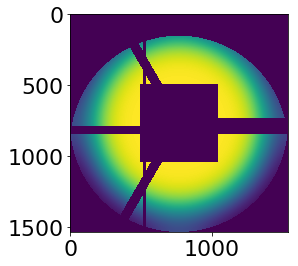

In [296]:
plt.imshow(res_pupililluminated[4])

-958352.96600903978

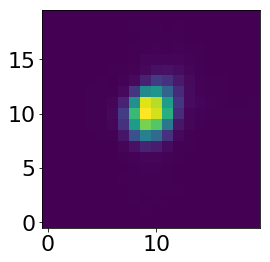

In [304]:
obs='8603'
i=0
single_number=str(i)
image_index=int(single_number)


sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned.npy')
var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked.npy')

plt.imshow(sci_image,origin='lower')
model = LN_PFS_single(sci_image,var_image,dithering=1,save=1)     


minchain[21]=0.02

model(minchain)

In [305]:
%timeit model(minchain)

555 ms ± 14.6 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


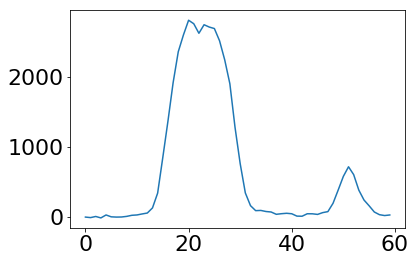

In [191]:
plt.plot(sci_image[:,mid_position_x])

In [193]:
[0,1,2][-2:]

[1, 2]

In [132]:
np.logical_and(np.array(argrelextrema(res, np.greater)[0]>10),np.array(argrelextrema(res, np.greater)[0]<50))

array([False, False, False,  True,  True], dtype=bool)

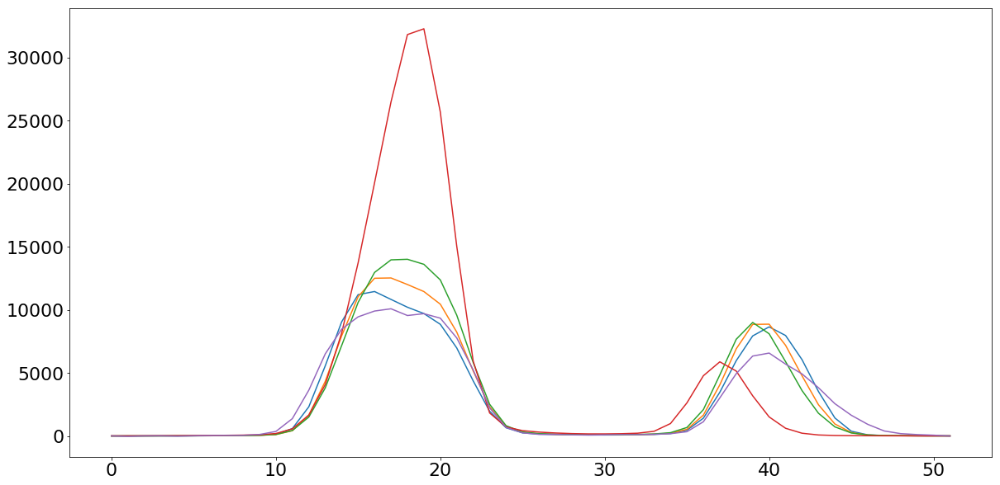

In [620]:
plt.figure(figsize=(20,10))
plt.plot(res_iapetus2[:,26])
plt.plot(res_iapetus4[:,26])
plt.plot(res_iapetus6[:,26])
plt.plot(res_iapetus8[:,26])
plt.plot(sci_image[:,26])


In [353]:
chain_Swarm1=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/Oct10/"+'chain'+str("Oct10")+'_Single_'+str("P")+'_'+str("8555")+str("56")+str("5")+'Swarm1.npy')
likechain_Swarm1=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/Oct10/"+'likechain'+str("Oct10")+'_Single_'+str("P")+'_'+str("8555")+str("56")+str("5")+'Swarm1.npy')

In [344]:
chain_Emcee2=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/Oct10/"+'chain'+str("Oct10")+'_Single_'+str("P")+'_'+str("8555")+str("56")+str("5")+'Emcee2.npy')
likechain_Emcee2=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/Oct10/"+'likechain'+str("Oct10")+'_Single_'+str("P")+'_'+str("8555")+str("56")+str("5")+'Emcee2.npy')

In [345]:
columns

['z4',
 'z5',
 'z6',
 'z7',
 'z8',
 'z9',
 'z10',
 'z11',
 'hscFrac',
 'strutFrac',
 'dxFocal',
 'dyFocal',
 'slitFrac',
 'slitFrac_dy',
 'radiometricEffect',
 'radiometricExponent',
 'x_ilum',
 'y_ilum',
 'x_fiber',
 'y_fiber',
 'effective_radius_illumination',
 'frd_sigma',
 'det_vert',
 'slitHolder_frac_dx',
 'grating_lines',
 'scattering_radius',
 'scattering_slope',
 'scattering_amplitude',
 'pixel_effect',
 'fiber_r',
 'flux']

In [245]:
columns[21]

'frd_sigma'

In [250]:
res=[]
for i in chain_Swarm1[:,:,21]:
    res.append(np.median(i))

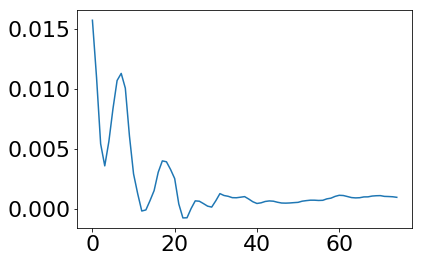

In [251]:
plt.plot(res)

In [253]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil_pre1.npy')        
pupil_first_cut=pupililluminated

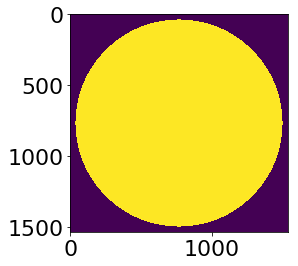

In [254]:
plt.imshow(pupil_first_cut)

In [257]:
from scipy.ndimage.filters import gaussian_filter

In [308]:
sigma=pupililluminated.shape[0]*0.0165
pupililluminated_gaussian=gaussian_filter(pupililluminated, sigma=sigma)
print(sigma)

25.344


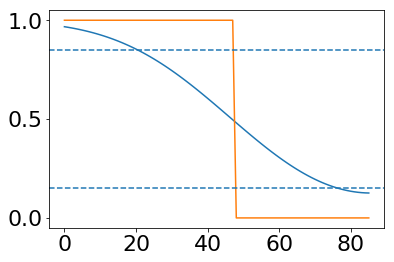

In [309]:
plt.plot(pupililluminated_gaussian[int(1536/2)][1450:1536])
plt.plot(pupililluminated[int(1536/2)][1450:1536])
plt.axhline(0.85,ls='--')
plt.axhline(0.15,ls='--')

In [310]:
# radius of my image
print(np.sum(pupililluminated[int(1536/2)][int(1536/2):1536]))
print(len(pupililluminated_gaussian[int(1536/2)][int(1536/2):1536][pupililluminated_gaussian[int(1536/2)][int(1536/2):1536]>0.85]))
print(len(pupililluminated_gaussian[int(1536/2)][int(1536/2):1536][pupililluminated_gaussian[int(1536/2)][int(1536/2):1536]>0.15]))
width=-len(pupililluminated_gaussian[int(1536/2)][int(1536/2):1536][pupililluminated_gaussian[int(1536/2)][int(1536/2):1536]>0.85])+len(pupililluminated_gaussian[int(1536/2)][int(1536/2):1536][pupililluminated_gaussian[int(1536/2)][int(1536/2):1536]>0.15])

730.0
703
759


In [311]:
width/730

0.07671232876712329

In [312]:
60/790

0.0759493670886076

In [313]:
6.8/0.0165

412.12121212121207

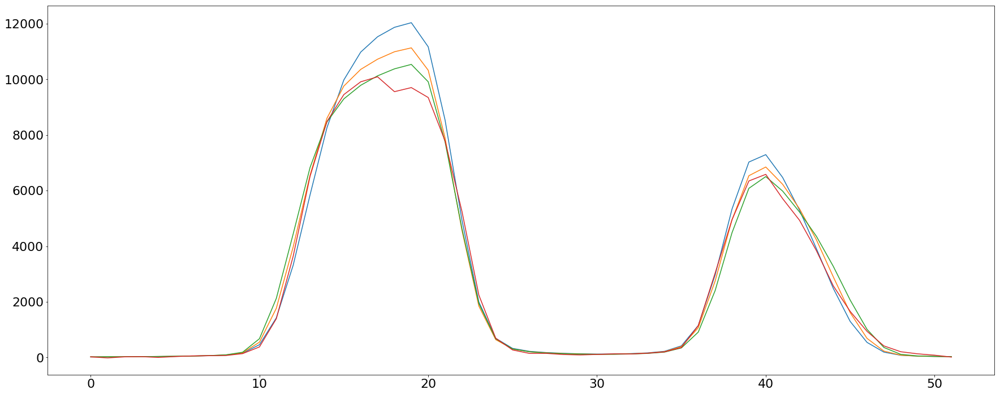

In [383]:
plt.figure(figsize=(30,12))
plt.plot(res_iapetus6[:,26])
plt.plot(res_iapetus4[:,26])
plt.plot(res_iapetus2[:,26])
plt.plot(sci_image[:,26])

In [751]:
minchain[1]=0
minchain[2]=0
minchain[3]=0
minchain[4]=0
minchain[5]=0
minchain[6]=0
minchain[7]=0
minchain[8]=0.3

minchain[13]=0
minchain[14]=0

minchain[10]=0
minchain[11]=0

minchain[15]=0
minchain[18]=0
minchain[19]=0
minchain[20]=0.6
minchain[28]=0.02
minchain[27]=0.0001
minchain[21]=0.08


In [752]:
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)

          z4   z5   z6   z7   z8   z9  z10  z11
0  24.642364  0.0  0.0  0.0  0.0  0.0  0.0  0.0
   hscFrac  strutFrac  dxFocal  dyFocal  slitFrac  slitFrac_dy  \
0      0.3   0.082237      0.0      0.0  0.056459          0.0   

   radiometricEffect  radiometricExponent   x_ilum    y_ilum  
0                0.0                  0.0 -0.00334 -0.012155  
   x_fiber  y_fiber  effective_radius_illumination  frd_sigma  det_vert  \
0      0.0      0.0                            0.6       0.08  1.027633   

   slitHolder_frac_dx  grating_lines  scattering_radius  scattering_slope  \
0            -0.22374    62074.51635          15.903933          2.196222   

   scattering_amplitude  pixel_effect   fiber_r      flux  
0                0.0001          0.02  1.893951  0.987647  


In [753]:
if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1)   
    
model(minchain)
#model(allparameters_proposal)

106.4


-23224065.358351942

In [754]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')
aperilluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'aperilluminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')

wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy')          

optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')

optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled

In [755]:
pupililluminated8=pupililluminated
res_iapetus8=res_iapetus

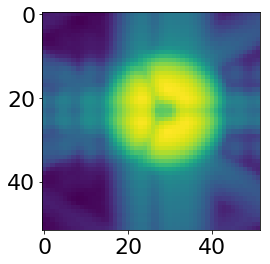

In [756]:
plt.imshow(res_iapetus8,norm=LogNorm())

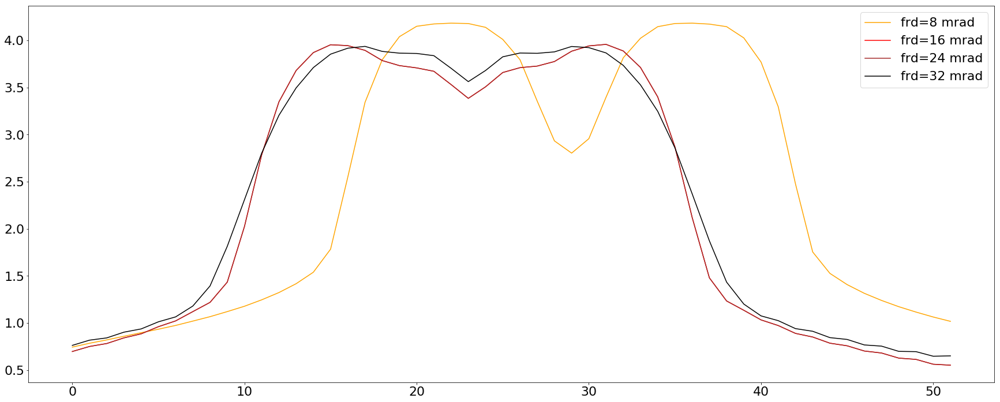

In [760]:
plt.figure(figsize=(30,12))
plt.plot(np.log10(res_iapetus2[:,26]),color='orange',label='frd=8 mrad')
plt.plot(np.log10(res_iapetus4[:,26]),color='red',label='frd=16 mrad')
plt.plot(np.log10(res_iapetus6[:,26]),color='brown',label='frd=24 mrad')
plt.plot(np.log10(res_iapetus8[:,26]),color='black',label='frd=32 mrad')
plt.legend()

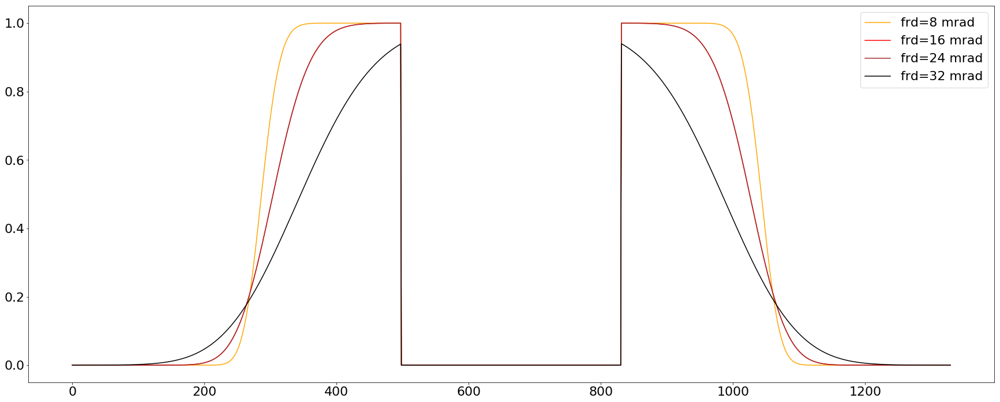

In [759]:
plt.figure(figsize=(30,12))
plt.plot(pupililluminated2[:,600],color='orange',label='frd=8 mrad')
plt.plot(pupililluminated4[:,600],color='red',label='frd=16 mrad')
plt.plot(pupililluminated6[:,600],color='brown',label='frd=24 mrad')
plt.plot(pupililluminated8[:,600],color='black',label='frd=32 mrad')
plt.legend()

# FRD experiment

In [1474]:
columns[20]

'effective_radius_illumination'

## Center of detector

In [2213]:
obs='8603'
single_number='55'
image_index=int(single_number)
eps=6
#date='Sep27'
date='Oct10'

obs_possibilites=np.array([8552,8555,8558,8561,8564,8567,8570,8573,8603,8600,8606,8609,8612,8615,8618,8621,8624,8627])
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]

if obs=='8600':
    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned_Dithered.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked_Dithered.npy')
else:       
    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked.npy')

In [2214]:
import pickle
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Oct122018/' + 'results_of_fit_many_interpolation.pkl', 'rb') as f:
    results_of_fit_many_interpolation=pickle.load(f)

allparameters_proposal=results_of_fit_many_interpolation[labelInput].loc[int(single_number)].values[:len(columns)]

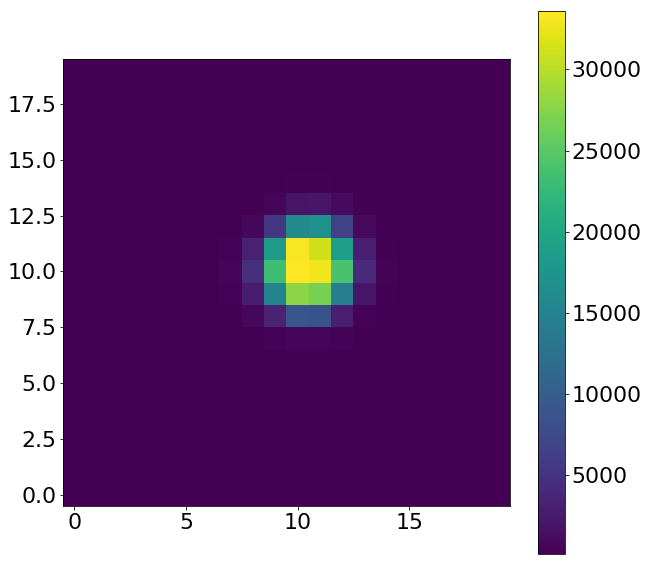

In [2215]:
plt.figure(figsize=(10,10))
plt.imshow(sci_image,origin='lower',vmin=100)
plt.colorbar()

In [2216]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()

(number of walkers, number of steps, number of parameters): (248, 75, 31)
minimal likelihood is: 813.387200036
minimal chi2 reduced is: 4.0303905045


In [2217]:
if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1)   
    
model(minchain)
#model(allparameters_proposal)

[    3.             7.             2.             2.          3351.12948755]


-12867.213556972776

In [2218]:
minchain[18]=0
minchain[19]=0
#minchain[27]=0.0001
minchain[20]=0.9
print(columns[21])

#minchain[21]=0.04
#minchain[21]=0.08
#minchain[21]=0.12
#minchain[21]=0.16
minchain[21]=0.195
#minchain[21]=0.24



pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

frd_sigma


In [2219]:
if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1)   
  
list_of_pupililluminated=[]
list_of_res_iapetus=[]

for sigma in tqdm([0.042,0.062,0.084,0.104,0.124]):
    #minchain[14]=0
    minchain[20]=0.9
    minchain[21]=sigma
    minchain[24]=60000
    model(minchain)

    pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

    optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    res_iapetus=optPsf_cut_fiber_convolved_downsampled
    
    list_of_pupililluminated.append(pupililluminated)
    list_of_res_iapetus.append(res_iapetus)







  0%|                                                                   | 0/5 [00:00<?, ?it/s]





 20%|███████████▊                                               | 1/5 [00:00<00:02,  1.42it/s]

[    3.            8.            2.            2.         3944.5533054]








 40%|███████████████████████▌                                   | 2/5 [00:01<00:02,  1.43it/s]

[    3.             7.             2.             2.          4154.70601612]








 60%|███████████████████████████████████▍                       | 3/5 [00:02<00:01,  1.43it/s]

[    3.            7.            2.            2.         3995.1410415]








 80%|███████████████████████████████████████████████▏           | 4/5 [00:02<00:00,  1.44it/s]

[    3.            7.            2.            2.         4046.1683641]








100%|███████████████████████████████████████████████████████████| 5/5 [00:03<00:00,  1.44it/s]







[    3.             7.             2.             2.          4235.58368404]


In [2220]:
pupililluminated0=list_of_pupililluminated[0]
res_iapetus0=list_of_res_iapetus[0]

pupililluminated1=list_of_pupililluminated[1]
res_iapetus1=list_of_res_iapetus[1]

pupililluminated2=list_of_pupililluminated[2]
res_iapetus2=list_of_res_iapetus[2]

pupililluminated3=list_of_pupililluminated[3]
res_iapetus3=list_of_res_iapetus[3]

pupililluminated4=list_of_pupililluminated[4]
res_iapetus4=list_of_res_iapetus[4]


In [2221]:
res=[]
for pupililluminated in list_of_pupililluminated:

    res85=np.array(range(512))[(pupililluminated[256]<0.86) & (pupililluminated[256]>0.84)]
    res85=res85[res85>256]

    res50=np.array(range(512))[(pupililluminated[256]<0.52) & (pupililluminated[256]>0.48)]
    res50=res50[res50>np.mean(res85)]
    res.append(np.mean(((-np.mean(res85)+np.mean(res50))*2/2.07289)*0.196/res50))
    
res

[0.0060374387123086886,
 0.0089587800247161176,
 0.01208734718934421,
 0.015191039272797118,
 0.018112392979104261]

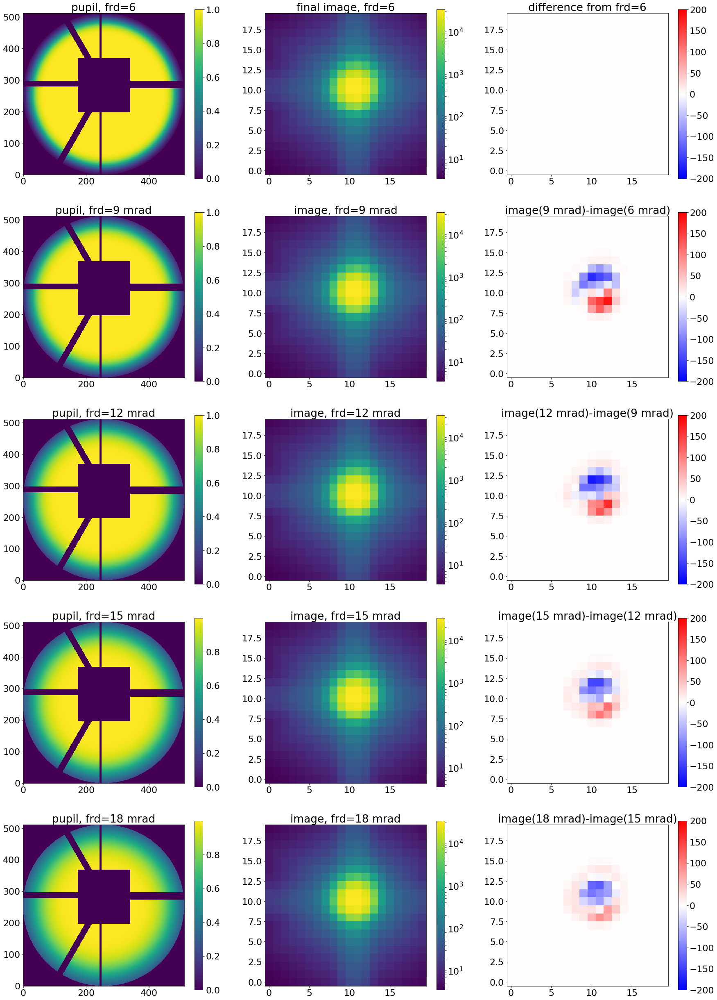

In [2222]:
plt.figure(figsize=(30,44))
plt.subplot(531)
plt.imshow(pupililluminated0,origin='lower')
plt.title('pupil, frd=6')
plt.colorbar()
plt.subplot(532)
plt.imshow(res_iapetus0,origin='lower',norm=LogNorm())
plt.title('final image, frd=6')
plt.colorbar()
plt.subplot(533)
plt.imshow(res_iapetus0-res_iapetus0,origin='lower',cmap='bwr',vmax=200,vmin=-200)
plt.title('difference from frd=6')
plt.colorbar()

plt.subplot(534)
plt.imshow(pupililluminated1,origin='lower')
plt.title('pupil, frd=9 mrad')
plt.colorbar()
plt.subplot(535)
plt.imshow(res_iapetus1,origin='lower',norm=LogNorm())
plt.title('image, frd=9 mrad')
plt.colorbar()
plt.subplot(536)
plt.imshow(res_iapetus1-res_iapetus0,origin='lower',cmap='bwr',vmax=200,vmin=-200)
plt.title('image(9 mrad)-image(6 mrad)')
plt.colorbar()

plt.subplot(537)
plt.imshow(pupililluminated2,origin='lower')
plt.title('pupil, frd=12 mrad')
plt.colorbar()
plt.subplot(538)
plt.imshow(res_iapetus2,origin='lower',norm=LogNorm())
plt.title('image, frd=12 mrad')
plt.colorbar()
plt.subplot(539)
plt.imshow(res_iapetus2-res_iapetus1,origin='lower',cmap='bwr',vmax=200,vmin=-200)
plt.title('image(12 mrad)-image(9 mrad)')
plt.colorbar()

plt.subplot(5,3,10)
plt.imshow(pupililluminated3,origin='lower')
plt.title('pupil, frd=15 mrad')
plt.colorbar()
plt.subplot(5,3,11)
plt.imshow(res_iapetus3,origin='lower',norm=LogNorm())
plt.title('image, frd=15 mrad')
plt.colorbar()
plt.subplot(5,3,12)
plt.imshow(res_iapetus3-res_iapetus2,origin='lower',cmap='bwr',vmax=200,vmin=-200)
plt.title('image(15 mrad)-image(12 mrad)')
plt.colorbar()

plt.subplot(5,3,13)
plt.imshow(pupililluminated4,origin='lower')
plt.title('pupil, frd=18 mrad')
plt.colorbar()
plt.subplot(5,3,14)
plt.imshow(res_iapetus4,origin='lower',norm=LogNorm())
plt.title('image, frd=18 mrad')
plt.colorbar()
plt.subplot(5,3,15)
plt.imshow(res_iapetus4-res_iapetus3,origin='lower',cmap='bwr',vmax=200,vmin=-200)
plt.title('image(18 mrad)-image(15 mrad)')
plt.colorbar()

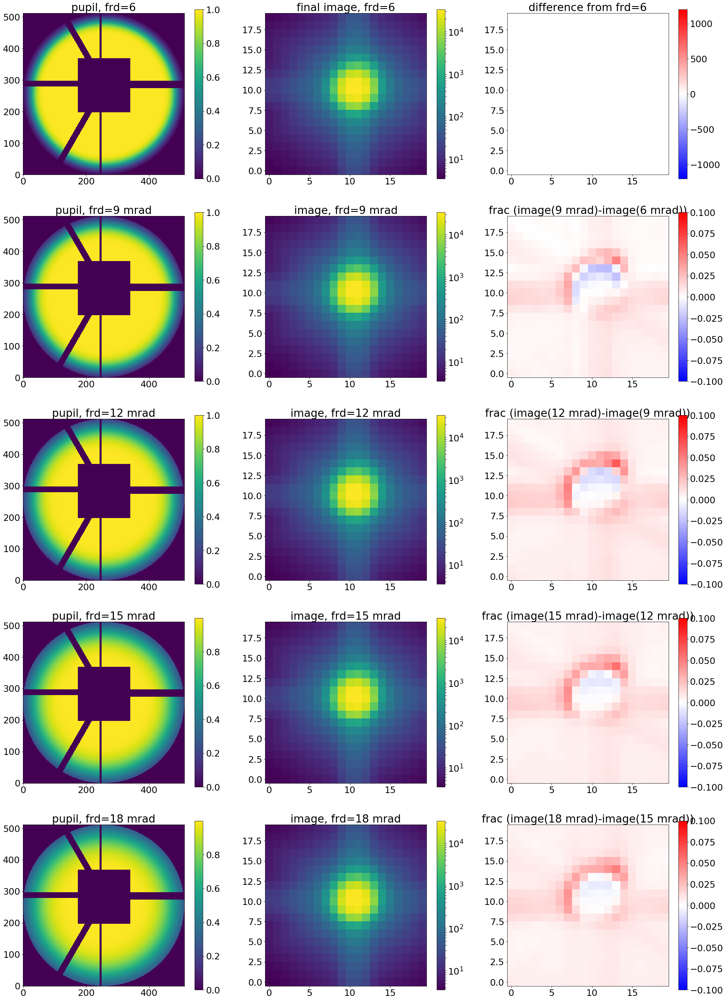

In [2223]:
plt.figure(figsize=(30,44))
plt.subplot(531)
plt.imshow(pupililluminated0,origin='lower')
plt.title('pupil, frd=6')
plt.colorbar()
plt.subplot(532)
plt.imshow(res_iapetus0,origin='lower',norm=LogNorm())
plt.title('final image, frd=6')
plt.colorbar()
plt.subplot(533)
plt.imshow(res_iapetus0-res_iapetus0,origin='lower',cmap='bwr',vmax=1200,vmin=-1200)
plt.title('difference from frd=6')
plt.colorbar()

plt.subplot(534)
plt.imshow(pupililluminated1,origin='lower')
plt.title('pupil, frd=9 mrad')
plt.colorbar()
plt.subplot(535)
plt.imshow(res_iapetus1,origin='lower',norm=LogNorm())
plt.title('image, frd=9 mrad')
plt.colorbar()
plt.subplot(536)
plt.imshow((res_iapetus1-res_iapetus0)/res_iapetus0,origin='lower',cmap='bwr',vmax=0.1,vmin=-0.1)
plt.title('frac (image(9 mrad)-image(6 mrad))')
plt.colorbar()

plt.subplot(537)
plt.imshow(pupililluminated2,origin='lower')
plt.title('pupil, frd=12 mrad')
plt.colorbar()
plt.subplot(538)
plt.imshow(res_iapetus2,origin='lower',norm=LogNorm())
plt.title('image, frd=12 mrad')
plt.colorbar()
plt.subplot(539)
plt.imshow((res_iapetus2-res_iapetus1)/res_iapetus1,origin='lower',cmap='bwr',vmax=0.1,vmin=-0.1)
plt.title('frac (image(12 mrad)-image(9 mrad))')
plt.colorbar()

plt.subplot(5,3,10)
plt.imshow(pupililluminated3,origin='lower')
plt.title('pupil, frd=15 mrad')
plt.colorbar()
plt.subplot(5,3,11)
plt.imshow(res_iapetus3,origin='lower',norm=LogNorm())
plt.title('image, frd=15 mrad')
plt.colorbar()
plt.subplot(5,3,12)
plt.imshow((res_iapetus3-res_iapetus2)/res_iapetus2,origin='lower',cmap='bwr',vmax=0.1,vmin=-0.1)
plt.title('frac (image(15 mrad)-image(12 mrad))')
plt.colorbar()

plt.subplot(5,3,13)
plt.imshow(pupililluminated4,origin='lower')
plt.title('pupil, frd=18 mrad')
plt.colorbar()
plt.subplot(5,3,14)
plt.imshow(res_iapetus4,origin='lower',norm=LogNorm())
plt.title('image, frd=18 mrad')
plt.colorbar()
plt.subplot(5,3,15)
plt.imshow((res_iapetus4-res_iapetus3)/res_iapetus3,origin='lower',cmap='bwr',vmax=0.1,vmin=-0.1)
plt.title('frac (image(18 mrad)-image(15 mrad))')
plt.colorbar()

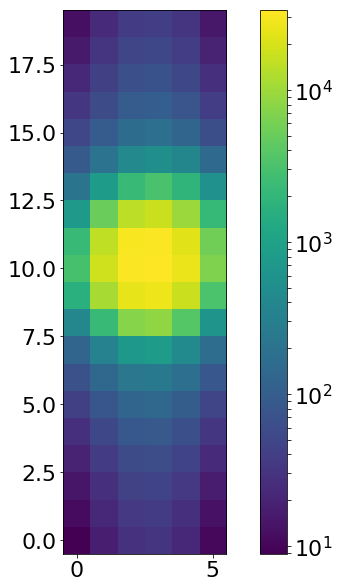

In [2224]:
plt.imshow(res_iapetus0[:,8:14],origin='lower',norm=LogNorm())
plt.colorbar()

In [2225]:
np.max(np.sum(res_iapetus0[:,8:14],axis=1))

120494.58087710492

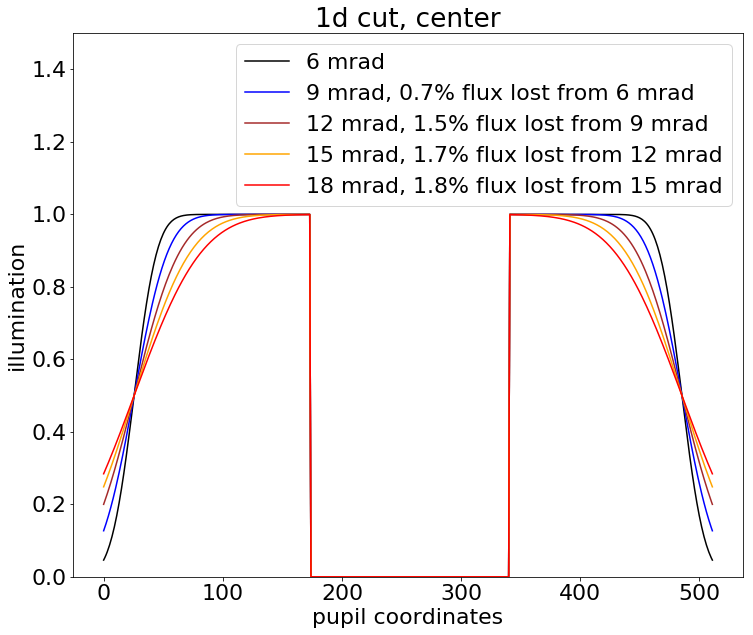

In [2226]:
plt.plot(pupililluminated0[256],color='black',label='6 mrad')
plt.plot(pupililluminated1[256],color='blue',label='9 mrad, '+"{:1.1f}".format((((1-(np.sum(pupililluminated1)/np.sum(pupililluminated0)))*100)))+'% flux lost from 6 mrad')
plt.plot(pupililluminated2[256],color='brown',label='12 mrad, '+"{:1.1f}".format((((1-(np.sum(pupililluminated2)/np.sum(pupililluminated1)))*100)))+'% flux lost from 9 mrad')
plt.plot(pupililluminated3[256],color='orange',label='15 mrad, '+"{:1.1f}".format((((1-(np.sum(pupililluminated3)/np.sum(pupililluminated2)))*100)))+'% flux lost from 12 mrad')
plt.plot(pupililluminated4[256],color='red',label='18 mrad, '+"{:1.1f}".format((((1-(np.sum(pupililluminated4)/np.sum(pupililluminated3)))*100)))+'% flux lost from 15 mrad')
plt.ylabel('illumination')
plt.xlabel('pupil coordinates')
plt.title('1d cut, center')
plt.ylim(0,1.5)
plt.legend()

In [2227]:
list_of_sums=np.sum(res_iapetus0[:,8:14],axis=1)

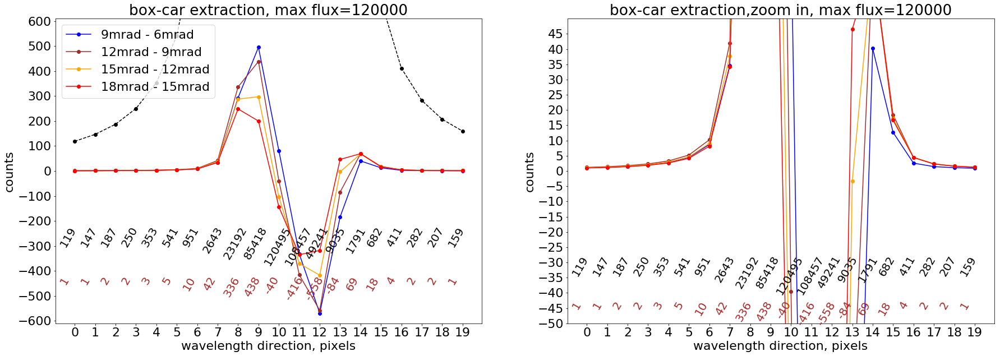

In [2229]:
plt.figure(figsize=(30,10))
plt.subplot(121)

plt.plot(np.sum(res_iapetus1[:,8:14],axis=1)-np.sum(res_iapetus0[:,8:14],axis=1),marker='o',color='blue',label='9mrad - 6mrad')
plt.plot(np.sum(res_iapetus2[:,8:14],axis=1)-np.sum(res_iapetus1[:,8:14],axis=1),marker='o',color='brown',label='12mrad - 9mrad')
plt.plot(np.sum(res_iapetus3[:,8:14],axis=1)-np.sum(res_iapetus2[:,8:14],axis=1),marker='o',color='orange',label='15mrad - 12mrad')
plt.plot(np.sum(res_iapetus4[:,8:14],axis=1)-np.sum(res_iapetus3[:,8:14],axis=1),marker='o',color='red',label='18mrad - 15mrad')
plt.plot(np.sum(res_iapetus0[:,8:14],axis=1),marker='o',color='black',ls='--')
#plt.plot(np.sum(sci_image[:,8:14],axis=1),marker='o',color='black',ls=':')
plt.ylabel("counts")
plt.xlabel("wavelength direction, pixels")
plt.title("box-car extraction, max flux=120000")
plt.xticks(np.arange(0, 20, step=1))
plt.yticks(np.arange(-600,700, step=100))
plt.ylim(-610,610)
plt.legend(loc=2)
for i in range(20):
    plt.text(-0.8+i, -250, str("{:1.0f}".format(list_of_sums[i])), fontsize=20,rotation=60.)
    
for i in range(20):
    plt.text(-0.8+i, -450, str("{:1.0f}".format(np.sum(res_iapetus2[:,8:14],axis=1)[i]-np.sum(res_iapetus1[:,8:14],axis=1)[i])), fontsize=20,rotation=60.,color='brown')


plt.subplot(122)

plt.plot(np.sum(res_iapetus1[:,8:14],axis=1)-np.sum(res_iapetus0[:,8:14],axis=1),marker='o',color='blue')
plt.plot(np.sum(res_iapetus2[:,8:14],axis=1)-np.sum(res_iapetus1[:,8:14],axis=1),marker='o',color='brown')
plt.plot(np.sum(res_iapetus3[:,8:14],axis=1)-np.sum(res_iapetus2[:,8:14],axis=1),marker='o',color='orange')
plt.plot(np.sum(res_iapetus4[:,8:14],axis=1)-np.sum(res_iapetus3[:,8:14],axis=1),marker='o',color='red')
plt.plot(np.sum(res_iapetus0[:,8:14],axis=1),marker='o',color='black',ls='--')
plt.ylabel("counts")
plt.xlabel("wavelength direction, pixels")
plt.title("box-car extraction,zoom in, max flux=120000")
plt.xticks(np.arange(0, 20, step=1))
plt.yticks(np.arange(-50,50, step=5))
plt.ylim(-50,50)

for i in range(20):
    plt.text(-0.8+i, -30, str("{:1.0f}".format(list_of_sums[i])), fontsize=20,rotation=60.)
    
for i in range(20):
    plt.text(-0.8+i, -45, str("{:1.0f}".format(np.sum(res_iapetus2[:,8:14],axis=1)[i]-np.sum(res_iapetus1[:,8:14],axis=1)[i])), fontsize=20,rotation=60.,color='brown')

## edge 

In [2230]:
obs='8603'
single_number='1'
image_index=int(single_number)
eps=6
#date='Sep27'
date='Oct10'

obs_possibilites=np.array([8552,8555,8558,8561,8564,8567,8570,8573,8603,8600,8606,8609,8612,8615,8618,8621,8624,8627])
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]

if obs=='8600':
    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned_Dithered.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked_Dithered.npy')
else:       
    sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned.npy')
    var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked.npy')

In [2231]:
import pickle
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Oct122018/' + 'results_of_fit_many_interpolation.pkl', 'rb') as f:
    results_of_fit_many_interpolation=pickle.load(f)

allparameters_proposal=results_of_fit_many_interpolation[labelInput].loc[int(single_number)].values[:len(columns)]

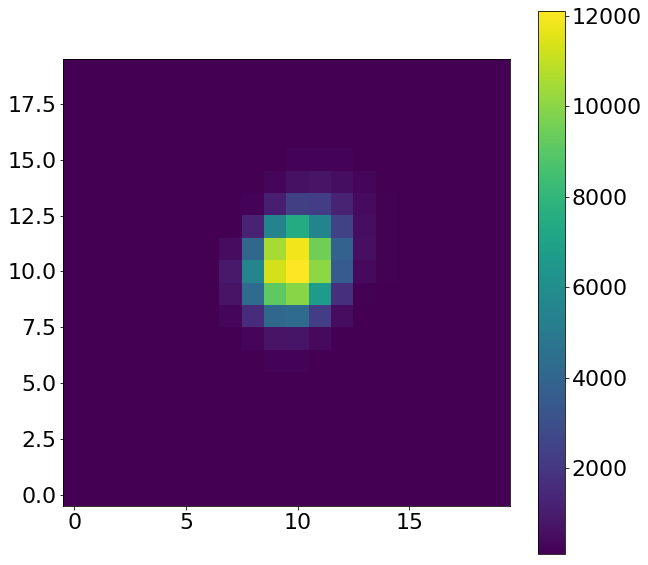

In [2232]:
plt.figure(figsize=(10,10))
plt.imshow(sci_image,origin='lower',vmin=100)
plt.colorbar()

In [2233]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()

(number of walkers, number of steps, number of parameters): (248, 75, 31)
minimal likelihood is: 942.731212608
minimal chi2 reduced is: 4.67899766858


In [2234]:
if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1)   
    
model(minchain)
#model(allparameters_proposal)

[    1.             8.             3.             2.          2497.44282049]


-1255.6531050740564

In [2235]:
minchain[18]=0
minchain[19]=0
#minchain[27]=0.0001
minchain[20]=0.9
print(columns[21])

#minchain[21]=0.04
#minchain[21]=0.08
#minchain[21]=0.12
#minchain[21]=0.16
minchain[21]=0.195
#minchain[21]=0.24



pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

frd_sigma


In [2247]:
    minchain[24]

54326.717725381866

In [2258]:
if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1)   
  
list_of_pupililluminated=[]
list_of_res_iapetus=[]

for sigma in tqdm([0.042,0.062,0.084,0.104,0.124]):
    minchain[14]=0
    minchain[20]=0.903
    minchain[21]=sigma
    minchain[24]=30000
    model(minchain)

    pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

    optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    res_iapetus=optPsf_cut_fiber_convolved_downsampled
    
    list_of_pupililluminated.append(pupililluminated)
    list_of_res_iapetus.append(res_iapetus)







  0%|                                                                   | 0/5 [00:00<?, ?it/s]





 20%|███████████▊                                               | 1/5 [00:00<00:02,  1.35it/s]

[    1.             8.             3.             2.          3898.53292508]








 40%|███████████████████████▌                                   | 2/5 [00:01<00:02,  1.38it/s]

[    0.             8.             3.             2.          3660.87205039]








 60%|███████████████████████████████████▍                       | 3/5 [00:02<00:01,  1.43it/s]

[    0.             8.             3.             2.          3427.71654936]








 80%|███████████████████████████████████████████████▏           | 4/5 [00:02<00:00,  1.44it/s]

[    0.             8.             3.             2.          3298.28968544]








100%|███████████████████████████████████████████████████████████| 5/5 [00:03<00:00,  1.45it/s]







[    0.             8.             3.             2.          3232.98653983]


In [2259]:
pupililluminated0=list_of_pupililluminated[0]
res_iapetus0=list_of_res_iapetus[0]

pupililluminated1=list_of_pupililluminated[1]
res_iapetus1=list_of_res_iapetus[1]

pupililluminated2=list_of_pupililluminated[2]
res_iapetus2=list_of_res_iapetus[2]

pupililluminated3=list_of_pupililluminated[3]
res_iapetus3=list_of_res_iapetus[3]

pupililluminated4=list_of_pupililluminated[4]
res_iapetus4=list_of_res_iapetus[4]


In [2260]:
res=[]
for pupililluminated in list_of_pupililluminated:

    res85=np.array(range(512))[(pupililluminated[256]<0.86) & (pupililluminated[256]>0.84)]
    res85=res85[res85>256]

    res50=np.array(range(512))[(pupililluminated[256]<0.52) & (pupililluminated[256]>0.48)]
    res50=res50[res50>np.mean(res85)]
    res.append(np.mean(((-np.mean(res85)+np.mean(res50))*2/2.07289)*0.196/res50))
    
res

[0.0060312209587429742,
 0.0091347209930540824,
 0.012062475964048936,
 0.015354170371810543,
 0.018093816087319171]

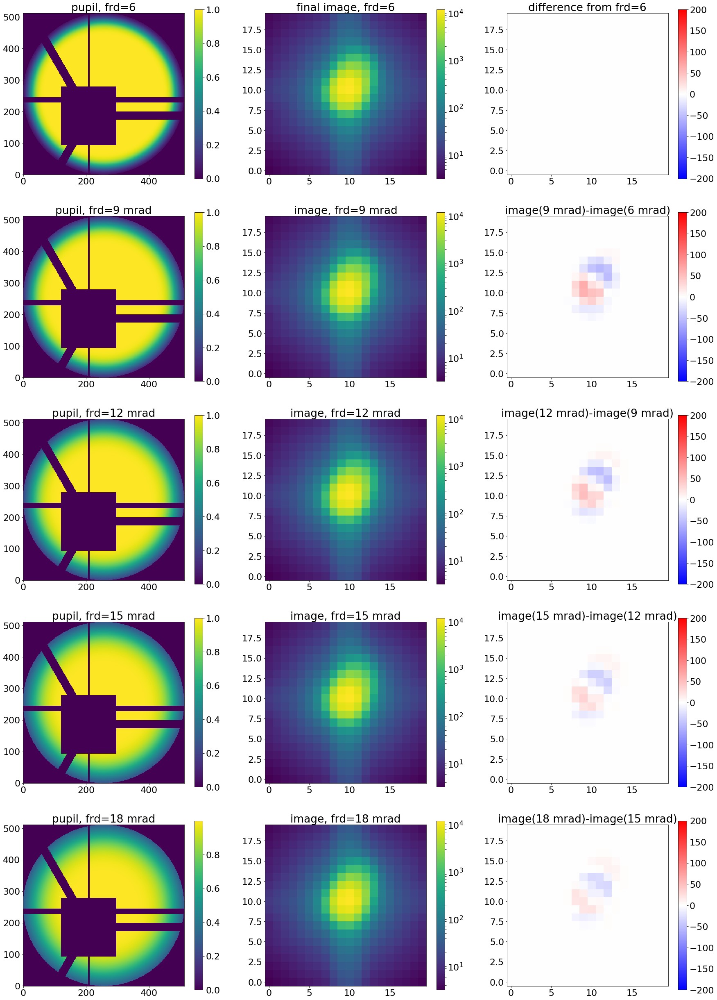

In [2261]:
plt.figure(figsize=(30,44))
plt.subplot(531)
plt.imshow(pupililluminated0,origin='lower')
plt.title('pupil, frd=6')
plt.colorbar()
plt.subplot(532)
plt.imshow(res_iapetus0,origin='lower',norm=LogNorm())
plt.title('final image, frd=6')
plt.colorbar()
plt.subplot(533)
plt.imshow(res_iapetus0-res_iapetus0,origin='lower',cmap='bwr',vmax=200,vmin=-200)
plt.title('difference from frd=6')
plt.colorbar()

plt.subplot(534)
plt.imshow(pupililluminated1,origin='lower')
plt.title('pupil, frd=9 mrad')
plt.colorbar()
plt.subplot(535)
plt.imshow(res_iapetus1,origin='lower',norm=LogNorm())
plt.title('image, frd=9 mrad')
plt.colorbar()
plt.subplot(536)
plt.imshow(res_iapetus1-res_iapetus0,origin='lower',cmap='bwr',vmax=200,vmin=-200)
plt.title('image(9 mrad)-image(6 mrad)')
plt.colorbar()

plt.subplot(537)
plt.imshow(pupililluminated2,origin='lower')
plt.title('pupil, frd=12 mrad')
plt.colorbar()
plt.subplot(538)
plt.imshow(res_iapetus2,origin='lower',norm=LogNorm())
plt.title('image, frd=12 mrad')
plt.colorbar()
plt.subplot(539)
plt.imshow(res_iapetus2-res_iapetus1,origin='lower',cmap='bwr',vmax=200,vmin=-200)
plt.title('image(12 mrad)-image(9 mrad)')
plt.colorbar()

plt.subplot(5,3,10)
plt.imshow(pupililluminated3,origin='lower')
plt.title('pupil, frd=15 mrad')
plt.colorbar()
plt.subplot(5,3,11)
plt.imshow(res_iapetus3,origin='lower',norm=LogNorm())
plt.title('image, frd=15 mrad')
plt.colorbar()
plt.subplot(5,3,12)
plt.imshow(res_iapetus3-res_iapetus2,origin='lower',cmap='bwr',vmax=200,vmin=-200)
plt.title('image(15 mrad)-image(12 mrad)')
plt.colorbar()

plt.subplot(5,3,13)
plt.imshow(pupililluminated4,origin='lower')
plt.title('pupil, frd=18 mrad')
plt.colorbar()
plt.subplot(5,3,14)
plt.imshow(res_iapetus4,origin='lower',norm=LogNorm())
plt.title('image, frd=18 mrad')
plt.colorbar()
plt.subplot(5,3,15)
plt.imshow(res_iapetus4-res_iapetus3,origin='lower',cmap='bwr',vmax=200,vmin=-200)
plt.title('image(18 mrad)-image(15 mrad)')
plt.colorbar()

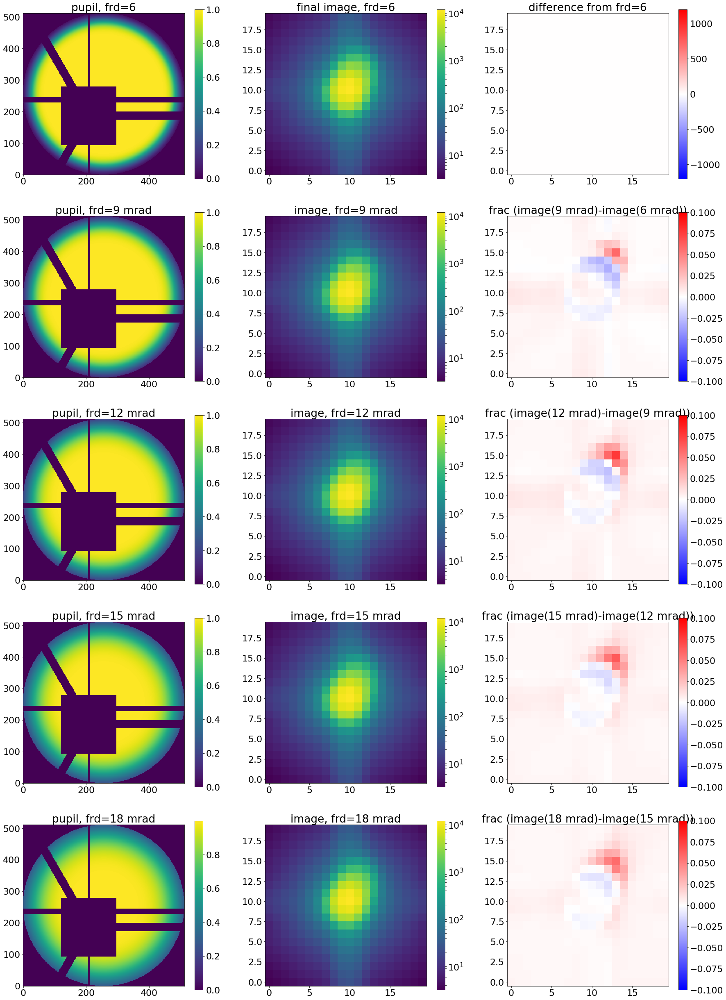

In [2262]:
plt.figure(figsize=(30,44))
plt.subplot(531)
plt.imshow(pupililluminated0,origin='lower')
plt.title('pupil, frd=6')
plt.colorbar()
plt.subplot(532)
plt.imshow(res_iapetus0,origin='lower',norm=LogNorm())
plt.title('final image, frd=6')
plt.colorbar()
plt.subplot(533)
plt.imshow(res_iapetus0-res_iapetus0,origin='lower',cmap='bwr',vmax=1200,vmin=-1200)
plt.title('difference from frd=6')
plt.colorbar()

plt.subplot(534)
plt.imshow(pupililluminated1,origin='lower')
plt.title('pupil, frd=9 mrad')
plt.colorbar()
plt.subplot(535)
plt.imshow(res_iapetus1,origin='lower',norm=LogNorm())
plt.title('image, frd=9 mrad')
plt.colorbar()
plt.subplot(536)
plt.imshow((res_iapetus1-res_iapetus0)/res_iapetus0,origin='lower',cmap='bwr',vmax=0.1,vmin=-0.1)
plt.title('frac (image(9 mrad)-image(6 mrad))')
plt.colorbar()

plt.subplot(537)
plt.imshow(pupililluminated2,origin='lower')
plt.title('pupil, frd=12 mrad')
plt.colorbar()
plt.subplot(538)
plt.imshow(res_iapetus2,origin='lower',norm=LogNorm())
plt.title('image, frd=12 mrad')
plt.colorbar()
plt.subplot(539)
plt.imshow((res_iapetus2-res_iapetus1)/res_iapetus1,origin='lower',cmap='bwr',vmax=0.1,vmin=-0.1)
plt.title('frac (image(12 mrad)-image(9 mrad))')
plt.colorbar()

plt.subplot(5,3,10)
plt.imshow(pupililluminated3,origin='lower')
plt.title('pupil, frd=15 mrad')
plt.colorbar()
plt.subplot(5,3,11)
plt.imshow(res_iapetus3,origin='lower',norm=LogNorm())
plt.title('image, frd=15 mrad')
plt.colorbar()
plt.subplot(5,3,12)
plt.imshow((res_iapetus3-res_iapetus2)/res_iapetus2,origin='lower',cmap='bwr',vmax=0.1,vmin=-0.1)
plt.title('frac (image(15 mrad)-image(12 mrad))')
plt.colorbar()

plt.subplot(5,3,13)
plt.imshow(pupililluminated4,origin='lower')
plt.title('pupil, frd=18 mrad')
plt.colorbar()
plt.subplot(5,3,14)
plt.imshow(res_iapetus4,origin='lower',norm=LogNorm())
plt.title('image, frd=18 mrad')
plt.colorbar()
plt.subplot(5,3,15)
plt.imshow((res_iapetus4-res_iapetus3)/res_iapetus3,origin='lower',cmap='bwr',vmax=0.1,vmin=-0.1)
plt.title('frac (image(18 mrad)-image(15 mrad))')
plt.colorbar()

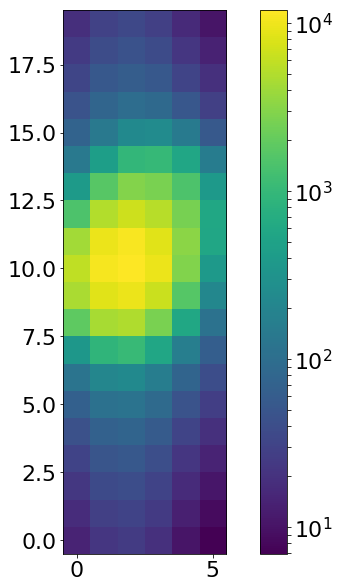

In [2263]:
plt.imshow(res_iapetus0[:,8:14],origin='lower',norm=LogNorm())
plt.colorbar()

In [2264]:
np.max(np.sum(res_iapetus0[:,8:14],axis=1))

41130.214944408202

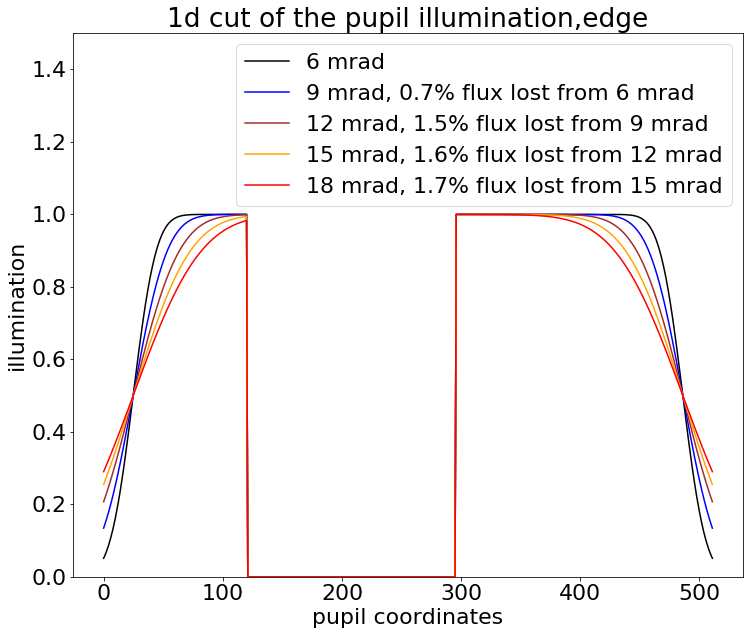

In [2265]:
plt.plot(pupililluminated0[256],color='black',label='6 mrad')
plt.plot(pupililluminated1[256],color='blue',label='9 mrad, '+"{:1.1f}".format((((1-(np.sum(pupililluminated1)/np.sum(pupililluminated0)))*100)))+'% flux lost from 6 mrad')
plt.plot(pupililluminated2[256],color='brown',label='12 mrad, '+"{:1.1f}".format((((1-(np.sum(pupililluminated2)/np.sum(pupililluminated1)))*100)))+'% flux lost from 9 mrad')
plt.plot(pupililluminated3[256],color='orange',label='15 mrad, '+"{:1.1f}".format((((1-(np.sum(pupililluminated3)/np.sum(pupililluminated2)))*100)))+'% flux lost from 12 mrad')
plt.plot(pupililluminated4[256],color='red',label='18 mrad, '+"{:1.1f}".format((((1-(np.sum(pupililluminated4)/np.sum(pupililluminated3)))*100)))+'% flux lost from 15 mrad')
plt.ylabel('illumination')
plt.xlabel('pupil coordinates')
plt.title('1d cut of the pupil illumination,edge')
plt.ylim(0,1.5)
plt.legend()

In [2266]:
list_of_sums=np.sum(res_iapetus0[:,8:14],axis=1)

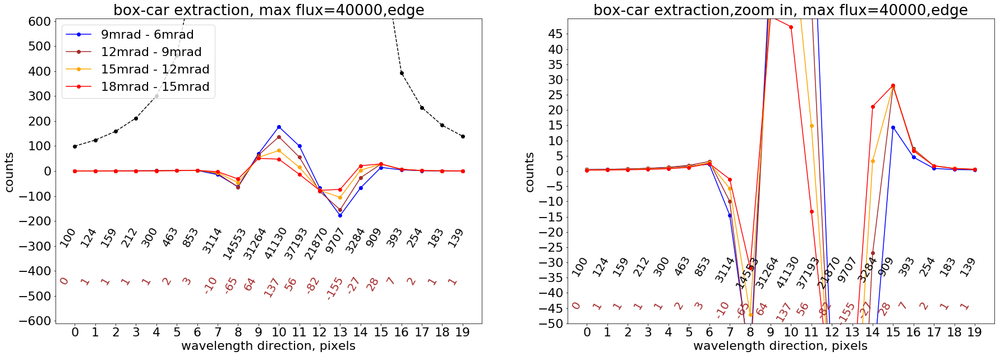

In [2268]:
plt.figure(figsize=(30,10))
plt.subplot(121)

plt.plot(np.sum(res_iapetus1[:,8:14],axis=1)-np.sum(res_iapetus0[:,8:14],axis=1),marker='o',color='blue',label='9mrad - 6mrad')
plt.plot(np.sum(res_iapetus2[:,8:14],axis=1)-np.sum(res_iapetus1[:,8:14],axis=1),marker='o',color='brown',label='12mrad - 9mrad')
plt.plot(np.sum(res_iapetus3[:,8:14],axis=1)-np.sum(res_iapetus2[:,8:14],axis=1),marker='o',color='orange',label='15mrad - 12mrad')
plt.plot(np.sum(res_iapetus4[:,8:14],axis=1)-np.sum(res_iapetus3[:,8:14],axis=1),marker='o',color='red',label='18mrad - 15mrad')
plt.plot(np.sum(res_iapetus0[:,8:14],axis=1),marker='o',color='black',ls='--')
#plt.plot(np.sum(sci_image[:,8:14],axis=1),marker='o',color='black',ls=':')
plt.ylabel("counts")
plt.xlabel("wavelength direction, pixels")
plt.title("box-car extraction, max flux=40000,edge")
plt.xticks(np.arange(0, 20, step=1))
plt.yticks(np.arange(-600,700, step=100))
plt.ylim(-610,610)
plt.legend(loc=2)

for i in range(20):
    plt.text(-0.8+i, -250, str("{:1.0f}".format(list_of_sums[i])), fontsize=20,rotation=60.)
    
for i in range(20):
    plt.text(-0.8+i, -450, str("{:1.0f}".format(np.sum(res_iapetus2[:,8:14],axis=1)[i]-np.sum(res_iapetus1[:,8:14],axis=1)[i])), fontsize=20,rotation=60.,color='brown')

plt.subplot(122)

plt.plot(np.sum(res_iapetus1[:,8:14],axis=1)-np.sum(res_iapetus0[:,8:14],axis=1),marker='o',color='blue')
plt.plot(np.sum(res_iapetus2[:,8:14],axis=1)-np.sum(res_iapetus1[:,8:14],axis=1),marker='o',color='brown')
plt.plot(np.sum(res_iapetus3[:,8:14],axis=1)-np.sum(res_iapetus2[:,8:14],axis=1),marker='o',color='orange')
plt.plot(np.sum(res_iapetus4[:,8:14],axis=1)-np.sum(res_iapetus3[:,8:14],axis=1),marker='o',color='red')
plt.plot(np.sum(res_iapetus0[:,8:14],axis=1),marker='o',color='black',ls='--')
plt.ylabel("counts")
plt.xlabel("wavelength direction, pixels")
plt.title("box-car extraction,zoom in, max flux=40000,edge")
plt.xticks(np.arange(0, 20, step=1))
plt.yticks(np.arange(-50,50, step=5))
plt.ylim(-50,50)

for i in range(20):
    plt.text(-0.8+i, -30, str("{:1.0f}".format(list_of_sums[i])), fontsize=20,rotation=60.)
    
for i in range(20):
    plt.text(-0.8+i, -45, str("{:1.0f}".format(np.sum(res_iapetus2[:,8:14],axis=1)[i]-np.sum(res_iapetus1[:,8:14],axis=1)[i])), fontsize=20,rotation=60.,color='brown')

In [2276]:
100*(np.sum(res_iapetus3[:,8:14],axis=1)-np.sum(res_iapetus2[:,8:14],axis=1))/np.sum(res_iapetus0[:,8:14],axis=1)

array([ 0.34285193,  0.32702794,  0.31611085,  0.30780404,  0.30603909,
        0.30798022,  0.31553595, -0.1856278 , -0.32297215,  0.17338992,
        0.19982326,  0.03986512, -0.35293637, -1.08620064,  0.10229319,
        3.0630011 ,  1.7412181 ,  0.6719621 ,  0.45482943,  0.39048569])

In [2271]:
(np.sum(res_iapetus1[:,8:14],axis=1)-np.sum(res_iapetus0[:,8:14],axis=1))

array([   0.47424426,    0.554877  ,    0.68066143,    0.86693894,
          1.17839064,    1.69310165,    2.20687008,  -14.51085205,
        -62.88767163,   69.02732771,  177.05965569,  100.26028086,
        -68.11648851, -178.11589848,  -67.59307322,   14.41165474,
          4.5158385 ,    0.8460475 ,    0.47107448,    0.37983239])

In [2270]:
np.sum(res_iapetus0[:,8:14],axis=1)

array([    99.5172031 ,    123.59721077,    158.610694  ,    211.97570451,
          300.29046745,    462.7999746 ,    852.65073551,   3114.08543101,
        14552.83944397,  31264.00185097,  41130.21494441,  37193.25382914,
        21869.93157438,   9706.92382906,   3284.31997601,    909.11754288,
          393.31393048,    254.17034048,    182.92201418,    139.29719372])

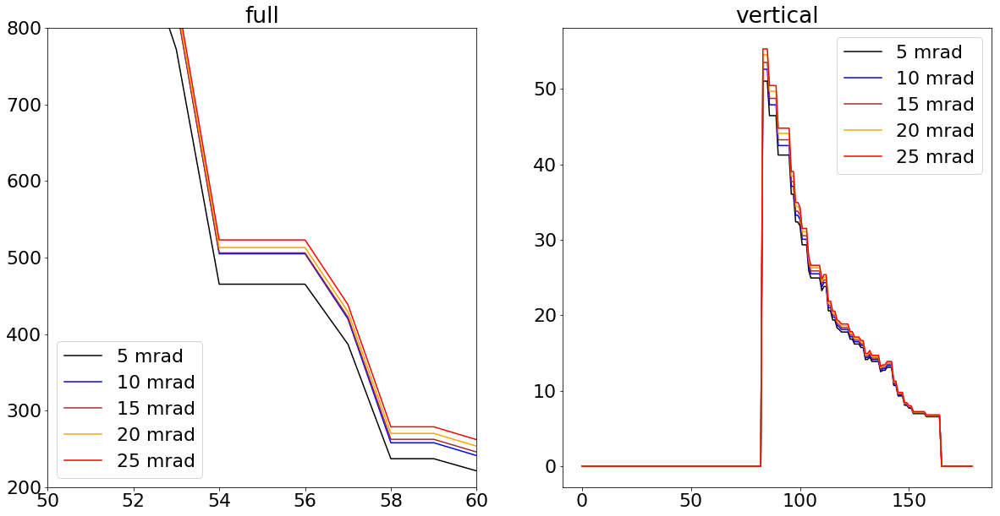

In [1903]:
plt.figure(figsize=(20,10))
plt.subplot(121)
list_of_masks=create_mask_100(res_iapetus0)
horizontal_cross=list_of_masks[1]
vertical_cross=list_of_masks[2]
diagonal_cross=list_of_masks[3]
center_square=list_of_masks[0]

result0=create_res_data(res_iapetus0,None,None,size_pixel=15)
result1=create_res_data(res_iapetus1,None,None,size_pixel=15)
result2=create_res_data(res_iapetus2,None,None,size_pixel=15)
result3=create_res_data(res_iapetus3,None,None,size_pixel=15)
result4=create_res_data(res_iapetus4,None,None,size_pixel=15)

plt.title('full')

plt.plot(result0,color='black',label='5 mrad')
plt.plot(result1,color='blue',label='10 mrad')
plt.plot(result2,color='brown',label='15 mrad')
plt.plot(result3,color='orange',label='20 mrad')
plt.plot(result4,color='red',label='25 mrad')
plt.legend()
plt.xlim(50,60)
plt.ylim(200,800)

plt.subplot(122)
result0_v=create_res_data(res_iapetus0,vertical_cross,None,size_pixel=15)
result1_v=create_res_data(res_iapetus1,vertical_cross,None,size_pixel=15)
result2_v=create_res_data(res_iapetus2,vertical_cross,None,size_pixel=15)
result3_v=create_res_data(res_iapetus3,vertical_cross,None,size_pixel=15)
result4_v=create_res_data(res_iapetus4,vertical_cross,None,size_pixel=15)

plt.title('vertical')
plt.plot(result0_v,color='black',label='5 mrad')
plt.plot(result1_v,color='blue',label='10 mrad')
plt.plot(result2_v,color='brown',label='15 mrad')
plt.plot(result3_v,color='orange',label='20 mrad')
plt.plot(result4_v,color='red',label='25 mrad')
plt.legend()

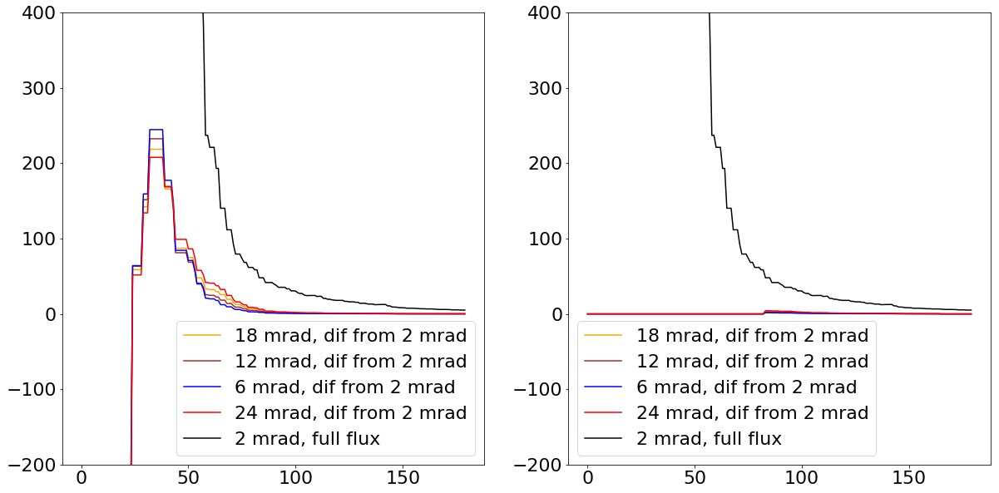

In [1897]:
plt.figure(figsize=(20,10))
plt.subplot(121)

plt.plot(range(180),np.array(result3)-np.array(result0),color='orange',label='18 mrad, dif from 2 mrad')
plt.plot(range(180),np.array(result2)-np.array(result0),color='brown',label='12 mrad, dif from 2 mrad')
plt.plot(range(180),np.array(result1)-np.array(result0),color='blue',label='6 mrad, dif from 2 mrad')
plt.plot(range(180),np.array(result4)-np.array(result0),color='red',label='24 mrad, dif from 2 mrad')

plt.plot(range(180),np.array(result0),color='black',label='2 mrad, full flux')
plt.ylim(-200,400)
plt.legend()

plt.subplot(122)


plt.plot(range(180),np.array(result3_v)-np.array(result0_v),color='orange',label='18 mrad, dif from 2 mrad')
plt.plot(range(180),np.array(result2_v)-np.array(result0_v),color='brown',label='12 mrad, dif from 2 mrad')
plt.plot(range(180),np.array(result1_v)-np.array(result0_v),color='blue',label='6 mrad, dif from 2 mrad')
plt.plot(range(180),np.array(result4_v)-np.array(result0_v),color='red',label='24 mrad, dif from 2 mrad')

plt.plot(range(180),np.array(result0),color='black',label='2 mrad, full flux')
plt.ylim(-200,400)
plt.legend()




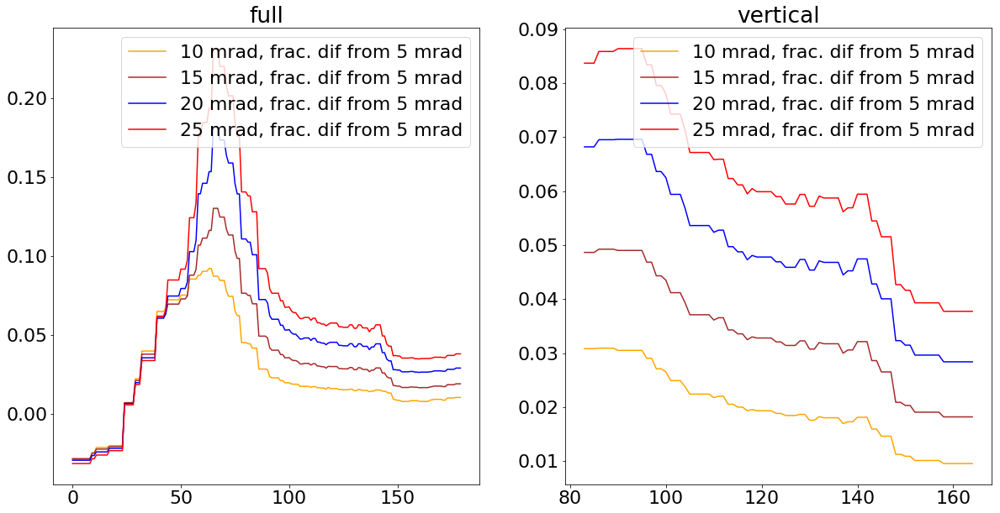

In [1898]:
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.title('full')

plt.plot(range(180),(np.array(result1)-np.array(result0))/np.array(result0),color='orange',label='10 mrad, frac. dif from 5 mrad')
plt.plot(range(180),(np.array(result2)-np.array(result0))/np.array(result0),color='brown',label='15 mrad, frac. dif from 5 mrad')
plt.plot(range(180),(np.array(result3)-np.array(result0))/np.array(result0),color='blue',label='20 mrad, frac. dif from 5 mrad')
plt.plot(range(180),(np.array(result4)-np.array(result0))/np.array(result0),color='red',label='25 mrad, frac. dif from 5 mrad')
plt.legend()

plt.subplot(122)
plt.title('vertical')

plt.plot(range(180),(np.array(result1_v)-np.array(result0_v))/np.array(result0_v),color='orange',label='10 mrad, frac. dif from 5 mrad')
plt.plot(range(180),(np.array(result2_v)-np.array(result0_v))/np.array(result0_v),color='brown',label='15 mrad, frac. dif from 5 mrad')
plt.plot(range(180),(np.array(result3_v)-np.array(result0_v))/np.array(result0_v),color='blue',label='20 mrad, frac. dif from 5 mrad')
plt.plot(range(180),(np.array(result4_v)-np.array(result0_v))/np.array(result0_v),color='red',label='25 mrad, frac. dif from 5 mrad')
plt.legend()


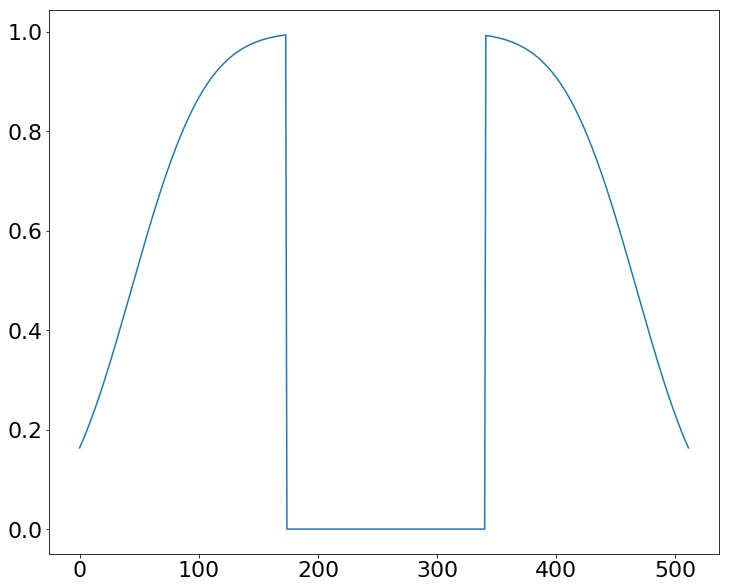

In [1716]:
plt.plot(pupililluminated3[256])

In [1717]:
pupililluminated=pupililluminated3

pupililluminated3[256]
res85=np.array(range(512))[(pupililluminated[256]<0.86) & (pupililluminated[256]>0.84)]
res85=res85[res85>256]

pupililluminated3[256]
res50=np.array(range(512))[(pupililluminated[256]<0.51) & (pupililluminated[256]>0.49)]
res50=res50[res50>np.mean(res85)]

((-np.mean(res85)+np.mean(res50))*2/2.07289)*0.196/res50

In [1688]:
((-np.mean(res85)+np.mean(res50))*2/2.07289)*0.196/res50

array([ 0.02053753,  0.02049346])

In [1507]:
((820-760)/2.07289)*0.196/790

0.007181314951283999

In [1521]:
create_res_data(res_iapetus0,None,1,size_pixel=15)

TypeError: create_res_data() got an unexpected keyword argument 'size_pixel'

In [1522]:
def create_res_data(FFTTest_fiber_and_pixel_convolved_downsampled_40,mask=None,custom_cent=None,size_pixel=None):
    
    if size_pixel is None:
        size_pixel=7.5
    
    image_shape=np.array(FFTTest_fiber_and_pixel_convolved_downsampled_40.shape)
    if custom_cent is None:
        xs0=0
        ys0=0
    else:

        xs0=(find_centroid_of_flux(FFTTest_fiber_and_pixel_convolved_downsampled_40)[0]-int(image_shape[0]/2))*size_pixel
        ys0=(find_centroid_of_flux(FFTTest_fiber_and_pixel_convolved_downsampled_40)[1]-int(image_shape[0]/2))*size_pixel
    pointsx = np.linspace(-(int(image_shape[0]*size_pixel)-size_pixel)/2,(int(image_shape[0]*size_pixel)-size_pixel)/2,num=int(image_shape[0]))
    pointsy = np.linspace(-(int(image_shape[0]*size_pixel)-size_pixel)/2,(int(image_shape[0]*size_pixel)-size_pixel)/2,num=int(image_shape[0]))
    xs, ys = np.meshgrid(pointsx, pointsy)
    r0 = np.sqrt((xs-xs0)** 2 + (ys-ys0)** 2)
    
    if mask is None:
        mask=np.ones((FFTTest_fiber_and_pixel_convolved_downsampled_40.shape[0],FFTTest_fiber_and_pixel_convolved_downsampled_40.shape[1]))
    
    distances=range(int(image_shape[0]/2*size_pixel*1.2))

    res_test_data=[]
    for r in distances:
        pixels_upper_limit=(mask*FFTTest_fiber_and_pixel_convolved_downsampled_40)[r0<(r+size_pixel)]
        pixels_lower_limit=(mask*FFTTest_fiber_and_pixel_convolved_downsampled_40)[r0<(r)]
        
        mask_upper_limit=mask[r0<(r+size_pixel)]
        mask_lower_limit=mask[r0<(r)]
        
        number_of_valid_pixels=np.sum(mask_upper_limit)-np.sum(mask_lower_limit)
        
        if number_of_valid_pixels==0:
            res_test_data.append(0)
        else:                  
            average_flux=(np.sum(pixels_upper_limit)-np.sum(pixels_lower_limit))/number_of_valid_pixels
            res_test_data.append(average_flux)        

    return res_test_data 

def find_centroid_of_flux(image):
    x_center=[]
    y_center=[]

    I_x=[]
    for i in range(image.shape[1]):
        I_x.append([i,np.sum(image[:,i])])

    I_x=np.array(I_x)

    I_y=[]
    for i in range(image.shape[0]):
        I_y.append([i,np.sum(image[i])])

    I_y=np.array(I_y)


    x_center=(np.sum(I_x[:,0]*I_x[:,1])/np.sum(I_x[:,1]))
    y_center=(np.sum(I_y[:,0]*I_y[:,1])/np.sum(I_y[:,1]))

    return(x_center,y_center)

def create_mask_100(FFTTest_fiber_and_pixel_convolved_downsampled_40,semi=None,central_cut_size=None):
    
    if central_cut_size is None:
        central_cut_size=6
            
    central_position=np.array(find_centroid_of_flux(FFTTest_fiber_and_pixel_convolved_downsampled_40))
    central_position_int=np.round(central_position)
    central_position_int_x=int(central_position_int[0])
    central_position_int_y=int(central_position_int[1])
    
    size=FFTTest_fiber_and_pixel_convolved_downsampled_40.shape[0]
    
    center_square=np.zeros((size,size))
    center_square[central_position_int_y-central_cut_size:+central_position_int_y+central_cut_size,central_position_int_x-central_cut_size:central_position_int_x+central_cut_size]=np.ones((int(2*central_cut_size),int(2*central_cut_size)))

    horizontal_cross=np.zeros((size,size))
    horizontal_cross[central_position_int_y-central_cut_size:central_position_int_y+central_cut_size,0:size,]=np.ones((int(2*central_cut_size),size))
    horizontal_cross_full=horizontal_cross
    horizontal_cross=horizontal_cross-center_square

    vertical_cross=np.zeros((size,size))
    if semi is None:
        vertical_cross[0:size,central_position_int_x-central_cut_size:central_position_int_x+central_cut_size]=np.ones((size,int(2*central_cut_size)))
        vertical_cross=vertical_cross-center_square
    if semi=='+':
        vertical_cross[central_position_int_y+central_cut_size:size,central_position_int_x-central_cut_size:central_position_int_x+central_cut_size]=np.ones((size-central_position_int_y-central_cut_size,int(2*central_cut_size)))
    if semi=='-':
        vertical_cross[0:central_position_int_y-central_cut_size,central_position_int_x-central_cut_size:central_position_int_x+central_cut_size]=np.ones((central_position_int_y-central_cut_size,int(2*central_cut_size)))
    vertical_cross_full=vertical_cross


    diagonal_cross=np.zeros((size,size))
    if semi is None:
        diagonal_cross[0:central_position_int_y-int(1.35*central_cut_size),0:central_position_int_x-int(1.35*central_cut_size)]=np.ones((central_position_int_y-int(1.35*central_cut_size),central_position_int_x-int(1.35*central_cut_size)))
        diagonal_cross[(central_position_int_y+int(1.35*central_cut_size)):size,0:(central_position_int_x-int(1.35*central_cut_size))]=np.ones((size-(central_position_int_y+int(1.35*central_cut_size)),(central_position_int_x-int(1.35*central_cut_size))))
        diagonal_cross[0:(central_position_int_y-int(1.35*central_cut_size)),(central_position_int_x+int(1.35*central_cut_size)):size]=np.ones(((central_position_int_y-int(1.35*central_cut_size)),size-(central_position_int_x+int(1.35*central_cut_size))))
        diagonal_cross[(central_position_int_y+int(1.35*central_cut_size)):size,(central_position_int_x+int(1.35*central_cut_size)):size]=np.ones((size-(central_position_int_y+int(1.35*central_cut_size)),size-(central_position_int_x+int(1.35*central_cut_size))))
    if semi=='+':
        diagonal_cross[(central_position_int_y+int(1.35*central_cut_size)):size,0:(central_position_int_x-int(1.35*central_cut_size))]=np.ones((size-(central_position_int_y+8),(central_position_int_x-int(1.35*central_cut_size))))
        diagonal_cross[(central_position_int_y+int(1.35*central_cut_size)):size,(central_position_int_x+int(1.35*central_cut_size)):size]=np.ones((size-(central_position_int_y+8),size-(central_position_int_x+int(1.35*central_cut_size))))
    if semi=='-':
        diagonal_cross[0:central_position_int_y-int(1.35*central_cut_size),0:central_position_int_x-int(1.35*central_cut_size)]=np.ones((central_position_int_y-int(1.35*central_cut_size),central_position_int_x-int(1.35*central_cut_size)))
        diagonal_cross[0:(central_position_int_y-int(1.35*central_cut_size)),(central_position_int_x+int(1.35*central_cut_size)):size]=np.ones(((central_position_int_y-int(1.35*central_cut_size)),size-(central_position_int_x+int(1.35*central_cut_size))))


    total_mask=np.zeros((size,size))
    if semi is None:
        total_mask=np.ones((size,size))
    if semi=='+':
        total_mask[(central_position_int_y):size,0:size]=np.ones((size-(central_position_int_y),size))
    if semi=='-':
        total_mask[:(central_position_int_y),0:size]=np.ones(((central_position_int_y),size))
    if semi=='r':
        total_mask[:(central_position_int_y),0:size]=np.ones(((central_position_int_y),size))  
    if semi=='l':
        total_mask[:(central_position_int_y),0:size]=np.ones(((central_position_int_y),size))   
        
    return [center_square,horizontal_cross,vertical_cross,diagonal_cross,total_mask]



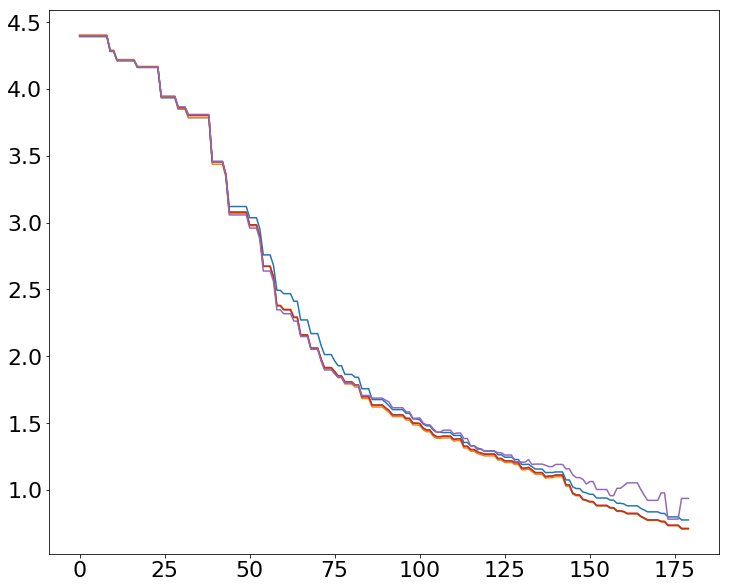

# Speed up

In [114]:
pupil_pre1=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil_pre1.npy') 
pupil_pre2=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil_pre2.npy') 

aperu_manual=[]
for i in range(len(pupil_pre1)):
    aperu_manual.append(np.linspace(-1,1,len(pupil_pre1), endpoint=True))
    #aperu_manual.append(np.linspace(-diam_sic*(size_of_ilum_in_units_of_radius/1),diam_sic*(size_of_ilum_in_units_of_radius/1),len(r_ilum), endpoint=True))

single_element=np.linspace(-1,1,len(pupil_pre1), endpoint=True)
u_manual=np.tile(single_element,(len(single_element),1))    
    
u_manual=np.array(aperu_manual)
v_manual=np.transpose(aperu_manual)  

In [91]:
single_element=np.linspace(-1,1,len(pupil_pre1), endpoint=True)
u_manual=np.tile(single_element,(len(single_element),1))
center_distance=np.sqrt(u_manual**2+v_manual**2)

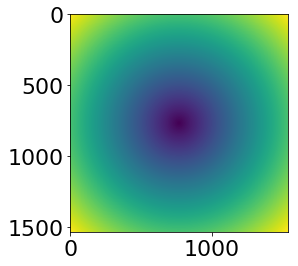

In [92]:
plt.imshow(center_distance)

In [86]:
res=[]
for i in np.linspace(0,1,int(len(pupil_pre1)/2), endpoint=True):
    res.append((scipy.special.erf((-i+0.9)*100)+1)/2)
    
res=np.array(res)

In [97]:
sigma=0.001
1/2*(scipy.special.erf((-i+0.9)/sigma)+scipy.special.erf((i+0.9)/sigma))

0.0

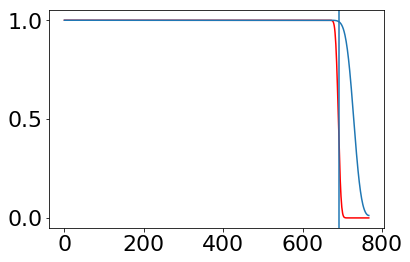

In [87]:
plt.plot(res,'r')
plt.plot(pupil_pre2[int(len(pupil_pre1)/2)][int(len(pupil_pre1)/2):])
plt.axvline(int(len(pupil_pre1)/2*0.9))

In [94]:
%timeit (scipy.special.erf((-center_distance+0.9)*100)+1)/2

47.8 ms ± 992 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


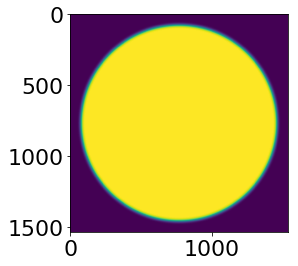

In [103]:
frd_sigma=0.01
sigma=2*frd_sigma
plt.imshow(1/2*(scipy.special.erf((-center_distance+0.9)/sigma)+scipy.special.erf((center_distance+0.9)/sigma)))

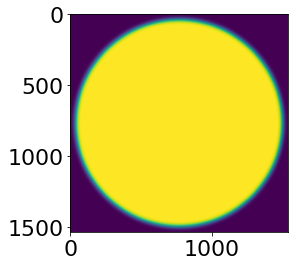

In [57]:
from scipy.ndimage.filters import gaussian_filter
plt.imshow(pupil_pre1)
frd_sigma=0.01
sigma=pupil_pre1.shape[0]*frd_sigma
pupil_pre2=gaussian_filter(pupil_pre1, sigma=sigma)
plt.imshow(pupil_pre2)

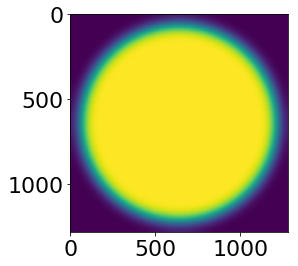

In [115]:
plt.imshow(pupil_pre2)

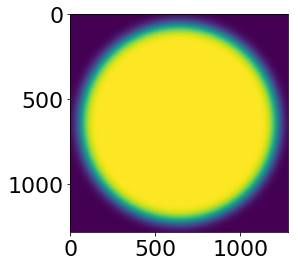

In [124]:
single_element=np.linspace(-1,1,len(pupil_pre1), endpoint=True)
u_manual=np.tile(single_element,(len(single_element),1))
v_manual=np.transpose(u_manual)  
center_distance=np.sqrt(u_manual**2+v_manual**2)

frd_sigma=0.04
sigma=2*frd_sigma
plt.imshow(1/2*(scipy.special.erf((-center_distance+0.9)/sigma)+scipy.special.erf((center_distance+0.9)/sigma)))

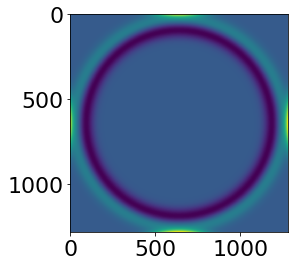

In [125]:
plt.imshow(pupil_pre2-1/2*(scipy.special.erf((-center_distance+0.9)/sigma)+scipy.special.erf((center_distance+0.9)/sigma)))

# Scattering 

In [197]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_radius','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  




sci_image_unit=np.ones((20,20))
var_image_unit=np.ones((20,20))

allparameters_proposal=np.array([0,0.09,0.02,-0.1,0.0,0.1,0.02,0.2,
                                 0.65,0.1,0.0,0.0,0.07,-0.2,
                                 0.7,1,-0.0,0.00,
                                 0.2,0.1,0.90,
                                 0.1,1,0.28,
                                 50000,20,2.5,0.01,
                                 0.47,1.85,1.0])

model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=1)   

res=model(allparameters_proposal)
print(res)
#assert res=-4808.04
#print('ok')

-3955.9506538


In [198]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')

optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled

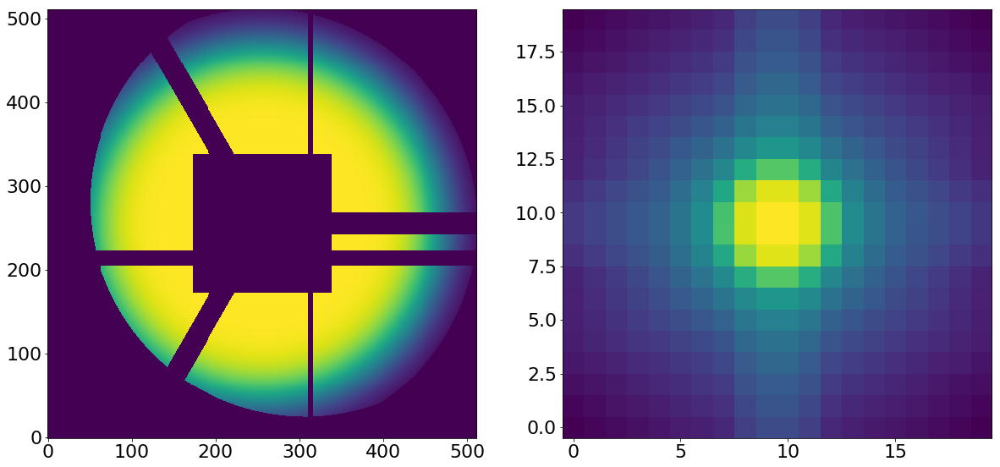

In [199]:
plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(pupililluminated,origin='lower')
plt.subplot(122)
plt.imshow(res_iapetus,norm=LogNorm(),origin='lower')

In [200]:
scattered_light_kernel=np.load(TESTING_FINAL_IMAGES_FOLDER+'scattered_light_kernel.npy')

In [189]:
scattered_light=np.load(TESTING_FINAL_IMAGES_FOLDER+'scattered_light.npy')

-3.0


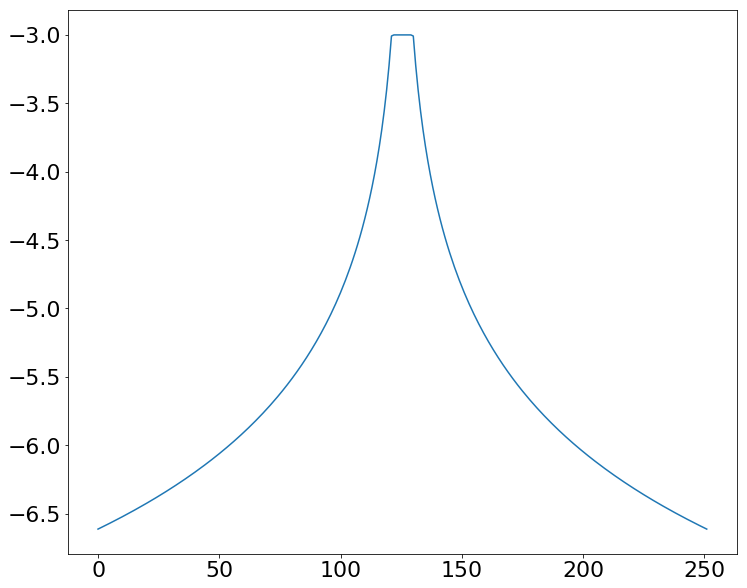

In [196]:
print(np.max(np.log10(scattered_light_kernel[126])))
plt.plot(np.log10(scattered_light_kernel[126]))

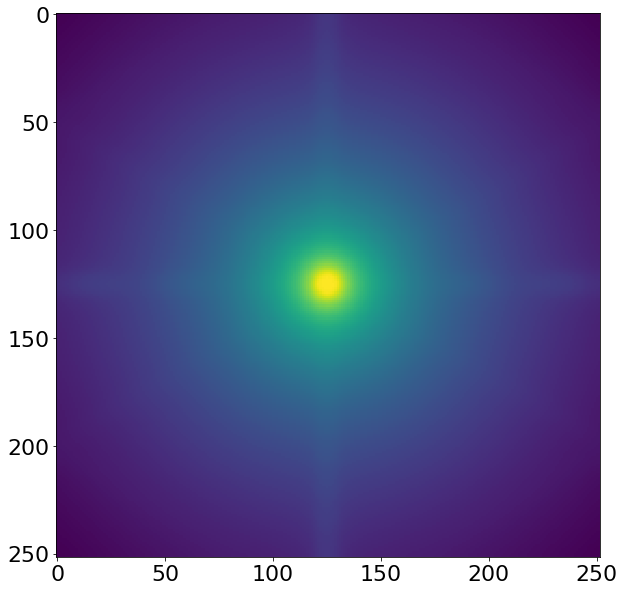

In [191]:
plt.imshow(scattered_light,norm=LogNorm())

# Investigation of scattering properties   (creation of scatter kernels)

## This code just to get underlying image with radius

In [574]:
# oversampling is 9

columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_radius','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  


sci_image_unit=np.ones((20,20))
var_image_unit=np.ones((20,20))

allparameters_proposal=np.array([0,0.09,0.02,-0.1,0.0,0.1,0.02,0.2,
                                 0.65,0.1,0.0,0.0,0.07,-0.2,
                                 0.7,1,-0.0,0.00,
                                 0.2,0.1,0.90,
                                 0.1,1,0.28,
                                 50000,20,2.5,0.005,
                                 0.47,1.85,1.0])

model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=1)   

res=model(allparameters_proposal)
print(res)

-4232.39904641


In [575]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
r0=np.load(TESTING_FINAL_IMAGES_FOLDER+'r0.npy')
optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_cut_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_downsampled.npy')

optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')

optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled

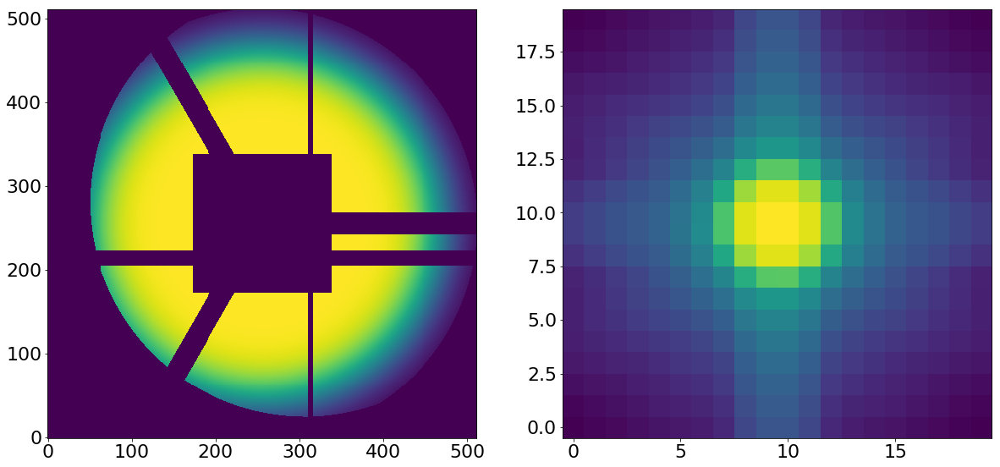

In [576]:
plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(pupililluminated,origin='lower')
plt.subplot(122)
plt.imshow(res_iapetus,norm=LogNorm(),origin='lower')

In [578]:
res=[]
for slope in np.arange(1.5,3.1,0.1):
    scattered_light_kernel=(r0**(-slope))
    scattered_light_kernel[r0<7.5]=7.5**(-slope)
    scattered_light_kernel[scattered_light_kernel == np.inf] = 0
    #print(scattered_light_kernel.shape)
    scattered_light_kernel=scattered_light_kernel*(0.01)/(10*np.max(scattered_light_kernel))
    res.append(np.sum(scattered_light_kernel[r0<150]))
    

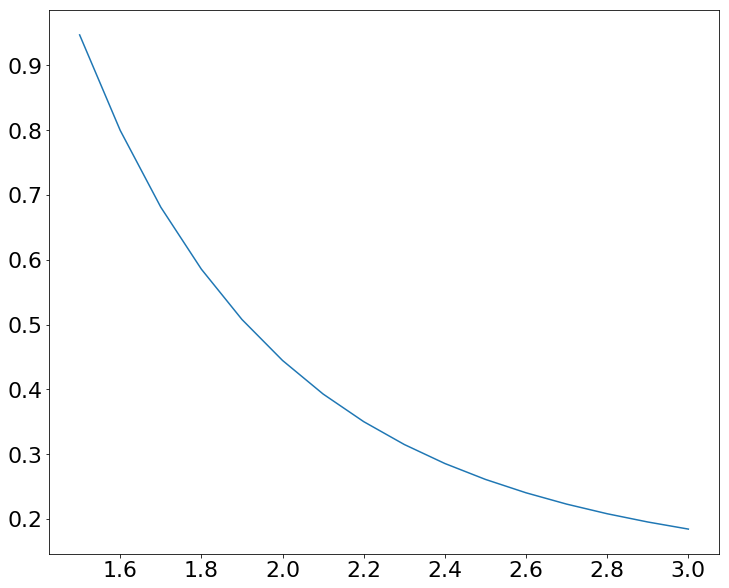

In [579]:
plt.plot(np.arange(1.5,3.1,0.1),res)

In [580]:
def create_scattering_amplitude_in_150(scattering_amplitude,scattering_slope):
    scattered_light_kernel=(r0**(-scattering_slope))
    scattered_light_kernel[r0<7.5]=7.5**(-scattering_slope)
    scattered_light_kernel[scattered_light_kernel == np.inf] = 0
    scattered_light_kernel=scattered_light_kernel*(scattering_amplitude)/(10*np.max(scattered_light_kernel))
    return np.sum(scattered_light_kernel[r0<150])

In [581]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Oct10'
descriptions=results_of_fit_many_interpolation_with_focus[label[0]].columns
for j in tqdm([7]):
    for i in range(1):

        x=single_number_for_single_pos_full[:,3][results_of_fit_many['0']['scattering_slope'].index.astype(int).values]
        y=single_number_for_single_pos_full[:,4][results_of_fit_many['0']['scattering_slope'].index.astype(int).values]
        values=scattering_amplitude_in_150
        colors=values
        area = np.pi * (15 * 1)**2  # 0 to 15 point radii

        # z5-z11
        if np.in1d([i],[0,1,2,3,4,5,6,7])[0] == True:
                abs_max_colors=max(np.abs(colors))
                max_colors=1
                min_colors=0 

        if np.in1d([i],[10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+min_dif
            min_colors=median_color-min_dif
            

            
        #'z4,dx,dy,chi'
        if np.in1d([i],[31,32])[0] == True:   
            max_colors=max(colors)
            min_colors=min(colors)

        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4176)
        plt.xlim(0,4294)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title('Scatter amplitude in r=150 microns, First fit')


        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneScatter/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneScatter/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
        plt.clf()







  0%|                                                                   | 0/1 [00:00<?, ?it/s]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/Oct10/PlaneScatter/z4/








100%|███████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.14it/s]







In [582]:
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Oct122018/' + 'results_of_fit_many_focus.pkl', 'rb') as f:
    results_of_fit_many_focus=pickle.load(f)

In [583]:
scattering_amplitude_in_150=[]
scattering_slope_values=results_of_fit_many_focus[label[j]]['scattering_slope'].values
scattering_amplitude_values=results_of_fit_many_focus[label[j]]['scattering_amplitude'].values

for i in range(len(results_of_fit_many_focus[label[j]]['scattering_slope'].index.astype(int).values)):
    scattering_amplitude_in_150.append(create_scattering_amplitude_in_150(scattering_amplitude_values[i],scattering_slope_values[i]))

In [584]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Oct10'
descriptions=results_of_fit_many_focus[label[0]].columns
for j in tqdm([7,8,9,10]):
    for i in range(1,2):

        x=single_number_for_single_pos_full[:,3][results_of_fit_many_focus[label[j]]['scattering_slope'].index.astype(int).values]
        y=single_number_for_single_pos_full[:,4][results_of_fit_many_focus[label[j]]['scattering_slope'].index.astype(int).values]
        
        
        scattering_amplitude_in_150=[]
        scattering_slope_values=results_of_fit_many_focus[label[j]]['scattering_slope'].values
        scattering_amplitude_values=results_of_fit_many_focus[label[j]]['scattering_amplitude'].values

        for l in range(len(results_of_fit_many_focus[label[j]]['scattering_slope'].index.astype(int).values)):
            scattering_amplitude_in_150.append(create_scattering_amplitude_in_150(scattering_amplitude_values[l],scattering_slope_values[l]))
        
        values=scattering_amplitude_in_150
        colors=values
        area = np.pi * (15 * 1)**2  # 0 to 15 point radii

        # z5-z11
        if np.in1d([i],[0,1,2,3,4,5,6,7])[0] == True:
                abs_max_colors=max(np.abs(colors))
                max_colors=0.2
                min_colors=0 

        if np.in1d([i],[10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+min_dif
            min_colors=median_color-min_dif
            

            
        #'z4,dx,dy,chi'
        if np.in1d([i],[31,32])[0] == True:   
            max_colors=max(colors)
            min_colors=min(colors)

        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4176)
        plt.xlim(0,4294)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title('Scatter amplitude in r=150 microns, Second fit, '+str(label[j]))


        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneScatter/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneScatter/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
        plt.clf()







  0%|                                                                   | 0/4 [00:00<?, ?it/s]





 25%|██████████████▊                                            | 1/4 [00:00<00:01,  1.69it/s]





 50%|█████████████████████████████▌                             | 2/4 [00:01<00:01,  1.23it/s]





 75%|████████████████████████████████████████████▎              | 3/4 [00:02<00:00,  1.39it/s]





100%|███████████████████████████████████████████████████████████| 4/4 [00:02<00:00,  1.52it/s]







In [585]:
# oversampling is 9

columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_radius','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  


sci_image_unit=np.ones((20,20))
var_image_unit=np.ones((20,20))

allparameters_proposal=np.array([0,0.09,0.02,-0.1,0.0,0.1,0.02,0.2,
                                 0.65,0.1,0.0,0.0,0.07,-0.2,
                                 0.7,1,-0.0,0.00,
                                 0.2,0.1,0.90,
                                 0.1,1,0.28,
                                 50000,20,2.5,0.005,
                                 0.47,1.85,1.0])

model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=1)   

res=model(allparameters_proposal)
print(res)

-4232.39904641


In [623]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
r0=np.load(TESTING_FINAL_IMAGES_FOLDER+'r0.npy')
optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_cut_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_downsampled.npy')
scattered_light_kernel=np.load(TESTING_FINAL_IMAGES_FOLDER+'scattered_light_kernel.npy')
optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')

optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled

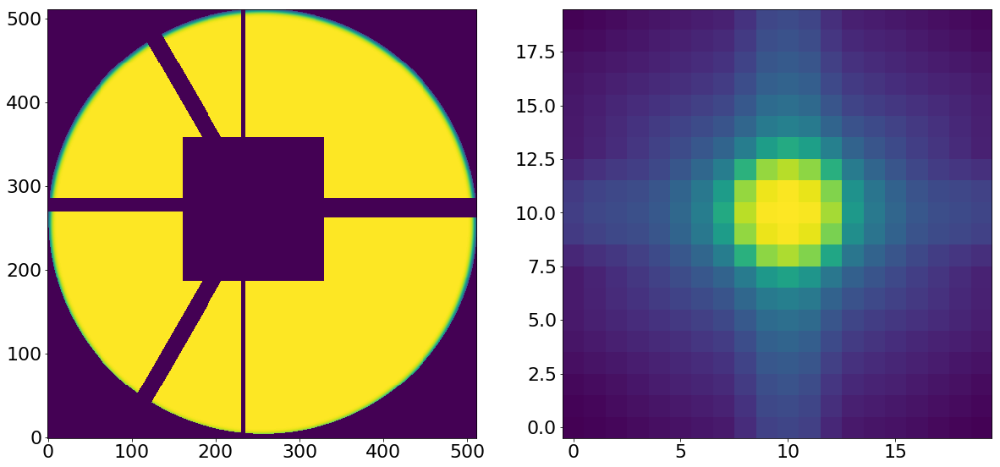

In [624]:
plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(pupililluminated,origin='lower')
plt.subplot(122)
plt.imshow(res_iapetus,norm=LogNorm(),origin='lower')

In [625]:
scattered_light= custom_fftconvolve(optPsf_cut_downsampled,scattered_light_kernel)
optPsf_cut_downsampled_scattered=optPsf_cut_downsampled+scattered_light 

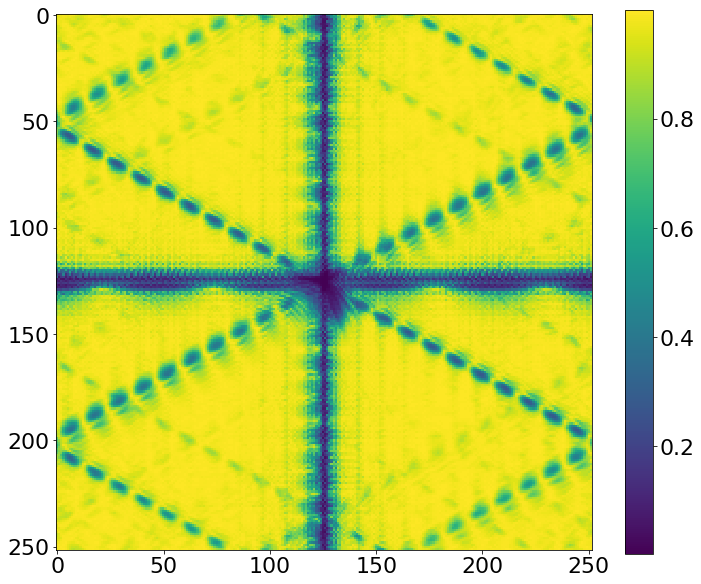

In [626]:
plt.imshow(scattered_light/optPsf_cut_downsampled_scattered)

plt.colorbar()

In [692]:
create_mask_20(res_iapetus)
list_of_masks=create_mask_20(res_iapetus)
horizontal_cross=list_of_masks[1]
vertical_cross=list_of_masks[2]
diagonal_cross=list_of_masks[3]
center_square=list_of_masks[0]

[single_number,np.sum(diagonal_cross*res_iapetus)/np.sum(center_square*res_iapetus)]

[99, 0.0045567634410641749]

## Data, diagonal/center without modelling

In [820]:
def create_mask(FFTTest_fiber_and_pixel_convolved_downsampled_40,semi=None):
    central_position=np.array(find_centroid_of_flux(FFTTest_fiber_and_pixel_convolved_downsampled_40))
    central_position_int=np.round(central_position)
    central_position_int_x=int(central_position_int[0])
    central_position_int_y=int(central_position_int[1])

    center_square=np.zeros((40,40))
    center_square[central_position_int_y-6:+central_position_int_y+6,central_position_int_x-6:central_position_int_x+6]=np.ones((12,12))

    horizontal_cross=np.zeros((40,40))
    horizontal_cross[central_position_int_y-6:central_position_int_y+6,0:40,]=np.ones((12,40))
    horizontal_cross_full=horizontal_cross
    horizontal_cross=horizontal_cross-center_square

    vertical_cross=np.zeros((40,40))
    if semi is None:
        vertical_cross[0:40,central_position_int_x-6:central_position_int_x+6]=np.ones((40,12))
        vertical_cross=vertical_cross-center_square
    if semi=='+':
        vertical_cross[central_position_int_y+6:40,central_position_int_x-6:central_position_int_x+6]=np.ones((40-central_position_int_y-6,12))
    if semi=='-':
        vertical_cross[0:central_position_int_y-6,central_position_int_x-6:central_position_int_x+6]=np.ones((central_position_int_y-6,12))
    vertical_cross_full=vertical_cross


    diagonal_cross=np.zeros((40,40))
    if semi is None:
        #print(central_position_int_y)
        #print(central_position_int_x)
        diagonal_cross[0:central_position_int_y-8,0:central_position_int_x-8]=np.ones((central_position_int_y-8,central_position_int_x-8))
        diagonal_cross[(central_position_int_y+8):40,0:(central_position_int_x-8)]=np.ones((40-(central_position_int_y+8),(central_position_int_x-8)))
        diagonal_cross[0:(central_position_int_y-8),(central_position_int_x+8):40]=np.ones(((central_position_int_y-8),40-(central_position_int_x+8)))
        diagonal_cross[(central_position_int_y+8):40,(central_position_int_x+8):40]=np.ones((40-(central_position_int_y+8),40-(central_position_int_x+8)))
    if semi=='+':
        diagonal_cross[(central_position_int_y+8):40,0:(central_position_int_x-8)]=np.ones((40-(central_position_int_y+8),(central_position_int_x-8)))
        diagonal_cross[(central_position_int_y+8):40,(central_position_int_x+8):40]=np.ones((40-(central_position_int_y+8),40-(central_position_int_x+8)))
    if semi=='-':
        diagonal_cross[0:central_position_int_y-8,0:central_position_int_x-8]=np.ones((central_position_int_y-8,central_position_int_x-8))
        diagonal_cross[0:(central_position_int_y-8),(central_position_int_x+8):40]=np.ones(((central_position_int_y-8),40-(central_position_int_x+8)))
    if semi=='r':
        diagonal_cross[(central_position_int_y+8):40,(central_position_int_x+8):40]=np.ones((40-(central_position_int_y+8),40-(central_position_int_x+8)))
        diagonal_cross[0:(central_position_int_y-8),(central_position_int_x+8):40]=np.ones(((central_position_int_y-8),40-(central_position_int_x+8)))
    if semi=='l':
        diagonal_cross[0:central_position_int_y-8,0:central_position_int_x-8]=np.ones((central_position_int_y-8,central_position_int_x-8))
        diagonal_cross[(central_position_int_y+8):40,0:(central_position_int_x-8)]=np.ones((40-(central_position_int_y+8),(central_position_int_x-8)))

    total_mask=np.zeros((40,40))
    if semi is None:
        total_mask=np.ones((40,40))
    if semi=='+':
        total_mask[(central_position_int_y):40,0:40]=np.ones((40-(central_position_int_y),40))
    if semi=='-':
        total_mask[:(central_position_int_y),0:40]=np.ones(((central_position_int_y),40))
    if semi=='r':
        total_mask[:(central_position_int_y),0:40]=np.ones(((central_position_int_y),40))  
    if semi=='l':
        total_mask[:(central_position_int_y),0:40]=np.ones(((central_position_int_y),40))   
        
    return [center_square,horizontal_cross,vertical_cross,diagonal_cross,total_mask]


def create_mask_20(FFTTest_fiber_and_pixel_convolved_downsampled_40,semi=None):
    central_position=np.array(find_centroid_of_flux(FFTTest_fiber_and_pixel_convolved_downsampled_40))
    central_position_int=np.round(central_position)
    central_position_int_x=int(central_position_int[0])
    central_position_int_y=int(central_position_int[1])

    center_square=np.zeros((20,20))
    center_square[central_position_int_y-3:+central_position_int_y+3,central_position_int_x-3:central_position_int_x+3]=np.ones((6,6))

    horizontal_cross=np.zeros((20,20))
    horizontal_cross[central_position_int_y-3:central_position_int_y+3,0:20,]=np.ones((6,20))
    horizontal_cross_full=horizontal_cross
    horizontal_cross=horizontal_cross-center_square

    vertical_cross=np.zeros((20,20))
    if semi is None:
        vertical_cross[0:20,central_position_int_x-3:central_position_int_x+3]=np.ones((20,6))
        vertical_cross=vertical_cross-center_square
    if semi=='+':
        vertical_cross[central_position_int_y+3:20,central_position_int_x-3:central_position_int_x+3]=np.ones((20-central_position_int_y-3,6))
    if semi=='-':
        vertical_cross[0:central_position_int_y-3,central_position_int_x-3:central_position_int_x+3]=np.ones((central_position_int_y-3,6))
    vertical_cross_full=vertical_cross


    diagonal_cross=np.zeros((20,20))
    if semi is None:
        #print(central_position_int_y)
        #print(central_position_int_x)
        diagonal_cross[0:central_position_int_y-4,0:central_position_int_x-4]=np.ones((central_position_int_y-4,central_position_int_x-4))
        diagonal_cross[(central_position_int_y+4):40,0:(central_position_int_x-4)]=np.ones((20-(central_position_int_y+4),(central_position_int_x-4)))
        diagonal_cross[0:(central_position_int_y-4),(central_position_int_x+4):20]=np.ones(((central_position_int_y-4),20-(central_position_int_x+4)))
        diagonal_cross[(central_position_int_y+4):20,(central_position_int_x+4):20]=np.ones((20-(central_position_int_y+4),20-(central_position_int_x+4)))
    if semi=='+':
        diagonal_cross[(central_position_int_y+4):20,0:(central_position_int_x-4)]=np.ones((20-(central_position_int_y+4),(central_position_int_x-4)))
        diagonal_cross[(central_position_int_y+4):20,(central_position_int_x+4):20]=np.ones((20-(central_position_int_y+4),20-(central_position_int_x+4)))
    if semi=='-':
        diagonal_cross[0:central_position_int_y-8,0:central_position_int_x-8]=np.ones((central_position_int_y-8,central_position_int_x-8))
        diagonal_cross[0:(central_position_int_y-8),(central_position_int_x+8):40]=np.ones(((central_position_int_y-8),40-(central_position_int_x+8)))
    if semi=='r':
        diagonal_cross[(central_position_int_y+8):40,(central_position_int_x+8):40]=np.ones((40-(central_position_int_y+8),40-(central_position_int_x+8)))
        diagonal_cross[0:(central_position_int_y-8),(central_position_int_x+8):40]=np.ones(((central_position_int_y-8),40-(central_position_int_x+8)))
    if semi=='l':
        diagonal_cross[0:central_position_int_y-8,0:central_position_int_x-8]=np.ones((central_position_int_y-8,central_position_int_x-8))
        diagonal_cross[(central_position_int_y+8):40,0:(central_position_int_x-8)]=np.ones((40-(central_position_int_y+8),(central_position_int_x-8)))

    total_mask=np.zeros((20,20))
    if semi is None:
        total_mask=np.ones((40,40))
    if semi=='+':
        total_mask[(central_position_int_y):40,0:40]=np.ones((40-(central_position_int_y),40))
    if semi=='-':
        total_mask[:(central_position_int_y),0:40]=np.ones(((central_position_int_y),40))
    if semi=='r':
        total_mask[:(central_position_int_y),0:40]=np.ones(((central_position_int_y),40))  
    if semi=='l':
        total_mask[:(central_position_int_y),0:40]=np.ones(((central_position_int_y),40))   
        
    return [center_square,horizontal_cross,vertical_cross,diagonal_cross,total_mask]

In [821]:

def find_centroid_of_flux(image):
    x_center=[]
    y_center=[]

    I_x=[]
    for i in range(image.shape[1]):
        I_x.append([i,np.sum(image[:,i])])

    I_x=np.array(I_x)

    I_y=[]
    for i in range(image.shape[0]):
        I_y.append([i,np.sum(image[i])])

    I_y=np.array(I_y)


    x_center=(np.sum(I_x[:,0]*I_x[:,1])/np.sum(I_x[:,1]))
    y_center=(np.sum(I_y[:,0]*I_y[:,1])/np.sum(I_y[:,1]))

    return(x_center,y_center)

In [822]:
obs='8600'
single_number=21

index_values=np.linspace(0,99,100).astype(int)[np.linspace(0,99,100).astype(int)!=36]

res=[]
for single_number in index_values:
    print(single_number)
    if obs=='8600':
        sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned_Dithered.npy')
        var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked_Dithered.npy')
    else:       
        sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned.npy')
        var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked.npy')
        
    list_of_masks=create_mask(sci_image)
    horizontal_cross=list_of_masks[1]
    vertical_cross=list_of_masks[2]
    diagonal_cross=list_of_masks[3]
    center_square=list_of_masks[0]
    
    res.append([single_number,np.sum(diagonal_cross*sci_image)/np.sum(center_square*sci_image)])
    
res40=np.array(res)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


In [823]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Oct10'
descriptions=results_of_fit_many_focus[label[0]].columns
for j in tqdm([7,8,9,10]):
    for i in range(1,2):

        x=single_number_for_single_pos_full[:,3][index_values]
        y=single_number_for_single_pos_full[:,4][index_values]
                
        values=res[:,1]
        colors=values
        area = np.pi * (15 * 1)**2  # 0 to 15 point radii

        # z5-z11
        if np.in1d([i],[0,1,2,3,4,5,6,7])[0] == True:
                abs_max_colors=max(np.abs(colors))
                max_colors=0.01
                min_colors=0 

        if np.in1d([i],[10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+min_dif
            min_colors=median_color-min_dif
            

            
        #'z4,dx,dy,chi'
        if np.in1d([i],[31,32])[0] == True:   
            max_colors=max(colors)
            min_colors=min(colors)

        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4176)
        plt.xlim(0,4294)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title('Data Direct, '+str(label[j]))


        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneDataDirect/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneDataDirect/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
        plt.clf()







  0%|                                                                   | 0/4 [00:00<?, ?it/s]







TypeError: list indices must be integers or slices, not tuple

In [922]:

obs='8603'


index_values=np.linspace(0,99,100).astype(int)[np.linspace(0,99,100).astype(int)!=83]

res=[]
for single_number in index_values:
    print(single_number)
    if obs=='8600':
        sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned_Dithered.npy')
        var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked_Dithered.npy')
    else:       
        sci_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/sci"+str(obs)+str(single_number)+'Stacked_Cleaned.npy')
        var_image=np.load("/Users/nevencaplar/Documents/PFS/TigerAnalysis/CutsForTigerAug15/var"+str(obs)+str(single_number)+'Stacked.npy')
        
    list_of_masks=create_mask_20(sci_image)
    horizontal_cross=list_of_masks[1]
    vertical_cross=list_of_masks[2]
    diagonal_cross=list_of_masks[3]
    center_square=list_of_masks[0]
    
    res.append([single_number,np.sum(diagonal_cross*sci_image)/np.sum(center_square*sci_image)])
    
res20=np.array(res)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


In [923]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Oct10'
descriptions=results_of_fit_many_focus[label[0]].columns
for j in tqdm([7,8,9,10]):
    for i in range(0,4):

        x=single_number_for_single_pos_full[:,3][index_values]
        y=single_number_for_single_pos_full[:,4][index_values]
                
        values=res20[:,1]
        colors=values
        area = np.pi * (15 * 1)**2  # 0 to 15 point radii

        # z5-z11
        if np.in1d([i],[0,1,2,3,4,5,6,7])[0] == True:
                abs_max_colors=max(np.abs(colors))
                max_colors=0.01
                min_colors=0 

        if np.in1d([i],[10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+min_dif
            min_colors=median_color-min_dif
            

            
        #'z4,dx,dy,chi'
        if np.in1d([i],[31,32])[0] == True:   
            max_colors=max(colors)
            min_colors=min(colors)

        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4176)
        plt.xlim(0,4294)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title('Data Direct, DiagonalOverCenter')


        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneDataDirect/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneDataDirect/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+'DiagonalOverCenter')
        plt.savefig(IMAGES_FOLDER2+'DiagonalOverCenter')
        plt.clf()







  0%|                                                                   | 0/4 [00:00<?, ?it/s]





 25%|██████████████▊                                            | 1/4 [00:03<00:09,  3.05s/it]





 50%|█████████████████████████████▌                             | 2/4 [00:04<00:04,  2.41s/it]





 75%|████████████████████████████████████████████▎              | 3/4 [00:06<00:02,  2.22s/it]





100%|███████████████████████████████████████████████████████████| 4/4 [00:08<00:00,  2.12s/it]







In [924]:
all_x[all_x>int(4096/2)]=all_x[all_x>int(4096/2)]+69

all_x_in_respect_to_center=all_x-int((4096+69)/2)
all_y_in_respect_to_center=all_y-int(4176/2)

def func(x,a1,a2,b1,b2,d,a1b1):
    return a1*x[0]+a2*x[0]**2+b1*x[1]+b2*x[1]**2+d+a1b1*x[0]*x[1]

In [925]:
single_selection_x=all_x_in_respect_to_center[index_values]
single_selection_y=all_y_in_respect_to_center[index_values]
single_selection_values=res20[:,1]
single_selection_array=np.transpose(np.array([single_selection_x,single_selection_y,single_selection_values]))    
popt, pcov = curve_fit(func, np.transpose(single_selection_array[:,[0,1]]), single_selection_array[:,2])
popt_cent_over_dia=popt

In [926]:
single_selection_x=all_x_in_respect_to_center
single_selection_y=all_y_in_respect_to_center

In [834]:
values=func([single_selection_x,single_selection_y],*popt)

In [837]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Oct10'
descriptions=results_of_fit_many_focus[label[0]].columns
for j in tqdm([7,8,9,10]):
    for i in range(3,4):

        x=single_number_for_single_pos_full[:,3]
        y=single_number_for_single_pos_full[:,4]
                
        colors=values
        area = np.pi * (15 * 1)**2  # 0 to 15 point radii

        # z5-z11
        if np.in1d([i],[0,1,2,3,4,5,6,7])[0] == True:
                abs_max_colors=max(np.abs(colors))
                max_colors=0.01
                min_colors=0 

        if np.in1d([i],[10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+min_dif
            min_colors=median_color-min_dif
            

            
        #'z4,dx,dy,chi'
        if np.in1d([i],[31,32])[0] == True:   
            max_colors=max(colors)
            min_colors=min(colors)

        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4176)
        plt.xlim(0,4294)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title('Data Direct, DiagonalOverCenter, Interpolation')


        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneDataDirect/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneDataDirect/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+'InterpolationDiagonalOverCenter')
        plt.savefig(IMAGES_FOLDER2+'InterpolationDiagonalOverCenter')
        plt.clf()







  0%|                                                                   | 0/4 [00:00<?, ?it/s]





 25%|██████████████▊                                            | 1/4 [00:00<00:01,  1.84it/s]





 50%|█████████████████████████████▌                             | 2/4 [00:01<00:01,  2.00it/s]





 75%|████████████████████████████████████████████▎              | 3/4 [00:01<00:00,  2.06it/s]





100%|███████████████████████████████████████████████████████████| 4/4 [00:01<00:00,  2.06it/s]







## Slopes of scatter from wide data

In [912]:
def create_mask_200(FFTTest_fiber_and_pixel_convolved_downsampled_40,semi=None):
    central_position=np.array(find_centroid_of_flux(FFTTest_fiber_and_pixel_convolved_downsampled_40))
    central_position_int=np.round(central_position)
    central_position_int_x=int(central_position_int[0])
    central_position_int_y=int(central_position_int[1])

    center_square=np.zeros((220,220))
    center_square[central_position_int_y-6:+central_position_int_y+6,central_position_int_x-6:central_position_int_x+6]=np.ones((12,12))

    horizontal_cross=np.zeros((220,220))
    horizontal_cross[central_position_int_y-6:central_position_int_y+6,0:220,]=np.ones((12,220))
    horizontal_cross_full=horizontal_cross
    horizontal_cross=horizontal_cross-center_square

    vertical_cross=np.zeros((220,220))
    if semi is None:
        vertical_cross[0:220,central_position_int_x-6:central_position_int_x+6]=np.ones((220,12))
        vertical_cross=vertical_cross-center_square
    if semi=='+':
        vertical_cross[central_position_int_y+6:220,central_position_int_x-6:central_position_int_x+6]=np.ones((220-central_position_int_y-6,12))
    if semi=='-':
        vertical_cross[0:central_position_int_y-6,central_position_int_x-6:central_position_int_x+6]=np.ones((central_position_int_y-6,12))
    vertical_cross_full=vertical_cross


    diagonal_cross=np.zeros((220,220))
    if semi is None:
        diagonal_cross[0:central_position_int_y-8,0:central_position_int_x-8]=np.ones((central_position_int_y-8,central_position_int_x-8))
        diagonal_cross[(central_position_int_y+8):220,0:(central_position_int_x-8)]=np.ones((220-(central_position_int_y+8),(central_position_int_x-8)))
        diagonal_cross[0:(central_position_int_y-8),(central_position_int_x+8):220]=np.ones(((central_position_int_y-8),220-(central_position_int_x+8)))
        diagonal_cross[(central_position_int_y+8):220,(central_position_int_x+8):220]=np.ones((220-(central_position_int_y+8),220-(central_position_int_x+8)))
    if semi=='+':
        diagonal_cross[(central_position_int_y+8):220,0:(central_position_int_x-8)]=np.ones((220-(central_position_int_y+8),(central_position_int_x-8)))
        diagonal_cross[(central_position_int_y+8):220,(central_position_int_x+8):220]=np.ones((220-(central_position_int_y+8),220-(central_position_int_x+8)))
    if semi=='-':
        diagonal_cross[0:central_position_int_y-8,0:central_position_int_x-8]=np.ones((central_position_int_y-8,central_position_int_x-8))
        diagonal_cross[0:(central_position_int_y-8),(central_position_int_x+8):220]=np.ones(((central_position_int_y-8),220-(central_position_int_x+8)))


    total_mask=np.zeros((220,220))
    if semi is None:
        total_mask=np.ones((220,220))
    if semi=='+':
        total_mask[(central_position_int_y):220,0:220]=np.ones((220-(central_position_int_y),220))
    if semi=='-':
        total_mask[:(central_position_int_y),0:220]=np.ones(((central_position_int_y),220))
    if semi=='r':
        total_mask[:(central_position_int_y),0:220]=np.ones(((central_position_int_y),220))  
    if semi=='l':
        total_mask[:(central_position_int_y),0:220]=np.ones(((central_position_int_y),220))   
        
    return [center_square,horizontal_cross,vertical_cross,diagonal_cross,total_mask]

In [913]:
def create_res_data(FFTTest_fiber_and_pixel_convolved_downsampled_40,mask=None,custom_cent=None):
    image_shape=np.array(FFTTest_fiber_and_pixel_convolved_downsampled_40.shape)
    if custom_cent is None:
        xs0=0
        ys0=0
    else:

        xs0=(find_centroid_of_flux(FFTTest_fiber_and_pixel_convolved_downsampled_40)[0]-int(image_shape[0]/2))*7.5
        ys0=(find_centroid_of_flux(FFTTest_fiber_and_pixel_convolved_downsampled_40)[1]-int(image_shape[0]/2))*7.5
    pointsx = np.linspace(-(int(image_shape[0]*7.5)-7.5)/2,(int(image_shape[0]*7.5)-7.5)/2,num=int(image_shape[0]))
    pointsy = np.linspace(-(int(image_shape[0]*7.5)-7.5)/2,(int(image_shape[0]*7.5)-7.5)/2,num=int(image_shape[0]))
    xs, ys = np.meshgrid(pointsx, pointsy)
    r0 = np.sqrt((xs-xs0)** 2 + (ys-ys0)** 2)
    
    if mask is None:
        mask=np.ones((FFTTest_fiber_and_pixel_convolved_downsampled_40.shape[0],FFTTest_fiber_and_pixel_convolved_downsampled_40.shape[1]))
    
    distances=range(int(image_shape[0]/2*7.5*12))

    res_test_data=[]
    for r in distances:
        pixels_upper_limit=(mask*FFTTest_fiber_and_pixel_convolved_downsampled_40)[r0<(r+7.5)]
        pixels_lower_limit=(mask*FFTTest_fiber_and_pixel_convolved_downsampled_40)[r0<(r)]
        
        mask_upper_limit=mask[r0<(r+7.5)]
        mask_lower_limit=mask[r0<(r)]
        
        number_of_valid_pixels=np.sum(mask_upper_limit)-np.sum(mask_lower_limit)
        
        if number_of_valid_pixels==0:
            res_test_data.append(0)
        else:                  
            average_flux=(np.sum(pixels_upper_limit)-np.sum(pixels_lower_limit))/number_of_valid_pixels
            res_test_data.append(average_flux)        

    return res_test_data   

In [914]:
res_diagonal=[]
for image_index in tqdm(range(100)):
    sci_image_dithered_pp=np.load("/Users/nevencaplar/Documents/PFS/2017-12-15-Rerun/Stamps_large/sci"+str(8600)+str(image_index)+'Stacked_Dithered.npy') 
    list_of_masks=create_mask_200(sci_image_dithered_pp)
    horizontal_cross=list_of_masks[1]
    vertical_cross=list_of_masks[2]
    diagonal_cross=list_of_masks[3]
    center_square=list_of_masks[0]
    res_diagonal_cross_large=create_res_data(sci_image_dithered_pp,diagonal_cross,1)
    res_diagonal.append(res_diagonal_cross_large)
    
res_diagonal=np.array(res_diagonal)







  0%|                                                                 | 0/100 [00:00<?, ?it/s]





  1%|▌                                                        | 1/100 [00:03<06:20,  3.85s/it]





  2%|█▏                                                       | 2/100 [00:07<06:22,  3.90s/it]





  3%|█▋                                                       | 3/100 [00:11<06:22,  3.94s/it]





  4%|██▎                                                      | 4/100 [00:15<06:11,  3.87s/it]





  5%|██▊                                                      | 5/100 [00:19<06:04,  3.83s/it]





  6%|███▍                                                     | 6/100 [00:22<06:00,  3.83s/it]





  7%|███▉                                                     | 7/100 [00:26<05:53,  3.80s/it]





  8%|████▌                                                    | 8/100 [00:30<05:55,  3.87s/it]





  9%|█████▏                                                   | 9/100 [00:34<05:51,  3.86s/it]

 69%|██████████████████████████████████████▋                 | 69/100 [04:13<01:54,  3.68s/it]





 70%|███████████████████████████████████████▏                | 70/100 [04:17<01:50,  3.67s/it]





 71%|███████████████████████████████████████▊                | 71/100 [04:20<01:46,  3.67s/it]





 72%|████████████████████████████████████████▎               | 72/100 [04:23<01:42,  3.66s/it]





 73%|████████████████████████████████████████▉               | 73/100 [04:26<01:38,  3.65s/it]





 74%|█████████████████████████████████████████▍              | 74/100 [04:30<01:34,  3.65s/it]





 75%|██████████████████████████████████████████              | 75/100 [04:33<01:31,  3.65s/it]





 76%|██████████████████████████████████████████▌             | 76/100 [04:36<01:27,  3.64s/it]





 77%|███████████████████████████████████████████             | 77/100 [04:39<01:23,  3.63s/it]





 78%|███████████████████████████████████████████▋            | 78/100 [04:43<01:19,  3.63s/it]







In [1220]:
res=[]
for i in range(100):
    res_55_diagonal_cross_large=res_diagonal[i]
    distances_large=range(len(res_55_diagonal_cross_large))
    z=np.polyfit(np.log10(np.array(distances_large[81:181])[np.log10(res_55_diagonal_cross_large[81:181])>0.5]),np.log10(res_55_diagonal_cross_large[81:181][np.log10(res_55_diagonal_cross_large[81:181])>0.5]),1)
    res.append([i,z[0]])
    
res=-np.array(res)

In [1221]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Oct10'
descriptions=results_of_fit_many_focus[label[0]].columns
index_values=range(100)
for j in tqdm([7,8,9,10]):
    for i in range(4,5):

        x=single_number_for_single_pos_full[:,3][index_values]
        y=single_number_for_single_pos_full[:,4][index_values]
                
        values=res[:,1]
        colors=values
        area = np.pi * (15 * 1)**2  # 0 to 15 point radii

        # z5-z11
        if np.in1d([i],[0,1,2,3,4,5,6,7])[0] == True:
                abs_max_colors=max(np.abs(colors))
                max_colors=3
                min_colors=2 

        if np.in1d([i],[10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+min_dif
            min_colors=median_color-min_dif
            

            
        #'z4,dx,dy,chi'
        if np.in1d([i],[31,32])[0] == True:   
            max_colors=max(colors)
            min_colors=min(colors)

        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4176)
        plt.xlim(0,4294)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title('Data Direct, SlopeWide')


        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneDataDirect/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneDataDirect/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+'SlopeWide')
        plt.savefig(IMAGES_FOLDER2+'SlopeWide')
        plt.clf()








  0%|                                                                   | 0/4 [00:00<?, ?it/s]





 25%|██████████████▊                                            | 1/4 [00:00<00:01,  1.79it/s]





 50%|█████████████████████████████▌                             | 2/4 [00:01<00:01,  1.92it/s]





 75%|████████████████████████████████████████████▎              | 3/4 [00:01<00:00,  2.00it/s]





100%|███████████████████████████████████████████████████████████| 4/4 [00:02<00:00,  1.94it/s]







In [1222]:
all_x[all_x>int(4096/2)]=all_x[all_x>int(4096/2)]+69

all_x_in_respect_to_center=all_x-int((4096+69)/2)
all_y_in_respect_to_center=all_y-int(4176/2)

def func(x,a1,a2,b1,b2,d,a1b1):
    return a1*x[0]+a2*x[0]**2+b1*x[1]+b2*x[1]**2+d+a1b1*x[0]*x[1]

In [1223]:
single_selection_x=all_x_in_respect_to_center
single_selection_y=all_y_in_respect_to_center
single_selection_values=res[:,1]
single_selection_array=np.transpose(np.array([single_selection_x,single_selection_y,single_selection_values]))    
popt, pcov = curve_fit(func, np.transpose(single_selection_array[:,[0,1]]), single_selection_array[:,2])


In [919]:
popt_slope=popt

In [1224]:
values=func([all_x_in_respect_to_center,all_y_in_respect_to_center],*popt)

In [1225]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Oct10'
descriptions=results_of_fit_many_focus[label[0]].columns
index_values=range(100)
for j in tqdm([7,8,9,10]):
    for i in range(4,5):

        x=single_number_for_single_pos_full[:,3][index_values]
        y=single_number_for_single_pos_full[:,4][index_values]
        colors=values
        area = np.pi * (15 * 1)**2  # 0 to 15 point radii

        # z5-z11
        if np.in1d([i],[0,1,2,3,4,5,6,7])[0] == True:
                abs_max_colors=max(np.abs(colors))
                max_colors=3
                min_colors=2 

        if np.in1d([i],[10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
            median_color=np.median(colors)
            up_limit=np.abs(max(colors)-median_color)
            low_limit=np.abs(min(colors)-median_color)
            max_dif=np.max([low_limit,up_limit])
            min_dif=np.min([low_limit,up_limit])
            max_colors=median_color+min_dif
            min_colors=median_color-min_dif
            

            
        #'z4,dx,dy,chi'
        if np.in1d([i],[31,32])[0] == True:   
            max_colors=max(colors)
            min_colors=min(colors)

        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4176)
        plt.xlim(0,4294)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title('Data Direct, Interpolation, SlopeWide')


        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneDataDirect/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneDataDirect/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+'InterpolationSlopeWide')
        plt.savefig(IMAGES_FOLDER2+'InterpolationSlopeWide')
        plt.clf()








  0%|                                                                   | 0/4 [00:00<?, ?it/s]





 25%|██████████████▊                                            | 1/4 [00:00<00:01,  1.77it/s]





 50%|█████████████████████████████▌                             | 2/4 [00:01<00:01,  1.86it/s]





 75%|████████████████████████████████████████████▎              | 3/4 [00:01<00:00,  1.89it/s]





100%|███████████████████████████████████████████████████████████| 4/4 [00:02<00:00,  1.89it/s]







## Finding Kernel

In [1195]:
# oversampling is 9

columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_radius','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  


sci_image_unit=np.ones((20,20))
var_image_unit=np.ones((20,20))

allparameters_proposal=np.array([0,0.00,0.00,-0.0,0.0,0.0,0.00,0.0,
                                 0.0,0.0,0.0,0.0,0.00,0.0,
                                 0.0,0,-0.0,0.00,
                                 0.0,0.0,0.98,
                                 0.05,1,0.0,
                                 120000,20,2.3,0.007273,
                                 0.5,1.85,1.0])

model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=1)   

res=model(allparameters_proposal)
print(res)

-4191.19998273


In [1196]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
r0=np.load(TESTING_FINAL_IMAGES_FOLDER+'r0.npy')
optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_cut_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_downsampled.npy')
scattered_light_kernel=np.load(TESTING_FINAL_IMAGES_FOLDER+'scattered_light_kernel.npy')
optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')

optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled

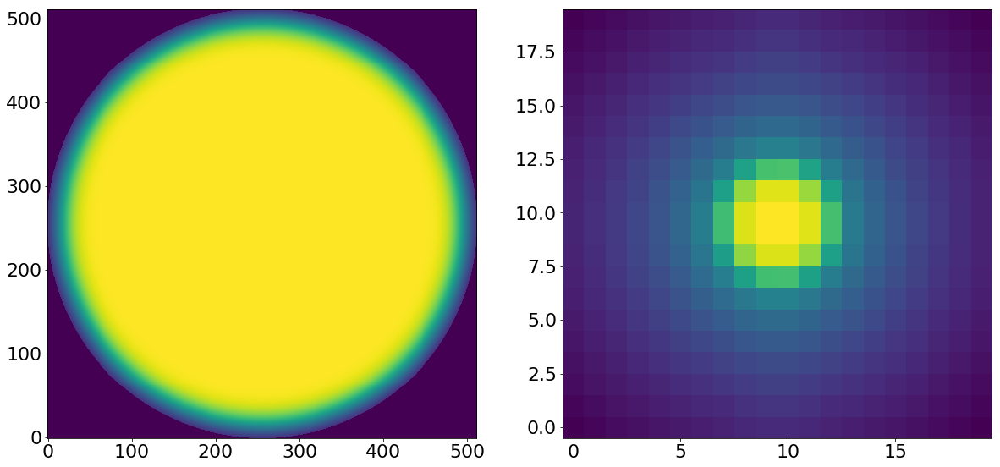

In [1197]:
plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(pupililluminated,origin='lower')
plt.subplot(122)
plt.imshow(res_iapetus,norm=LogNorm(),origin='lower')

In [1198]:
    list_of_masks=create_mask_20(res_iapetus)
    horizontal_cross=list_of_masks[1]
    vertical_cross=list_of_masks[2]
    diagonal_cross=list_of_masks[3]
    center_square=list_of_masks[0]
    
    print([single_number,np.sum(diagonal_cross*res_iapetus)/np.sum(center_square*res_iapetus)])

[99, 0.0086025347618814835]


In [1017]:
res=[]
for slope in tqdm(np.arange(2,3.1,0.1)):
    for amplitude in np.arange(0.001,0.01,0.001):
        allparameters_proposal=np.array([0,0.00,0.00,-0.0,0.0,0.0,0.00,0.0,
                                         0.0,0.0,0.0,0.0,0.00,0.0,
                                         0.0,0,-0.0,0.00,
                                         0.0,0.0,0.98,
                                         0.05,1,0.0,
                                         120000,20,slope,amplitude,
                                         0.5,1.85,1.0])

        model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=1)   

        model(allparameters_proposal)
        pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
        r0=np.load(TESTING_FINAL_IMAGES_FOLDER+'r0.npy')
        optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
        optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
        optPsf_cut_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_downsampled.npy')
        scattered_light_kernel=np.load(TESTING_FINAL_IMAGES_FOLDER+'scattered_light_kernel.npy')
        optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')

        optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')

        optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
        optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
        optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
        optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
        res_iapetus=optPsf_cut_fiber_convolved_downsampled

        list_of_masks=create_mask_20(res_iapetus)
        horizontal_cross=list_of_masks[1]
        vertical_cross=list_of_masks[2]
        diagonal_cross=list_of_masks[3]
        center_square=list_of_masks[0]

        res.append([slope,amplitude,np.sum(diagonal_cross*res_iapetus)/np.sum(center_square*res_iapetus)])







  0%|                                                                  | 0/11 [00:00<?, ?it/s]





  9%|█████▎                                                    | 1/11 [00:06<01:04,  6.42s/it]





 18%|██████████▌                                               | 2/11 [00:12<00:56,  6.33s/it]





 27%|███████████████▊                                          | 3/11 [00:19<00:50,  6.36s/it]





 36%|█████████████████████                                     | 4/11 [00:25<00:44,  6.39s/it]





 45%|██████████████████████████▎                               | 5/11 [00:31<00:38,  6.38s/it]





 55%|███████████████████████████████▋                          | 6/11 [00:38<00:31,  6.38s/it]





 64%|████████████████████████████████████▉                     | 7/11 [00:44<00:25,  6.35s/it]





 73%|██████████████████████████████████████████▏               | 8/11 [00:50<00:18,  6.28s/it]





 82%|███████████████████████████████████████████████▍          | 9/11 [00:56<00:12,  6.25s/it]

In [1030]:
res=np.array(res)
#p4b=np.poly1d(np.polyfit(res[:,0],res[:,1],4))
#plt.plot(res[:,0],res[:,1])
#plt.plot(res[:,0],p4(res[:,0])*15)
#plt.plot(res[:,0],p4b(res[:,0]))
res

array([[ 2.        ,  0.001     ,  0.00320134],
       [ 2.        ,  0.002     ,  0.00621616],
       [ 2.        ,  0.003     ,  0.00906973],
       [ 2.        ,  0.004     ,  0.01177464],
       [ 2.        ,  0.005     ,  0.01434222],
       [ 2.        ,  0.006     ,  0.01678267],
       [ 2.        ,  0.007     ,  0.0191052 ],
       [ 2.        ,  0.008     ,  0.02131815],
       [ 2.        ,  0.009     ,  0.0234291 ],
       [ 2.1       ,  0.001     ,  0.00240732],
       [ 2.1       ,  0.002     ,  0.00468035],
       [ 2.1       ,  0.003     ,  0.00683952],
       [ 2.1       ,  0.004     ,  0.0088932 ],
       [ 2.1       ,  0.005     ,  0.01084892],
       [ 2.1       ,  0.006     ,  0.01271353],
       [ 2.1       ,  0.007     ,  0.01449326],
       [ 2.1       ,  0.008     ,  0.01619376],
       [ 2.1       ,  0.009     ,  0.01782022],
       [ 2.2       ,  0.001     ,  0.00181156],
       [ 2.2       ,  0.002     ,  0.00352515],
       [ 2.2       ,  0.003     ,  0.005

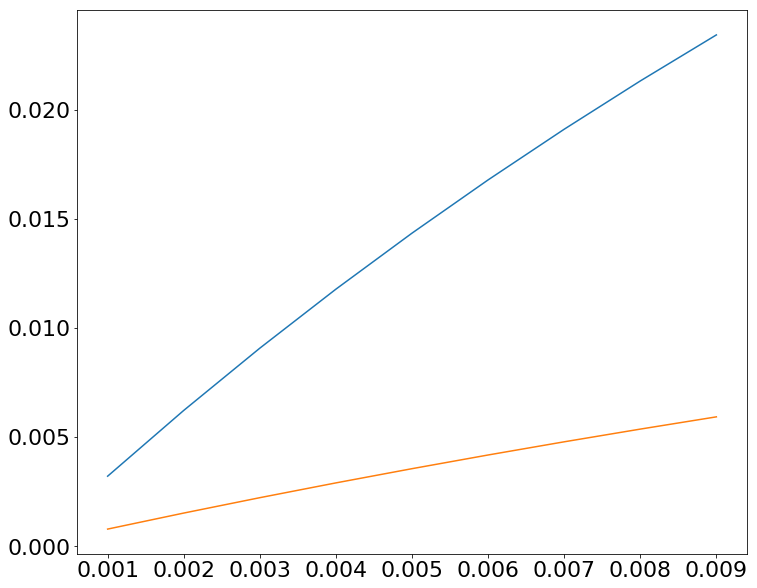

In [1037]:
plt.plot(res[res[:,0]==2][:,1],res[res[:,0]==2][:,2])
plt.plot(res[np.around(res[:,0],decimals=1)==2.5][:,1],res[np.around(res[:,0],decimals=1)==2.5][:,2])

In [1053]:
for i in np.arange(2,3.1,0.1):
    res_selection=res[(res[:,0]<(i+.05))&((i-.05)<res[:,0])]
    #print(res_selection)

[[ 2.          0.001       0.00320134]
 [ 2.          0.002       0.00621616]
 [ 2.          0.003       0.00906973]
 [ 2.          0.004       0.01177464]
 [ 2.          0.005       0.01434222]
 [ 2.          0.006       0.01678267]
 [ 2.          0.007       0.0191052 ]
 [ 2.          0.008       0.02131815]
 [ 2.          0.009       0.0234291 ]]
[[ 2.1         0.001       0.00240732]
 [ 2.1         0.002       0.00468035]
 [ 2.1         0.003       0.00683952]
 [ 2.1         0.004       0.0088932 ]
 [ 2.1         0.005       0.01084892]
 [ 2.1         0.006       0.01271353]
 [ 2.1         0.007       0.01449326]
 [ 2.1         0.008       0.01619376]
 [ 2.1         0.009       0.01782022]]
[[ 2.2         0.001       0.00181156]
 [ 2.2         0.002       0.00352515]
 [ 2.2         0.003       0.0051581 ]
 [ 2.2         0.004       0.00671598]
 [ 2.2         0.005       0.00820384]
 [ 2.2         0.006       0.00962631]
 [ 2.2         0.007       0.01098759]
 [ 2.2         0.008   

In [1056]:
list_of_p4b_functions=[]
for i in np.arange(2,3.1,0.1):
    res_selection=res[(res[:,0]<(i+.05))&((i-.05)<res[:,0])]
    p4b=np.poly1d(np.polyfit(res_selection[:,1],res_selection[:,2],4))
    list_of_p4b_functions.append([i,p4b])  
    

In [1057]:
list_of_p4b_functions[2]

[2.2000000000000002,
 poly1d([-16706.50699277,   1076.25646847,    -46.31978779,      1.84523015,
             0.0000116 ])]

## Creation of pandas dataframe

In [1183]:
with open("/Users/nevencaplar/Documents/PFS/Simulations/df_v01b.pkl", 'rb') as f:
    df_Scatter=pickle.load(f)

In [1184]:
number_of_fibers=600
parameters_that_are_0=columns[:20]
for fiber_i in range(number_of_fibers):
    for par in range(len(columns[:20])):
        df_Scatter.loc[['fiber_'+str(fiber_i+1)],parameters_that_are_0[par]]=np.full((1,25),0)[0]
        

In [1185]:
# parameters which are some fixed value
parameters_that_are_some_constant_value=[df_Scatter.columns.values[20],columns[21],columns[22],columns[23],columns[24],columns[25],columns[28],columns[29],columns[30]]
value_for_parameters_that_are_some_constant_value=[0.97,0.02,1,0,120000,20,0.45,1.85,1]

for fiber_i in range(number_of_fibers):
    for par in range(len(parameters_that_are_some_constant_value)):
        df_Scatter.loc[['fiber_'+str(fiber_i+1)],parameters_that_are_some_constant_value[par]]=np.full((1,25),value_for_parameters_that_are_some_constant_value[par])[0]




In [1186]:
# scattering slope
for fiber_i in range(number_of_fibers):
    single_fiber_y_data=detector_map[3].data[fiber_i][0]-int(4176/2)
    single_fiber_x_data=detector_map[3].data[fiber_i][1]-int(4096/2)
    single_fiber_wavelength_data=detector_map[3].data[fiber_i][3]
    for par in range(1):
        df_Scatter.loc[['fiber_'+str(fiber_i+1)],'scattering_slope']=func_focus([single_fiber_x_data,single_fiber_y_data],*popt_slope)

In [1187]:
# scattering amplitude

for fiber_i in range(number_of_fibers):
    single_fiber_y_data=detector_map[3].data[fiber_i][0]-int((4176)/2)
    single_fiber_x_data=detector_map[3].data[fiber_i][1]-int(4096/2)
    single_fiber_wavelength_data=detector_map[3].data[fiber_i][3]
    for par in range(1):
        values_to_hit=func_focus([single_fiber_x_data,single_fiber_y_data],*popt_cent_over_dia)

        list_of_p4b_functions_for_this_fiber=[]
        for i in ((np.around(func_focus([single_fiber_x_data,single_fiber_y_data],*popt_slope),1)-2)*10):
            list_of_p4b_functions_for_this_fiber.append(list_of_p4b_functions[int(np.rint(i))][1])

        amplitudes_for_this_fiber=[]
        for i in range(25)  :
            rooots=np.roots(list_of_p4b_functions_for_this_fiber[i]-values_to_hit[i])
            rooots=rooots[rooots.imag==0]
            solution=np.abs(rooots[np.min(rooots)==rooots])
            amplitudes_for_this_fiber.append(solution)

        amplitudes_for_this_fiber=np.array(amplitudes_for_this_fiber)
    #print([fiber_i,amplitudes_for_this_fiber])
    df_Scatter.loc[['fiber_'+str(fiber_i+1)],'scattering_amplitude']=amplitudes_for_this_fiber.ravel()

In [1199]:
df_Scatter.to_pickle("/Users/nevencaplar/Documents/PFS/Simulations/df_Scatter.pkl")

In [1188]:
df_Scatter.loc[['fiber_'+str(599+1)]]

z4   z5   z6   z7   z8   z9  z10  z11  hscFrac  strutFrac  \
fiber_600 spot_1   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_2   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_3   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_4   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_5   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_6   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_7   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_8   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_9   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_10  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_11  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_12  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_13  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_14  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_15  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_16  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_17  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_18  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_19  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_20  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_21  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_22  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_23  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_24  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   
          spot_25  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0      0.0        0.0   

                   ...   frd_sigma  det_vert  slitHolder_frac_dx  \
fiber_600 spot_1   ...        0.02       1.0                 0.0   
          spot_2   ...        0.02       1.0                 0.0   
          spot_3   ...        0.02       1.0                 0.0   
          spot_4   ...        0.02       1.0                 0.0   
          spot_5   ...        0.02       1.0                 0.0   
          spot_6   ...        0.02       1.0                 0.0   
          spot_7   ...        0.02       1.0                 0.0   
          spot_8   ...        0.02       1.0                 0.0   
          spot_9   ...        0.02       1.0                 0.0   
          spot_10  ...        0.02       1.0                 0.0   
          spot_11  ...        0.02       1.0                 0.0   
          spot_12  ...        0.02       1.0                 0.0   
          spot_13  ...        0.02       1.0                 0.0   
          spot_14  ...        0.02       1.0                 0.0   
          spot_15  ...        0.02       1.0                 0.0   
          spot_16  ...        0.02       1.0                 0.0   
          spot_17  ...        0.02       1.0                 0.0   
          spot_18  ...        0.02       1.0                 0.0   
          spot_19  ...        0.02       1.0                 0.0   
          spot_20  ...        0.02       1.0                 0.0   
          spot_21  ...        0.02       1.0                 0.0   
          spot_22  ...        0.02       1.0                 0.0   
          spot_23  ...        0.02       1.0                 0.0   
          spot_24  ...        0.02       1.0                 0.0   
          spot_25  ...        0.02       1.0                 0.0   

                   grating_lines  scattering_radius  scattering_slope  \
fiber_600 spot_1        120000.0               20.0          2.304609  

In [1146]:
values_to_hit=func_focus([single_fiber_x_data,single_fiber_y_data],*popt_cent_over_dia)

list_of_p4b_functions_for_this_fiber=[]
for i in ((np.around(func_focus([single_fiber_x_data,single_fiber_y_data],*popt_slope),1)-2)*10):
    list_of_p4b_functions_for_this_fiber.append(list_of_p4b_functions[int(np.rint(i))][1])
    
amplitudes_for_this_fiber=[]
for i in range(25)  :
    rooots=np.roots(list_of_p4b_functions_for_this_fiber[i]-values_to_hit[i])
    rooots=rooots[rooots.imag==0]
    solution=np.abs(rooots[np.min(rooots)==rooots])
    amplitudes_for_this_fiber.append(solution)
    
amplitudes_for_this_fiber=np.array(amplitudes_for_this_fiber)

In [1189]:
values_to_hit

array([ 0.0086026 ,  0.00804948,  0.00753181,  0.00704958,  0.0066028 ,
        0.00619146,  0.00581334,  0.00547308,  0.00516823,  0.00489881,
        0.0046648 ,  0.00446621,  0.00430215,  0.0041746 ,  0.00408246,
        0.00402573,  0.0040044 ,  0.00401847,  0.00406836,  0.00415344,
        0.00427392,  0.00442978,  0.00462103,  0.00484765,  0.00511137])

In [1091]:
for i in ((np.around(func_focus([single_fiber_x_data,single_fiber_y_data],*popt_slope),1)-2)*10):
    denominator=list_of_p4b_functions[int(np.rint(i))][1]

In [1115]:
func_focus([single_fiber_x_data,single_fiber_y_data],*popt_cent_over_dia)[1]

0.0080494753897733928

In [1114]:
list_of_p4b_functions[int(np.rint(i))][1]

poly1d([-1965.89498956,   151.97600538,    -8.40731003,     0.44210859,
           0.00001124])

In [1099]:
list_of_p4b_functions[int(np.rint(i))][1].fit(50,0,0)

AttributeError: 'poly1d' object has no attribute 'fit'

In [1116]:
rooots=np.roots(list_of_p4b_functions[int(np.rint(i))][1]-func_focus([single_fiber_x_data,single_fiber_y_data],*popt_cent_over_dia)[1])
rooots=rooots[rooots.imag==0]
solution=np.abs(rooots[np.min(rooots)==rooots])

In [1117]:
solution

array([ 0.02880652])

In [1118]:
list_of_p4b_functions[int(np.rint(i))]

[2.7000000000000006,
 poly1d([-1965.89498956,   151.97600538,    -8.40731003,     0.44210859,
            0.00001124])]

In [1119]:
func_focus([single_fiber_x_data,single_fiber_y_data],*popt_cent_over_dia)[1]

0.0080494753897733928

## Create Fits

In [1213]:
df_Scatter.loc['fiber_'+str(101+1),'spot_25']

z4                            0.000000
z5                            0.000000
z6                            0.000000
z7                            0.000000
z8                            0.000000
z9                            0.000000
z10                           0.000000
z11                           0.000000
hscFrac                       0.000000
strutFrac                     0.000000
dxFocal                       0.000000
dyFocal                       0.000000
slitFrac                      0.000000
slitFrac_dy                   0.000000
radiometricEffect             0.000000
radiometricExponent           0.000000
x_ilum                        0.000000
y_ilum                        0.000000
x_fiber                       0.000000
y_fiber                       0.000000
effective_ilum_radius         0.970000
frd_sigma                     0.020000
det_vert                      1.000000
slitHolder_frac_dx            0.000000
grating_lines            120000.000000
scattering_radius        

In [1214]:
from astropy.io import fits
import glob

def last_4chars(x):
    return(int(x[-6:-3].replace("_","").replace(".","")))

for fiber_i in tqdm(range(1,601)):
    new_hdul = fits.HDUList()
    single_fiber_names=sorted(glob.glob("/Users/nevencaplar/Documents/PFS/Simulations/Scatter/Result/Npy/fiber_"+str(fiber_i)+"_*"), key = last_4chars)

    for i in range(25):
        n=np.load(single_fiber_names[i])
        new_hdul.append(fits.ImageHDU(n))

    new_hdul.writeto('/Users/nevencaplar/Documents/PFS/Simulations/Scatter/Result/Fits/fiber_'+str(fiber_i)+'.fits',overwrite=True)







  0%|                                                                 | 0/600 [00:00<?, ?it/s]





  0%|                                                         | 1/600 [00:00<02:35,  3.84it/s]





  0%|▏                                                        | 2/600 [00:00<01:49,  5.45it/s]





  0%|▎                                                        | 3/600 [00:00<01:35,  6.26it/s]





  1%|▍                                                        | 4/600 [00:00<01:28,  6.73it/s]





  1%|▍                                                        | 5/600 [00:00<01:22,  7.18it/s]





  1%|▌                                                        | 6/600 [00:00<01:19,  7.46it/s]





  1%|▋                                                        | 7/600 [00:00<01:17,  7.67it/s]





  1%|▊                                                        | 8/600 [00:01<01:15,  7.84it/s]





  2%|▊                                                        | 9/600 [00:01<01:13,  7.99it/s]

 12%|██████▍                                                 | 69/600 [00:07<00:59,  8.90it/s]





 12%|██████▌                                                 | 70/600 [00:07<00:59,  8.91it/s]





 12%|██████▋                                                 | 71/600 [00:07<00:59,  8.91it/s]





 12%|██████▋                                                 | 72/600 [00:08<00:59,  8.92it/s]





 12%|██████▊                                                 | 73/600 [00:08<00:59,  8.92it/s]





 12%|██████▉                                                 | 74/600 [00:08<00:58,  8.92it/s]





 12%|███████                                                 | 75/600 [00:08<00:58,  8.93it/s]





 13%|███████                                                 | 76/600 [00:08<00:58,  8.93it/s]





 13%|███████▏                                                | 77/600 [00:08<00:58,  8.93it/s]





 13%|███████▎                                                | 78/600 [00:08<00:58,  8.94it/s]







 23%|████████████▋                                          | 138/600 [00:15<00:51,  8.95it/s]





 23%|████████████▋                                          | 139/600 [00:15<00:51,  8.96it/s]





 23%|████████████▊                                          | 140/600 [00:15<00:51,  8.96it/s]





 24%|████████████▉                                          | 141/600 [00:15<00:51,  8.96it/s]





 24%|█████████████                                          | 142/600 [00:15<00:51,  8.97it/s]





 24%|█████████████                                          | 143/600 [00:15<00:50,  8.97it/s]





 24%|█████████████▏                                         | 144/600 [00:16<00:50,  8.97it/s]





 24%|█████████████▎                                         | 145/600 [00:16<00:50,  8.98it/s]





 24%|█████████████▍                                         | 146/600 [00:16<00:50,  8.98it/s]





 24%|█████████████▍                                         | 147/600 [00:16<00:50,  8.98it/s]







 34%|██████████████████▉                                    | 207/600 [00:22<00:43,  9.04it/s]





 35%|███████████████████                                    | 208/600 [00:23<00:43,  9.04it/s]





 35%|███████████████████▏                                   | 209/600 [00:23<00:43,  9.04it/s]





 35%|███████████████████▎                                   | 210/600 [00:23<00:43,  9.04it/s]





 35%|███████████████████▎                                   | 211/600 [00:23<00:43,  9.05it/s]





 35%|███████████████████▍                                   | 212/600 [00:23<00:42,  9.05it/s]





 36%|███████████████████▌                                   | 213/600 [00:23<00:42,  9.05it/s]





 36%|███████████████████▌                                   | 214/600 [00:23<00:42,  9.05it/s]





 36%|███████████████████▋                                   | 215/600 [00:23<00:42,  9.05it/s]





 36%|███████████████████▊                                   | 216/600 [00:23<00:42,  9.05it/s]







 46%|█████████████████████████▎                             | 276/600 [00:30<00:35,  9.09it/s]





 46%|█████████████████████████▍                             | 277/600 [00:30<00:35,  9.09it/s]





 46%|█████████████████████████▍                             | 278/600 [00:30<00:35,  9.09it/s]





 46%|█████████████████████████▌                             | 279/600 [00:30<00:35,  9.09it/s]





 47%|█████████████████████████▋                             | 280/600 [00:30<00:35,  9.09it/s]





 47%|█████████████████████████▊                             | 281/600 [00:30<00:35,  9.09it/s]





 47%|█████████████████████████▊                             | 282/600 [00:31<00:34,  9.09it/s]





 47%|█████████████████████████▉                             | 283/600 [00:31<00:34,  9.09it/s]





 47%|██████████████████████████                             | 284/600 [00:31<00:34,  9.10it/s]





 48%|██████████████████████████▏                            | 285/600 [00:31<00:34,  9.10it/s]







 57%|███████████████████████████████▌                       | 345/600 [00:37<00:27,  9.13it/s]





 58%|███████████████████████████████▋                       | 346/600 [00:37<00:27,  9.13it/s]





 58%|███████████████████████████████▊                       | 347/600 [00:37<00:27,  9.13it/s]





 58%|███████████████████████████████▉                       | 348/600 [00:38<00:27,  9.13it/s]





 58%|███████████████████████████████▉                       | 349/600 [00:38<00:27,  9.13it/s]





 58%|████████████████████████████████                       | 350/600 [00:38<00:27,  9.13it/s]





 58%|████████████████████████████████▏                      | 351/600 [00:38<00:27,  9.13it/s]





 59%|████████████████████████████████▎                      | 352/600 [00:38<00:27,  9.13it/s]





 59%|████████████████████████████████▎                      | 353/600 [00:38<00:27,  9.12it/s]





 59%|████████████████████████████████▍                      | 354/600 [00:38<00:26,  9.12it/s]







 69%|█████████████████████████████████████▉                 | 414/600 [00:45<00:20,  9.06it/s]





 69%|██████████████████████████████████████                 | 415/600 [00:45<00:20,  9.05it/s]





 69%|██████████████████████████████████████▏                | 416/600 [00:45<00:20,  9.05it/s]





 70%|██████████████████████████████████████▏                | 417/600 [00:46<00:20,  9.05it/s]





 70%|██████████████████████████████████████▎                | 418/600 [00:46<00:20,  9.05it/s]





 70%|██████████████████████████████████████▍                | 419/600 [00:46<00:19,  9.06it/s]





 70%|██████████████████████████████████████▌                | 420/600 [00:46<00:19,  9.06it/s]





 70%|██████████████████████████████████████▌                | 421/600 [00:46<00:19,  9.06it/s]





 70%|██████████████████████████████████████▋                | 422/600 [00:46<00:19,  9.06it/s]





 70%|██████████████████████████████████████▊                | 423/600 [00:46<00:19,  9.06it/s]







 80%|████████████████████████████████████████████▎          | 483/600 [00:53<00:12,  9.06it/s]





 81%|████████████████████████████████████████████▎          | 484/600 [00:53<00:12,  9.06it/s]





 81%|████████████████████████████████████████████▍          | 485/600 [00:53<00:12,  9.06it/s]





 81%|████████████████████████████████████████████▌          | 486/600 [00:53<00:12,  9.07it/s]





 81%|████████████████████████████████████████████▋          | 487/600 [00:53<00:12,  9.07it/s]





 81%|████████████████████████████████████████████▋          | 488/600 [00:53<00:12,  9.07it/s]





 82%|████████████████████████████████████████████▊          | 489/600 [00:53<00:12,  9.07it/s]





 82%|████████████████████████████████████████████▉          | 490/600 [00:54<00:12,  9.07it/s]





 82%|█████████████████████████████████████████████          | 491/600 [00:54<00:12,  9.07it/s]





 82%|█████████████████████████████████████████████          | 492/600 [00:54<00:11,  9.07it/s]







 92%|██████████████████████████████████████████████████▌    | 552/600 [01:00<00:05,  9.05it/s]





 92%|██████████████████████████████████████████████████▋    | 553/600 [01:01<00:05,  9.05it/s]





 92%|██████████████████████████████████████████████████▊    | 554/600 [01:01<00:05,  9.05it/s]





 92%|██████████████████████████████████████████████████▉    | 555/600 [01:01<00:04,  9.05it/s]





 93%|██████████████████████████████████████████████████▉    | 556/600 [01:01<00:04,  9.05it/s]





 93%|███████████████████████████████████████████████████    | 557/600 [01:01<00:04,  9.05it/s]





 93%|███████████████████████████████████████████████████▏   | 558/600 [01:01<00:04,  9.05it/s]





 93%|███████████████████████████████████████████████████▏   | 559/600 [01:01<00:04,  9.05it/s]





 93%|███████████████████████████████████████████████████▎   | 560/600 [01:01<00:04,  9.04it/s]





 94%|███████████████████████████████████████████████████▍   | 561/600 [01:02<00:04,  9.04it/s]







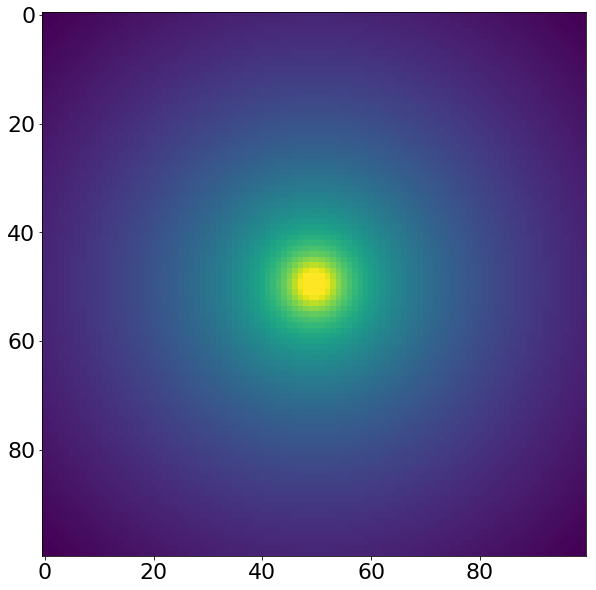

In [1217]:
plt.imshow(n,norm=LogNorm())

In [1218]:
np.sum(n)

0.10224027327856139